### Set up Pyro connection to the board
``soc`` and ``soccfg`` live on the board, and we interact with them through pyro proxy objects.  This section of code connects to the pyro server running on the board to receive these objects

In [17]:
## ------------------------------------------------ ##
import Pyro4
from qick import *

Pyro4.config.SERIALIZER = "pickle"
Pyro4.config.PICKLE_PROTOCOL_VERSION=4

ns_host = "192.168.137.93"
ns_port = 8883
proxy_name = "DMQIS_qick"
ns = Pyro4.locateNS(host=ns_host, port=ns_port)

for k,v in ns.list().items():
    print(k,v)

soc = Pyro4.Proxy(ns.lookup(proxy_name))
soccfg = QickConfig(soc.get_cfg())
#print(soccfg)
## ------------------------------------------------ ##

Pyro.NameServer PYRO:Pyro.NameServer@192.168.137.93:8883
DMQIS_qick PYRO:obj_b45d254b920a402a8e075a9243172164@192.168.137.103:43603


In [19]:
import numpy as np
import matplotlib.pyplot as plt
from qick import *
import sys
sys.path.append('./Libraries')
from qick_data import *
from qick_helpers import *
from qick_programs import *
import time

datapath = 'c:\\_Data\\Hannah\\SQUAT_freqscan_over_time\\overnight2'

### Set up data handling

In [24]:
## Initialize a measurement object
## This object holds dictionaries
## Not much else to it.  Just a container that handles export/import
meas = QICKdata()

## Next we fill the metadata dictionary
meas.set_metadata(device="C11", qubits=["1"], meas_type="freq_scan_over_time")

## Then specify the connection channels
meas.set_hw_cfg(res_ch=transmission_ch, qu_ch=None, ro_ch=ro_ch)

## Finally specify pulse parameters
meas.meas_cfg = {"relax_delay_us" : 0.4,
            "adc_trig_offset_us"  : 0.506,
            "readout_length_us"   : 2,
   
            "res_pulse_style" : "const",
            "res_length_us" : 2, #0.279,
            "res_phase"     : 0,
            "res_gain" : 6000,

            ## [Sweep param] "res_freq" : 3000,

            "reps"          : 20000,  ## Averages in firmware
            "soft_avgs"     : 1,      ## Averages in software
       }

## Convert time variables from us to clock ticks
meas = convert_time_vars(soccfg, meas)
print(meas)

## Set up sweep values
nscans = 30
RF_freqs = np.linspace(7340, 7370, num=600)

## Do measurement
Ivals = np.zeros(nscans, len(RF_freqs))
Qvals = np.zeros(nscans, len(RF_freqs))
times = np.zeros(nscans)
config = {**meas.hw_cfg, **meas.meas_cfg}
for j in range(nscans):
    times[j] = time.time
    for i, f in enumerate(RF_freqs):
        config["res_freq"] = f
        prog =oneTonePulse(soccfg, config)
        [[I]], [[Q]] = prog.acquire(soc)
        Ivals[j][i] = I
        Qvals[j][i] = Q

##  IMPORTANT make sure you save the data
meas.meas_data = {"nscans" : nscans, "timestamps" : times, "RF_freqs" : RF_freqs, "Ivals" : Ivals, "Qvals" : Qvals, "datastorage" : "IQvalue[time index][freq index]"}
meas.write_H5(datapath)


Creating dataset with series 20240503_103645
converting time variables from us to clock ticks
====---------------------------====
         20240503_103645
====---------------------------====
       Device =  C11
       Qubits =  ['1']
    Meas Type =  repeated_freq_scan
====---------------------------====
20240503_103645
2840.0 2870.0
Saving data as: 20240503_103645_repeated_freq_scan.h5


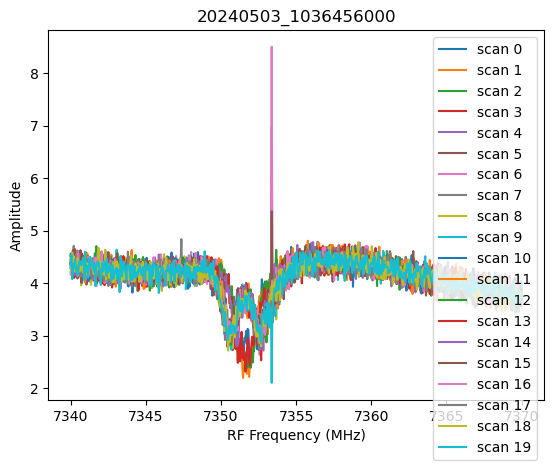

Text(0.5, 1.0, '20240503_1036456000')

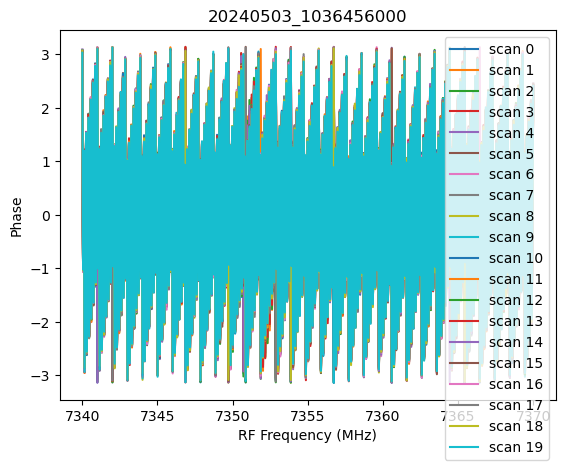

In [25]:
m1 = 7349
m2 = 7355

for i in range(nscans):
    plt.plot(RF_freqs, np.sqrt(Ivals[i]**2 + Qvals[i]**2), label='scan ' + str(i))
#plt.axvline(7358, color='r', linestyle='--', label='7350MHz')
plt.xlabel('RF Frequency (MHz)')
plt.ylabel('Amplitude')
#plt.axvline(m1, color='r', linestyle='--', label=str(m1))
#plt.axvline(m2, color='orange', linestyle='--', label=str(m2))
plt.legend()
plt.title(meas.meta['series'] + str(meas.meas_cfg['res_gain']))
plt.savefig(datapath + '\\' + meas.meta['series'] + '_amp_.png')
plt.show()

for i in range(nscans):
    plt.plot(RF_freqs, np.angle(Ivals[i] + 1j*Qvals[i]), label='scan ' + str(i))
#plt.axvline(7358, color='r', linestyle='--', label='7350MHz')
plt.xlabel('RF Frequency (MHz)')
plt.ylabel('Phase')
#plt.axvline(m1, color='r', linestyle='--', label=str(m1))
#plt.axvline(m2, color='orange', linestyle='--', label=str(m2))
plt.legend()
plt.title(meas.meta['series'] + str(meas.meas_cfg['res_gain']))
#plt.savefig(datapath + '\\' + meas.meta['series'] + '_phase_.png')



# Alternating TL/CB version

In [14]:
def freq_scan(res_ch, config, RF_freqs, measname, datapath):
    ## Measure through transmission line
    meas = QICKdata()
    meas.set_metadata(device="C11", qubits=["1"], meas_type=("freq_scan_"+measname))
    meas.set_hw_cfg(res_ch=res_ch, qu_ch=None, ro_ch=ro_ch)
    meas.meas_cfg = config

    ## Convert time variables from us to clock ticks
    meas = convert_time_vars(soccfg, meas)

    ## Do measurement
    Ivals = np.zeros(len(RF_freqs))
    Qvals = np.zeros(len(RF_freqs))
    config = {**meas.hw_cfg, **meas.meas_cfg}
    for i, f in enumerate(RF_freqs):
        config["res_freq"] = f
        prog =oneTonePulse(soccfg, config)
        [[I]], [[Q]] = prog.acquire(soc)
        Ivals[i] = I
        Qvals[i] = Q

    ##  IMPORTANT make sure you save the data
    meas.meas_data = {"RF_freqs" : RF_freqs, "Ivals" : Ivals, "Qvals" : Qvals}

    meas.write_H5(datapath)

    plt.plot(RF_freqs, np.sqrt(Ivals**2 + Qvals**2))
    plt.xlabel('RF Frequency (MHz)')
    plt.ylabel('Amplitude')
    plt.title(meas.meta['series'] + " through " + measname)
    plt.savefig(datapath + '\\' + meas.meta['series'] + '_' + measname + '.png')
    plt.show()
    return


Creating dataset with series 20240513_014809
converting time variables from us to clock ticks
Datapath doesn't exist yet. Making new datapath
Saving data as: 20240513_014809_freq_scan_TL.h5


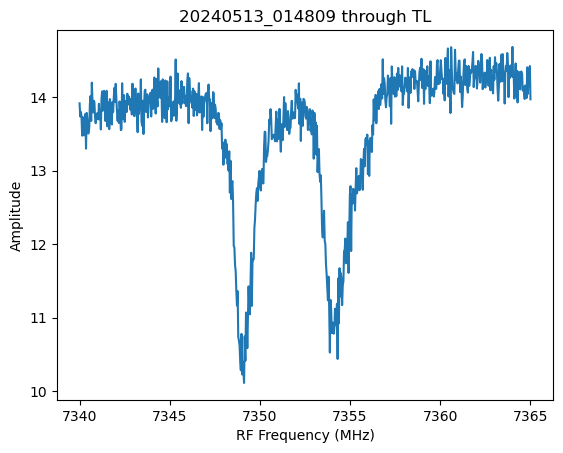

Creating dataset with series 20240513_015027
converting time variables from us to clock ticks
Saving data as: 20240513_015027_freq_scan_CB.h5


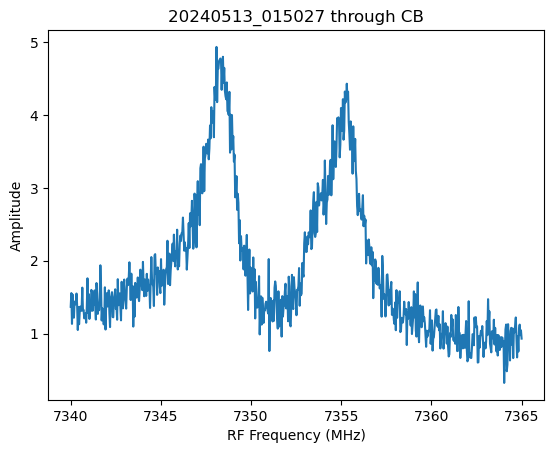

Creating dataset with series 20240513_015218
converting time variables from us to clock ticks
Saving data as: 20240513_015218_freq_scan_TL.h5


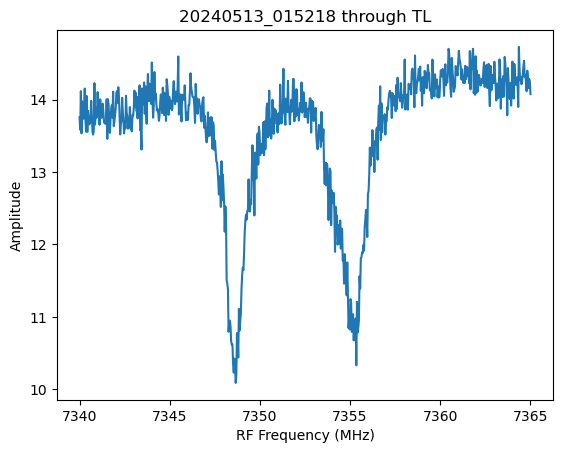

Creating dataset with series 20240513_015436
converting time variables from us to clock ticks
Saving data as: 20240513_015436_freq_scan_CB.h5


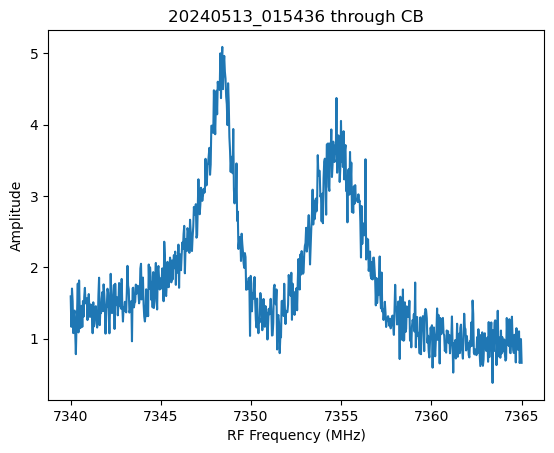

Creating dataset with series 20240513_015627
converting time variables from us to clock ticks
Saving data as: 20240513_015627_freq_scan_TL.h5


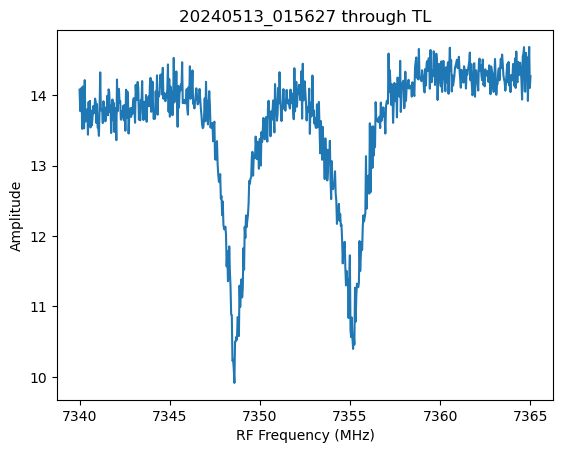

Creating dataset with series 20240513_015844
converting time variables from us to clock ticks
Saving data as: 20240513_015844_freq_scan_CB.h5


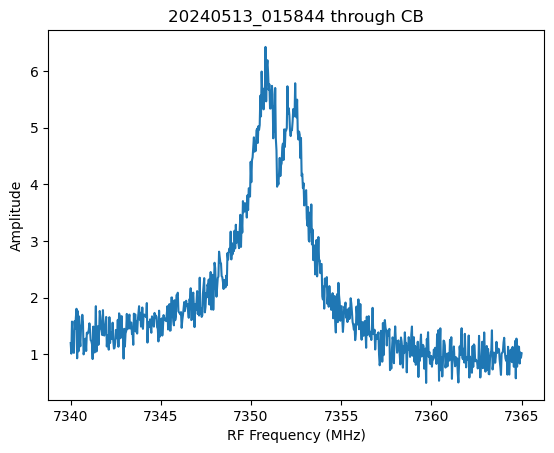

Creating dataset with series 20240513_020035
converting time variables from us to clock ticks
Saving data as: 20240513_020035_freq_scan_TL.h5


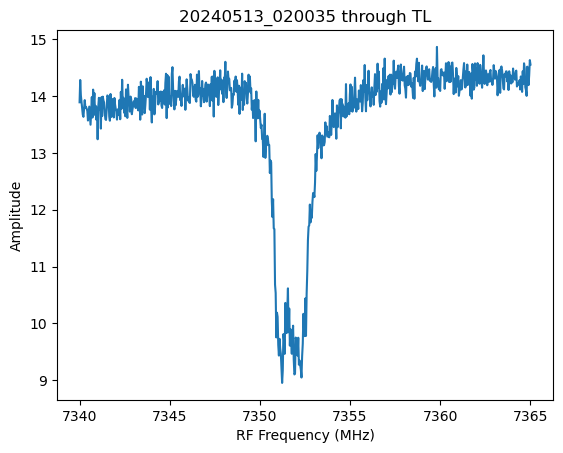

Creating dataset with series 20240513_020253
converting time variables from us to clock ticks
Saving data as: 20240513_020253_freq_scan_CB.h5


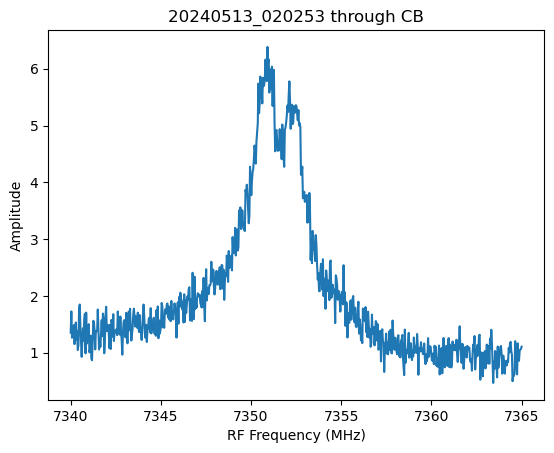

Creating dataset with series 20240513_020444
converting time variables from us to clock ticks
Saving data as: 20240513_020444_freq_scan_TL.h5


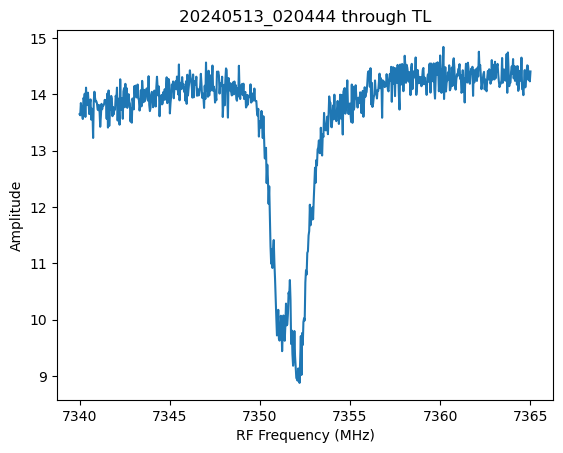

Creating dataset with series 20240513_020702
converting time variables from us to clock ticks
Saving data as: 20240513_020702_freq_scan_CB.h5


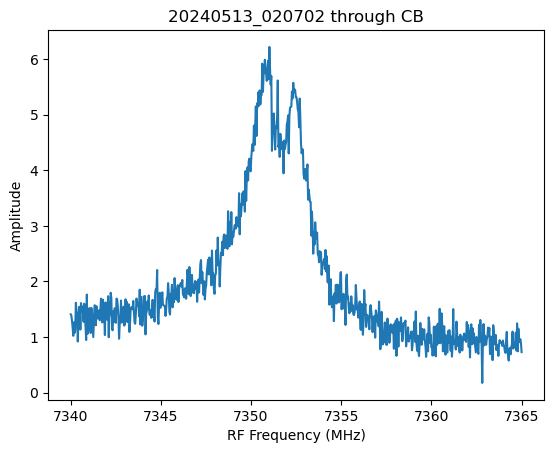

Creating dataset with series 20240513_020853
converting time variables from us to clock ticks
Saving data as: 20240513_020853_freq_scan_TL.h5


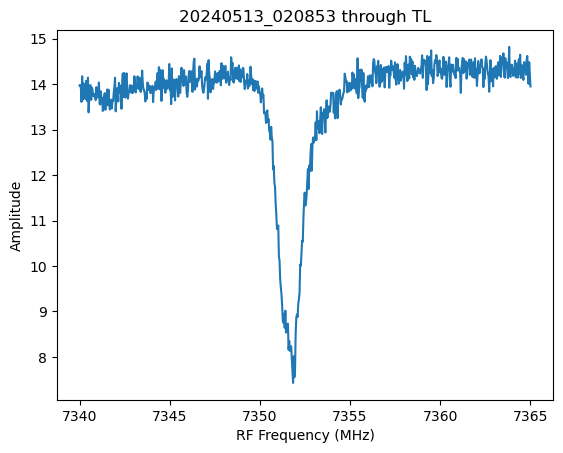

Creating dataset with series 20240513_021110
converting time variables from us to clock ticks
Saving data as: 20240513_021110_freq_scan_CB.h5


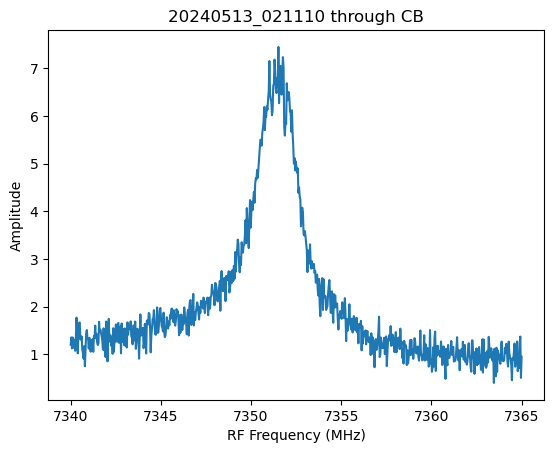

Creating dataset with series 20240513_021301
converting time variables from us to clock ticks
Saving data as: 20240513_021301_freq_scan_TL.h5


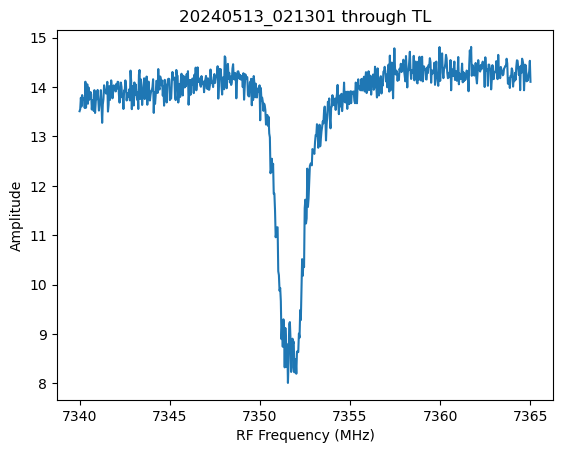

Creating dataset with series 20240513_021519
converting time variables from us to clock ticks
Saving data as: 20240513_021519_freq_scan_CB.h5


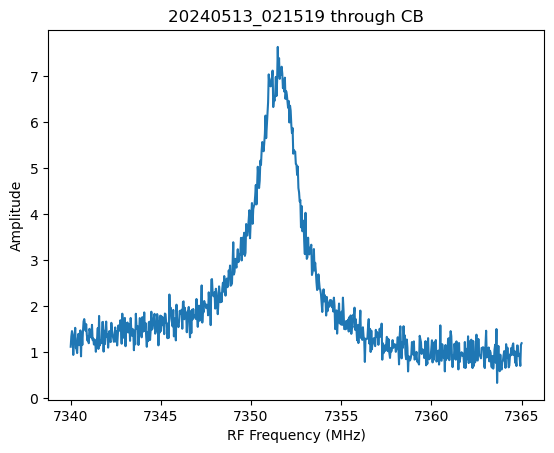

Creating dataset with series 20240513_021710
converting time variables from us to clock ticks
Saving data as: 20240513_021710_freq_scan_TL.h5


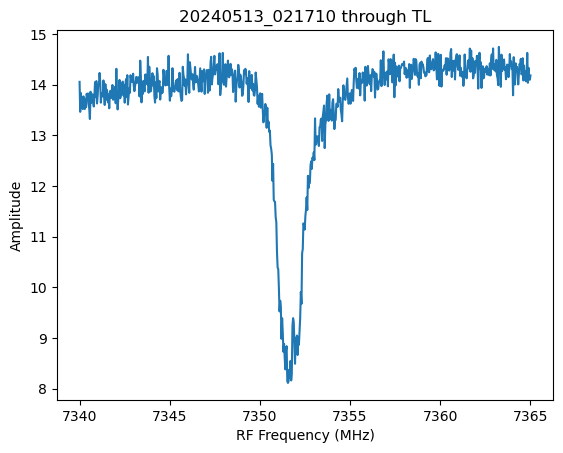

Creating dataset with series 20240513_021928
converting time variables from us to clock ticks
Saving data as: 20240513_021928_freq_scan_CB.h5


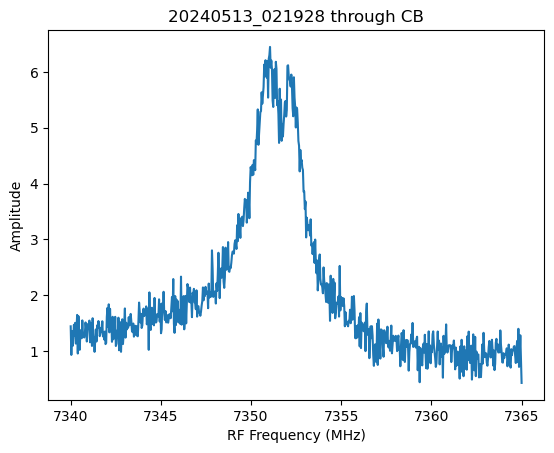

Creating dataset with series 20240513_022119
converting time variables from us to clock ticks
Saving data as: 20240513_022119_freq_scan_TL.h5


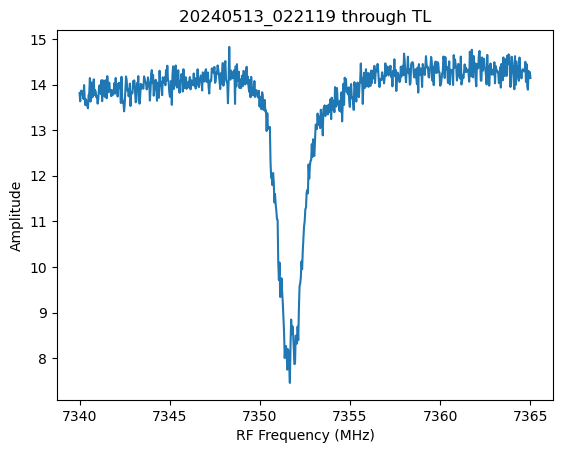

Creating dataset with series 20240513_022336
converting time variables from us to clock ticks
Saving data as: 20240513_022336_freq_scan_CB.h5


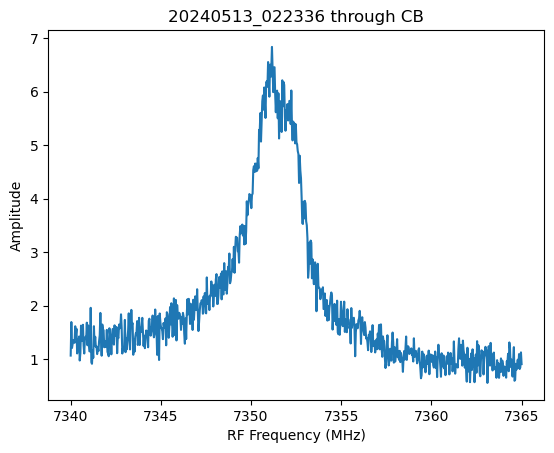

Creating dataset with series 20240513_022527
converting time variables from us to clock ticks
Saving data as: 20240513_022527_freq_scan_TL.h5


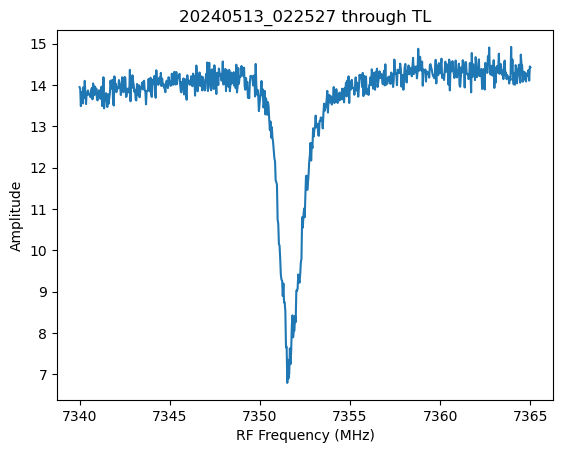

Creating dataset with series 20240513_022745
converting time variables from us to clock ticks
Saving data as: 20240513_022745_freq_scan_CB.h5


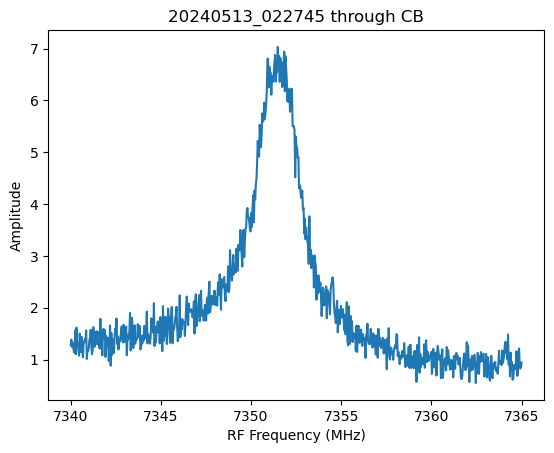

Creating dataset with series 20240513_022936
converting time variables from us to clock ticks
Saving data as: 20240513_022936_freq_scan_TL.h5


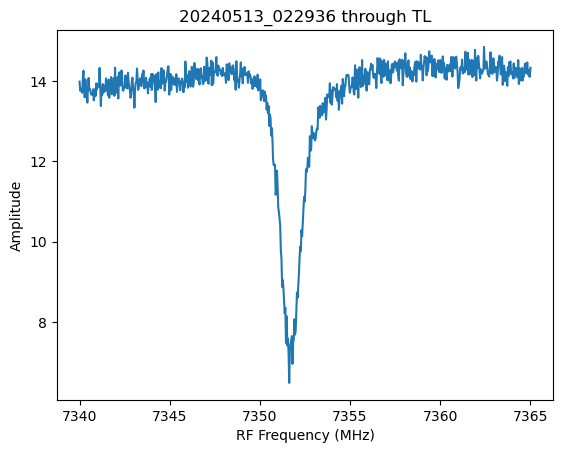

Creating dataset with series 20240513_023153
converting time variables from us to clock ticks
Saving data as: 20240513_023153_freq_scan_CB.h5


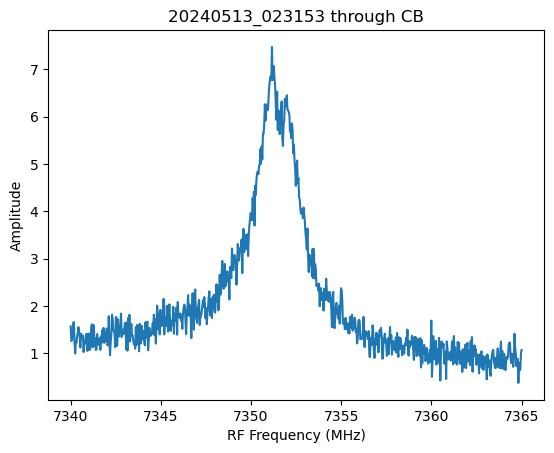

Creating dataset with series 20240513_023344
converting time variables from us to clock ticks
Saving data as: 20240513_023344_freq_scan_TL.h5


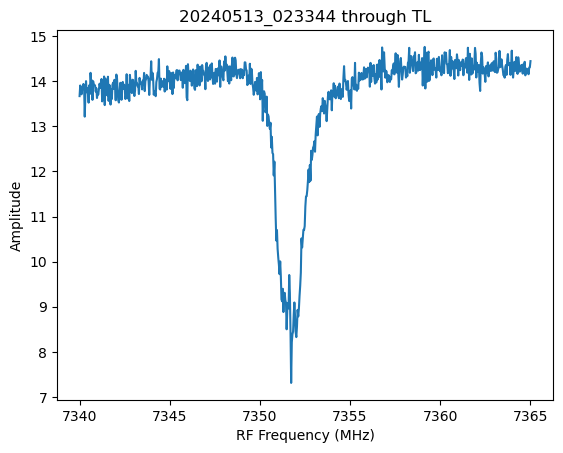

Creating dataset with series 20240513_023602
converting time variables from us to clock ticks
Saving data as: 20240513_023602_freq_scan_CB.h5


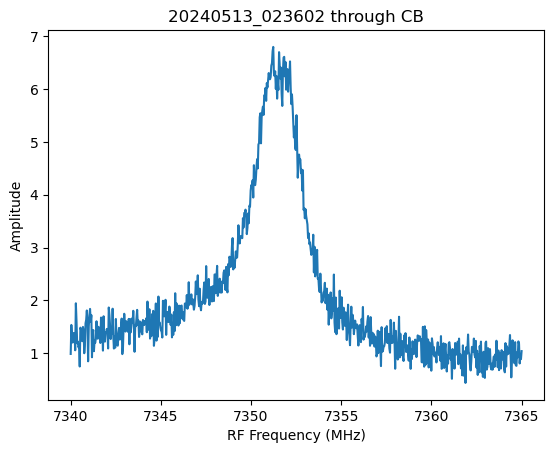

Creating dataset with series 20240513_023753
converting time variables from us to clock ticks
Saving data as: 20240513_023753_freq_scan_TL.h5


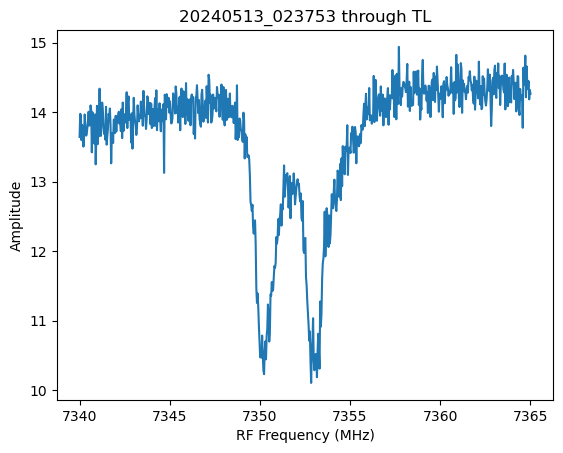

Creating dataset with series 20240513_024011
converting time variables from us to clock ticks
Saving data as: 20240513_024011_freq_scan_CB.h5


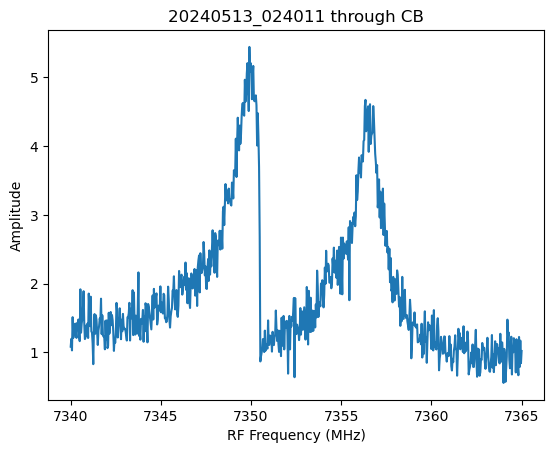

Creating dataset with series 20240513_024202
converting time variables from us to clock ticks
Saving data as: 20240513_024202_freq_scan_TL.h5


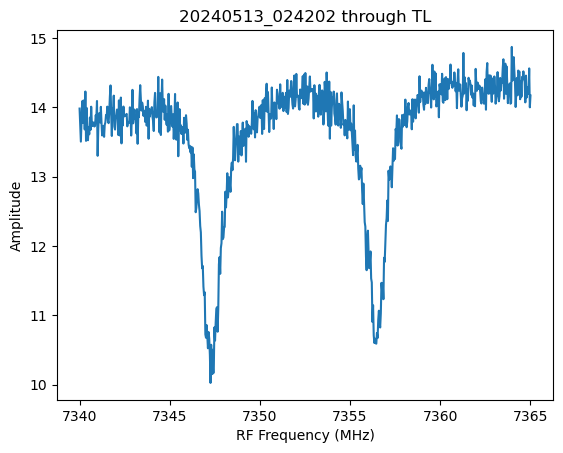

Creating dataset with series 20240513_024419
converting time variables from us to clock ticks
Saving data as: 20240513_024419_freq_scan_CB.h5


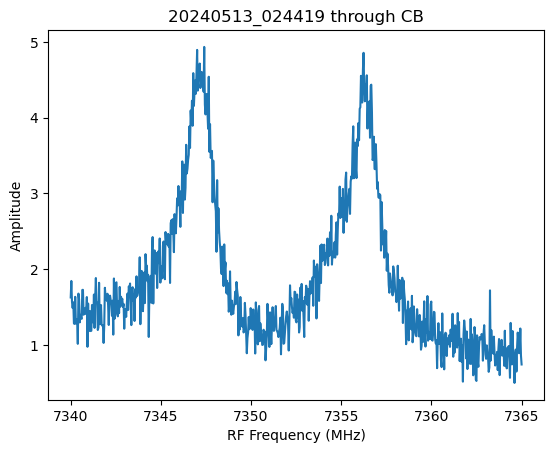

Creating dataset with series 20240513_024610
converting time variables from us to clock ticks
Saving data as: 20240513_024610_freq_scan_TL.h5


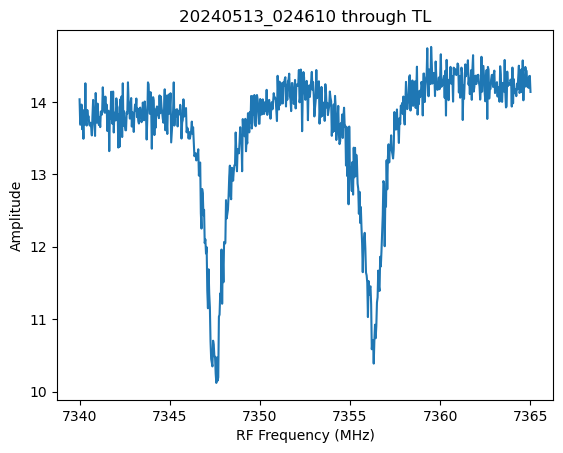

Creating dataset with series 20240513_024828
converting time variables from us to clock ticks
Saving data as: 20240513_024828_freq_scan_CB.h5


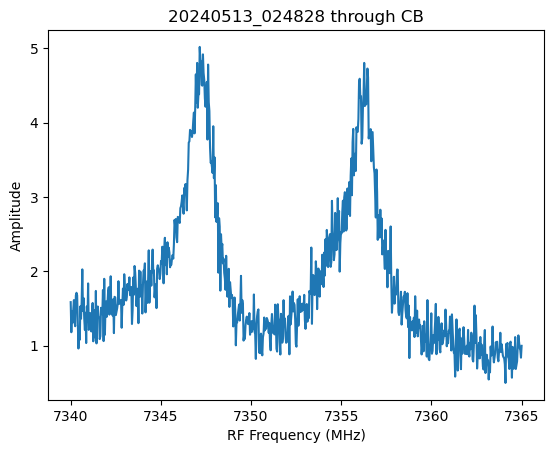

Creating dataset with series 20240513_025019
converting time variables from us to clock ticks
Saving data as: 20240513_025019_freq_scan_TL.h5


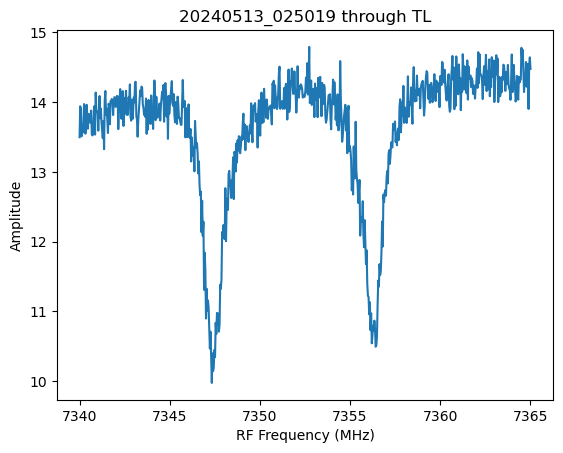

Creating dataset with series 20240513_025237
converting time variables from us to clock ticks
Saving data as: 20240513_025237_freq_scan_CB.h5


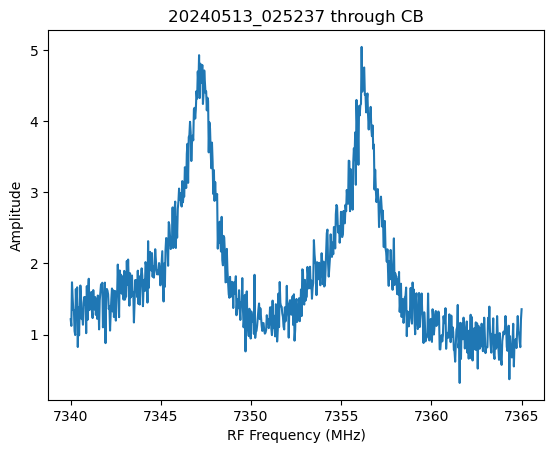

Creating dataset with series 20240513_025428
converting time variables from us to clock ticks
Saving data as: 20240513_025428_freq_scan_TL.h5


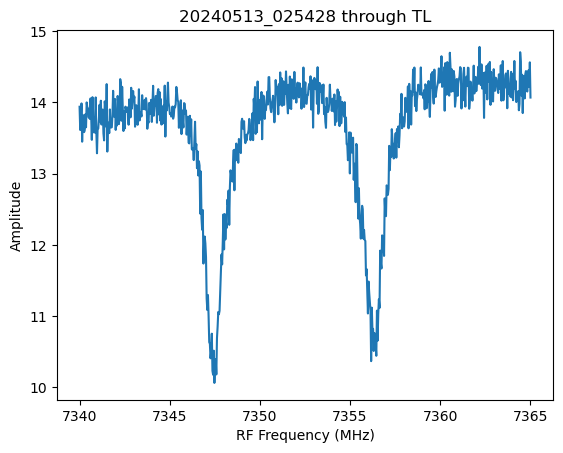

Creating dataset with series 20240513_025646
converting time variables from us to clock ticks
Saving data as: 20240513_025646_freq_scan_CB.h5


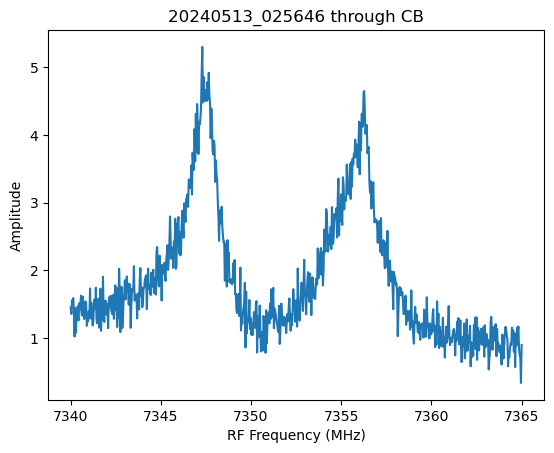

Creating dataset with series 20240513_025837
converting time variables from us to clock ticks
Saving data as: 20240513_025837_freq_scan_TL.h5


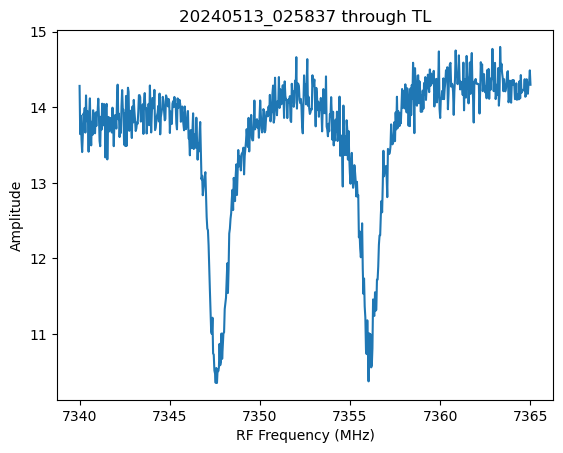

Creating dataset with series 20240513_030054
converting time variables from us to clock ticks
Saving data as: 20240513_030054_freq_scan_CB.h5


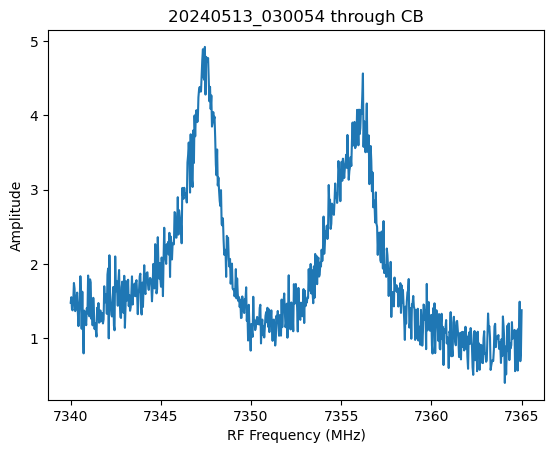

Creating dataset with series 20240513_030245
converting time variables from us to clock ticks
Saving data as: 20240513_030245_freq_scan_TL.h5


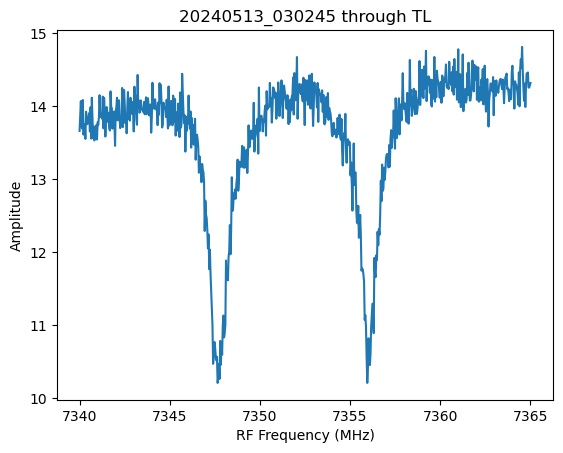

Creating dataset with series 20240513_030503
converting time variables from us to clock ticks
Saving data as: 20240513_030503_freq_scan_CB.h5


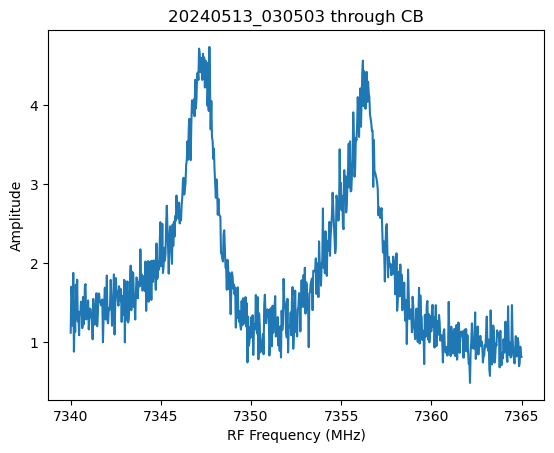

Creating dataset with series 20240513_030654
converting time variables from us to clock ticks
Saving data as: 20240513_030654_freq_scan_TL.h5


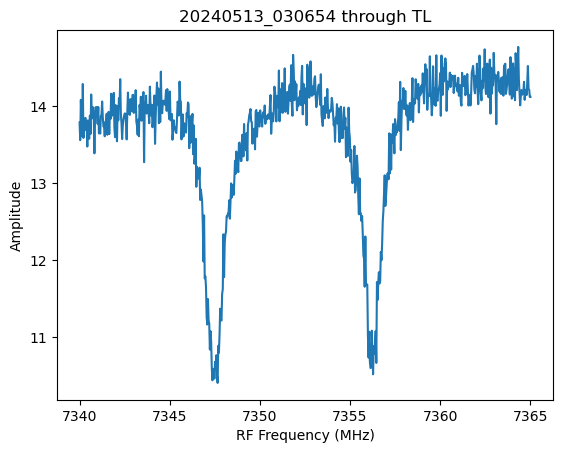

Creating dataset with series 20240513_030912
converting time variables from us to clock ticks
Saving data as: 20240513_030912_freq_scan_CB.h5


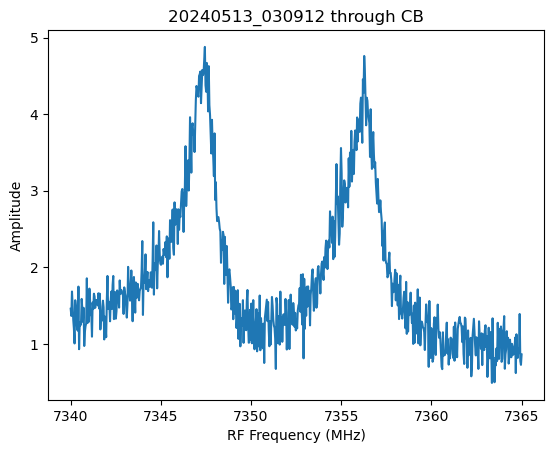

Creating dataset with series 20240513_031103
converting time variables from us to clock ticks
Saving data as: 20240513_031103_freq_scan_TL.h5


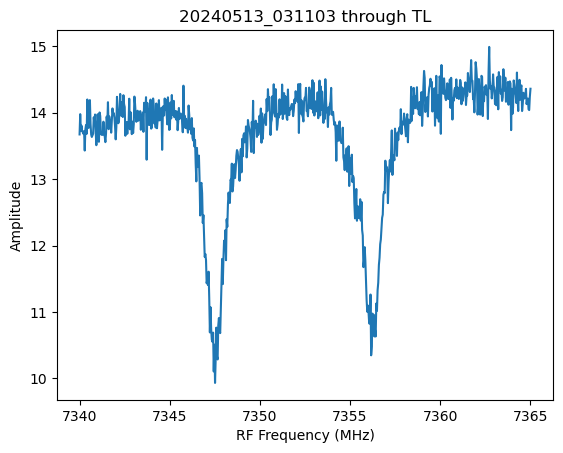

Creating dataset with series 20240513_031321
converting time variables from us to clock ticks
Saving data as: 20240513_031321_freq_scan_CB.h5


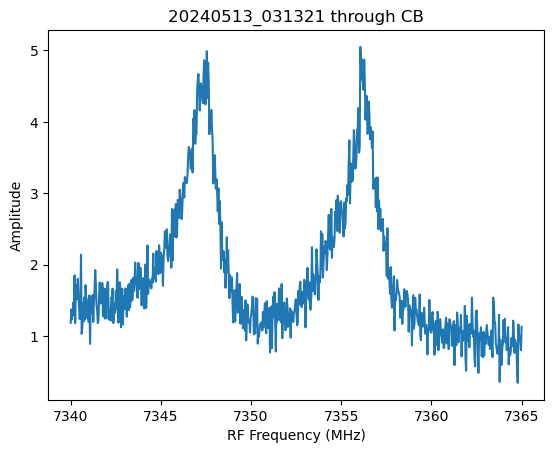

Creating dataset with series 20240513_031512
converting time variables from us to clock ticks
Saving data as: 20240513_031512_freq_scan_TL.h5


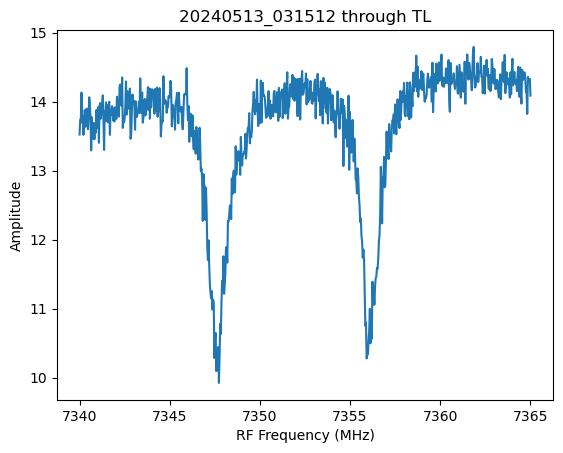

Creating dataset with series 20240513_031729
converting time variables from us to clock ticks
Saving data as: 20240513_031729_freq_scan_CB.h5


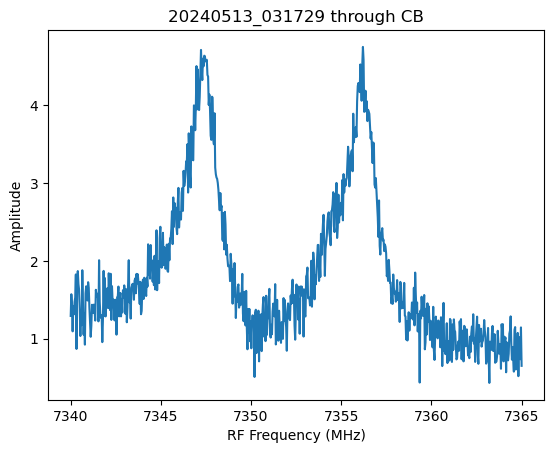

Creating dataset with series 20240513_031920
converting time variables from us to clock ticks
Saving data as: 20240513_031920_freq_scan_TL.h5


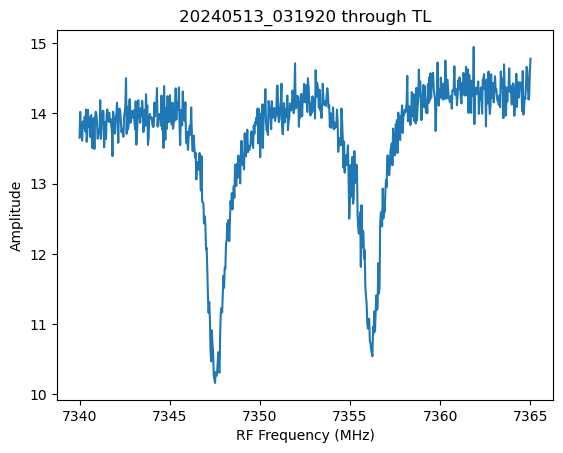

Creating dataset with series 20240513_032138
converting time variables from us to clock ticks
Saving data as: 20240513_032138_freq_scan_CB.h5


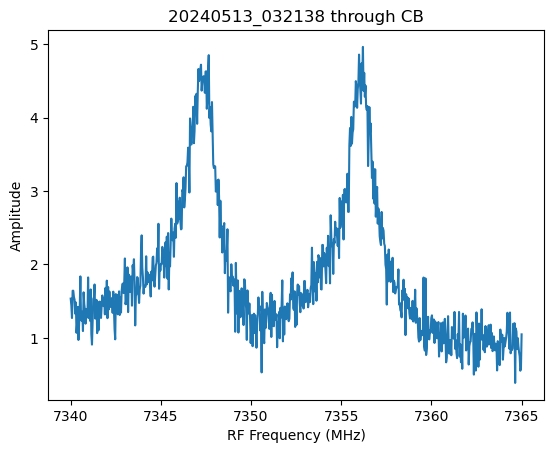

Creating dataset with series 20240513_032329
converting time variables from us to clock ticks
Saving data as: 20240513_032329_freq_scan_TL.h5


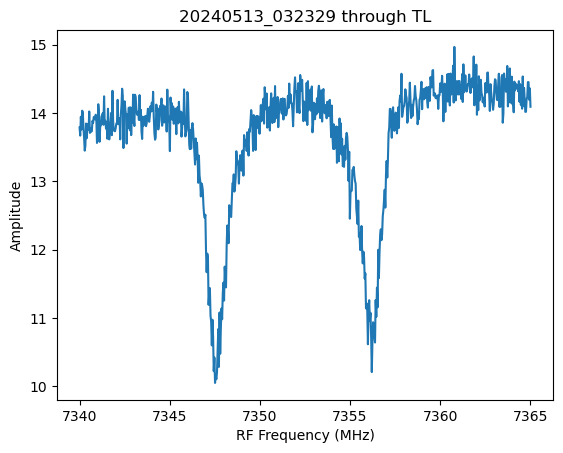

Creating dataset with series 20240513_032547
converting time variables from us to clock ticks
Saving data as: 20240513_032547_freq_scan_CB.h5


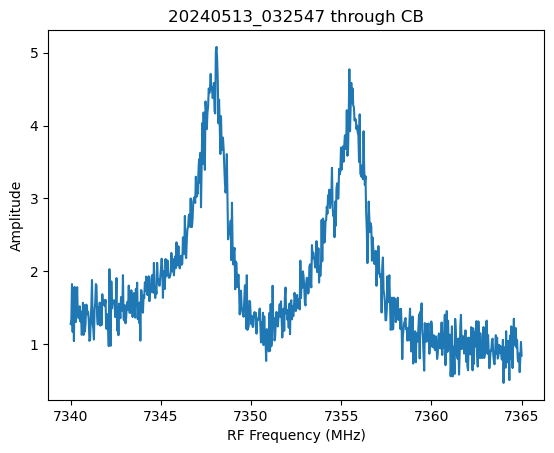

Creating dataset with series 20240513_032738
converting time variables from us to clock ticks
Saving data as: 20240513_032738_freq_scan_TL.h5


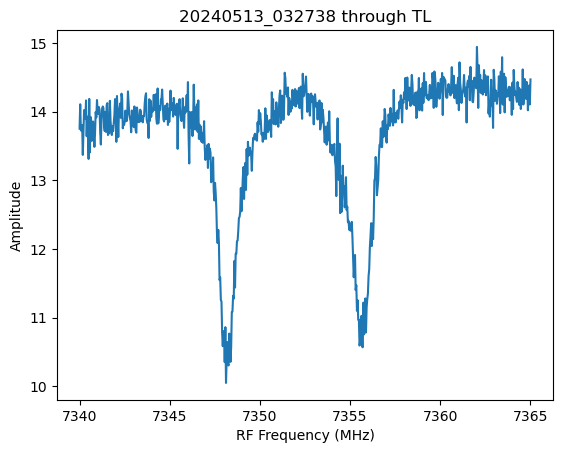

Creating dataset with series 20240513_032956
converting time variables from us to clock ticks
Saving data as: 20240513_032956_freq_scan_CB.h5


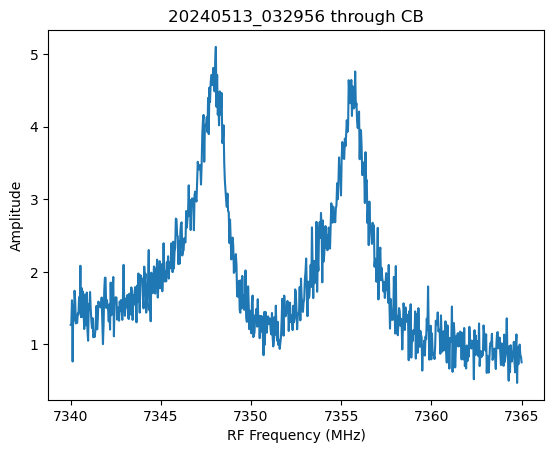

Creating dataset with series 20240513_033146
converting time variables from us to clock ticks
Saving data as: 20240513_033146_freq_scan_TL.h5


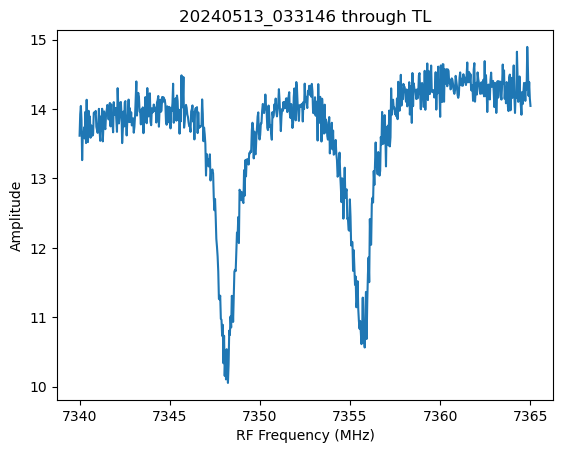

Creating dataset with series 20240513_033404
converting time variables from us to clock ticks
Saving data as: 20240513_033404_freq_scan_CB.h5


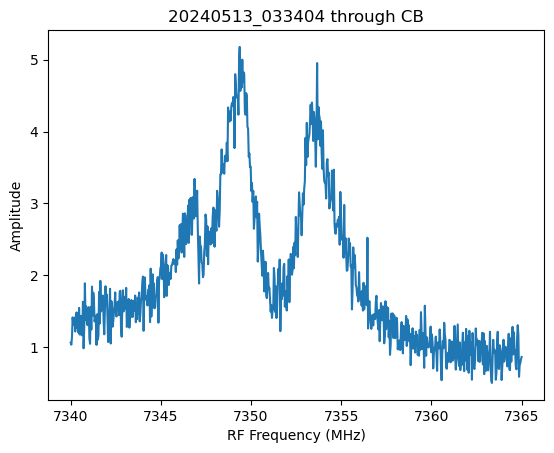

Creating dataset with series 20240513_033555
converting time variables from us to clock ticks
Saving data as: 20240513_033555_freq_scan_TL.h5


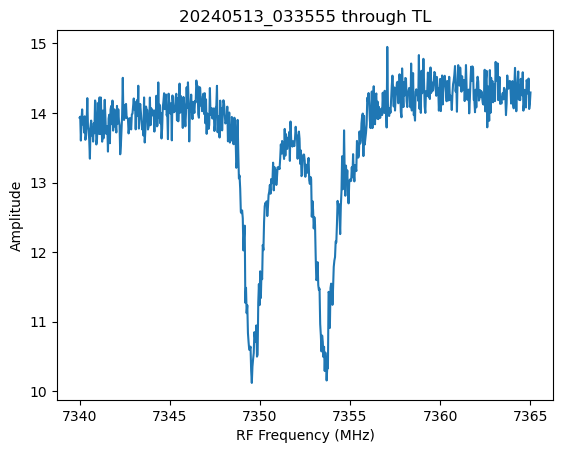

Creating dataset with series 20240513_033813
converting time variables from us to clock ticks
Saving data as: 20240513_033813_freq_scan_CB.h5


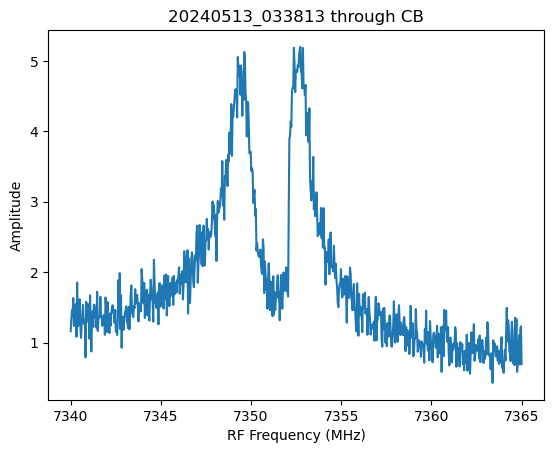

Creating dataset with series 20240513_034004
converting time variables from us to clock ticks
Saving data as: 20240513_034004_freq_scan_TL.h5


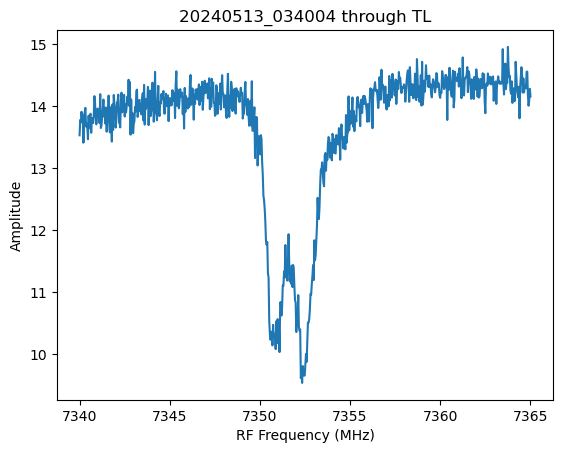

Creating dataset with series 20240513_034221
converting time variables from us to clock ticks
Saving data as: 20240513_034221_freq_scan_CB.h5


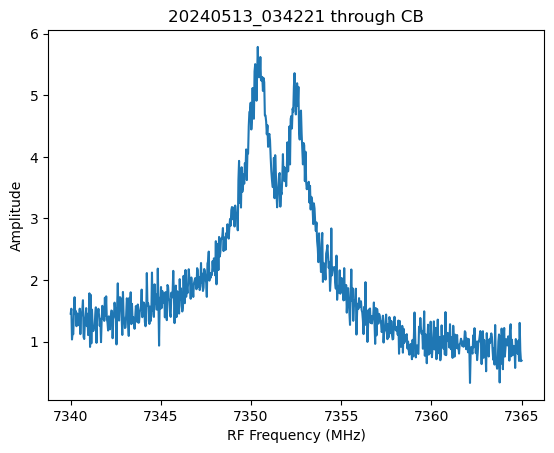

Creating dataset with series 20240513_034412
converting time variables from us to clock ticks
Saving data as: 20240513_034412_freq_scan_TL.h5


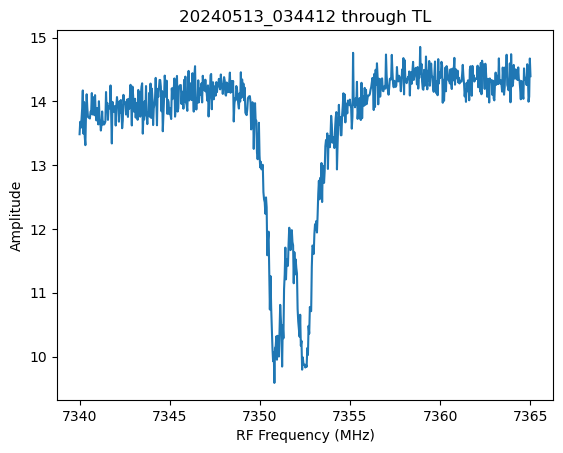

Creating dataset with series 20240513_034630
converting time variables from us to clock ticks
Saving data as: 20240513_034630_freq_scan_CB.h5


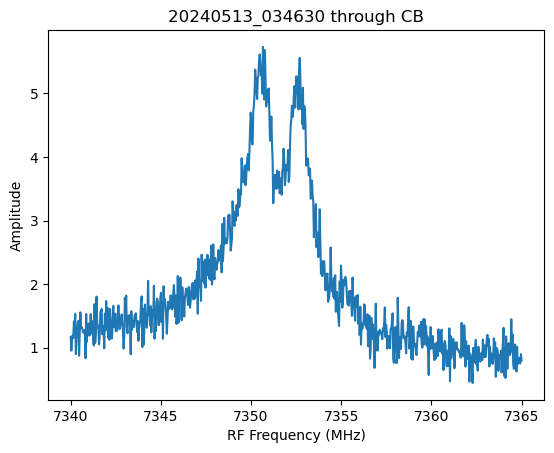

Creating dataset with series 20240513_034821
converting time variables from us to clock ticks
Saving data as: 20240513_034821_freq_scan_TL.h5


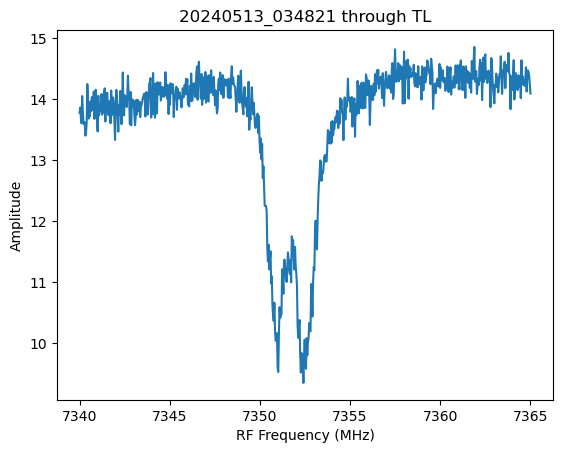

Creating dataset with series 20240513_035039
converting time variables from us to clock ticks
Saving data as: 20240513_035039_freq_scan_CB.h5


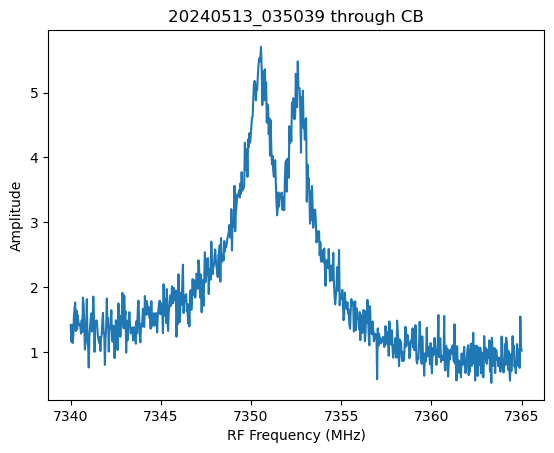

Creating dataset with series 20240513_035230
converting time variables from us to clock ticks
Saving data as: 20240513_035230_freq_scan_TL.h5


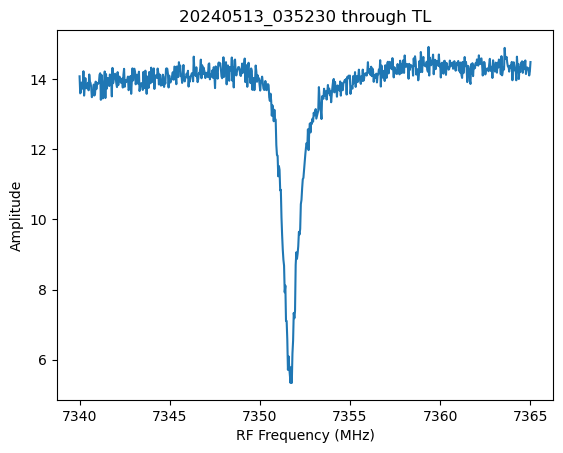

Creating dataset with series 20240513_035447
converting time variables from us to clock ticks
Saving data as: 20240513_035447_freq_scan_CB.h5


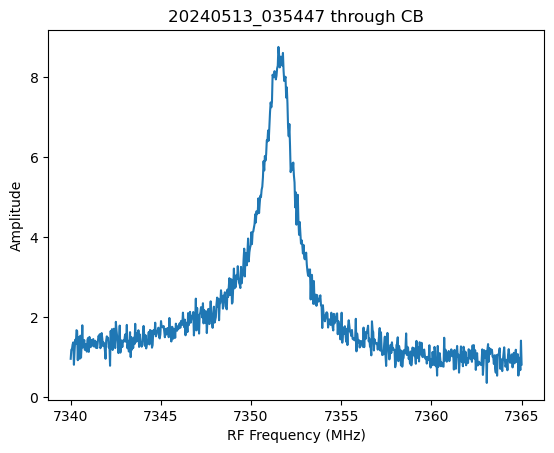

Creating dataset with series 20240513_035638
converting time variables from us to clock ticks
Saving data as: 20240513_035638_freq_scan_TL.h5


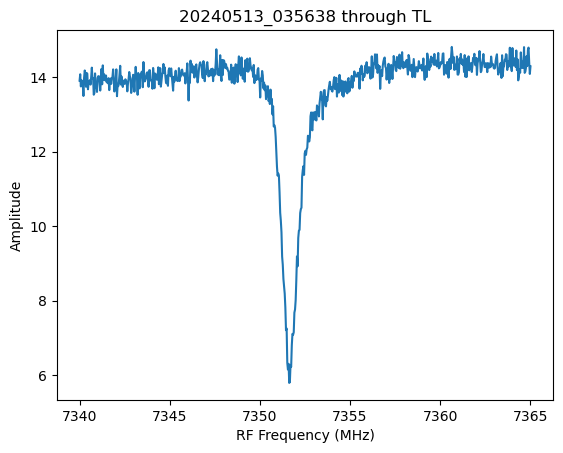

Creating dataset with series 20240513_035856
converting time variables from us to clock ticks
Saving data as: 20240513_035856_freq_scan_CB.h5


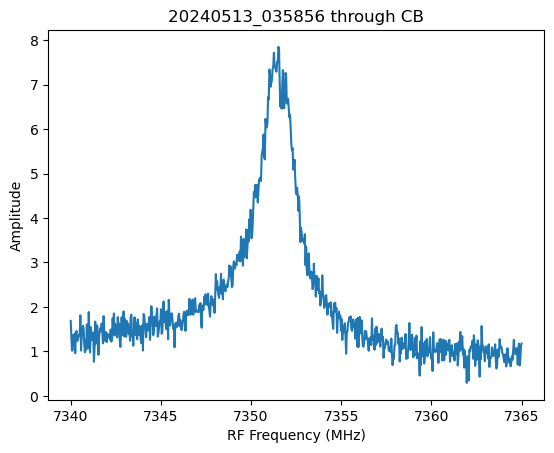

Creating dataset with series 20240513_040047
converting time variables from us to clock ticks
Saving data as: 20240513_040047_freq_scan_TL.h5


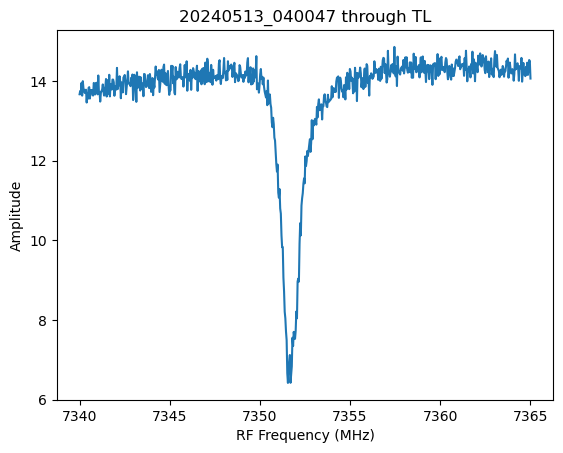

Creating dataset with series 20240513_040305
converting time variables from us to clock ticks
Saving data as: 20240513_040305_freq_scan_CB.h5


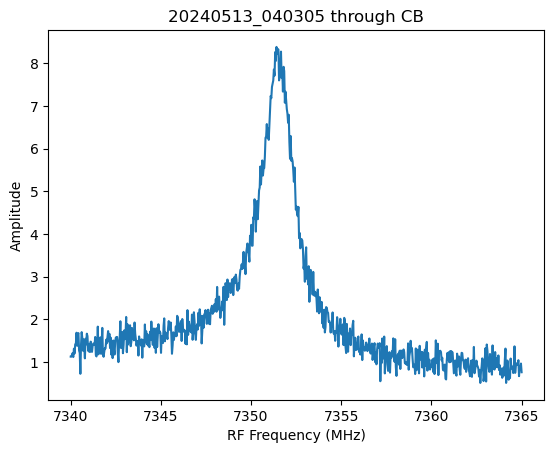

Creating dataset with series 20240513_040456
converting time variables from us to clock ticks
Saving data as: 20240513_040456_freq_scan_TL.h5


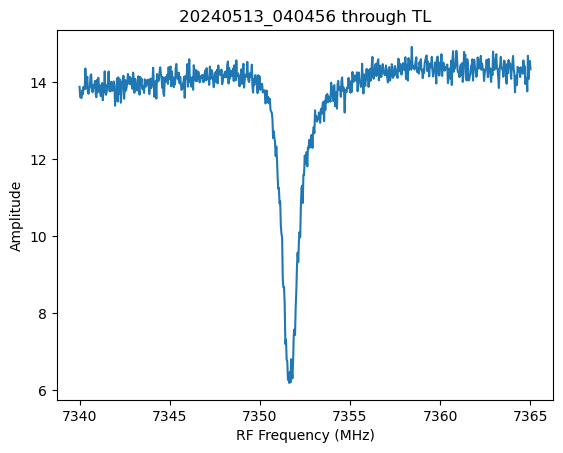

Creating dataset with series 20240513_040714
converting time variables from us to clock ticks
Saving data as: 20240513_040714_freq_scan_CB.h5


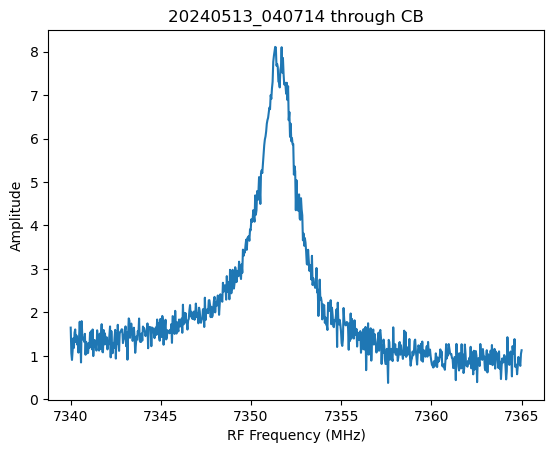

Creating dataset with series 20240513_040905
converting time variables from us to clock ticks
Saving data as: 20240513_040905_freq_scan_TL.h5


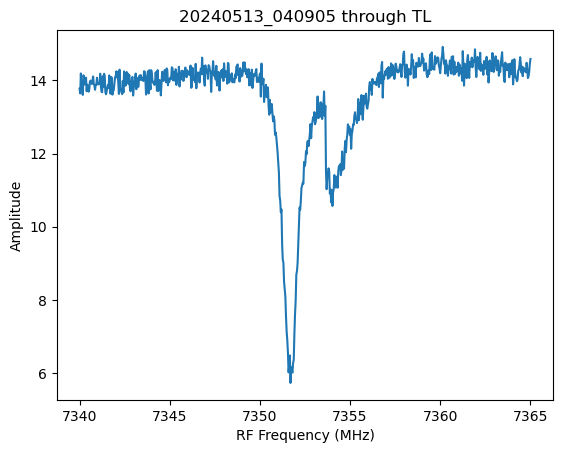

Creating dataset with series 20240513_041122
converting time variables from us to clock ticks
Saving data as: 20240513_041122_freq_scan_CB.h5


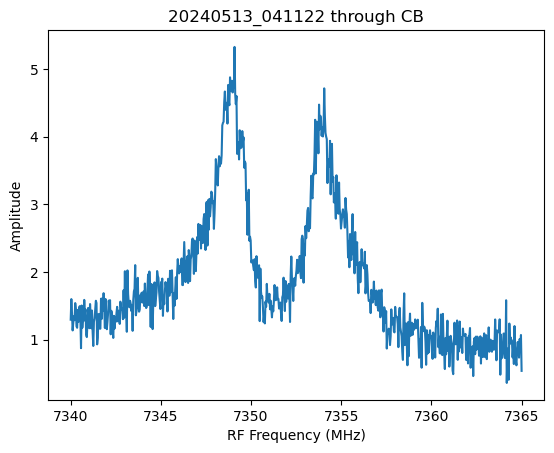

Creating dataset with series 20240513_041313
converting time variables from us to clock ticks
Saving data as: 20240513_041313_freq_scan_TL.h5


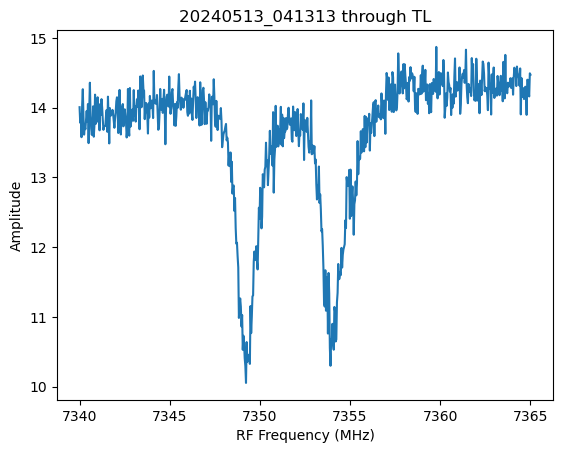

Creating dataset with series 20240513_041531
converting time variables from us to clock ticks
Saving data as: 20240513_041531_freq_scan_CB.h5


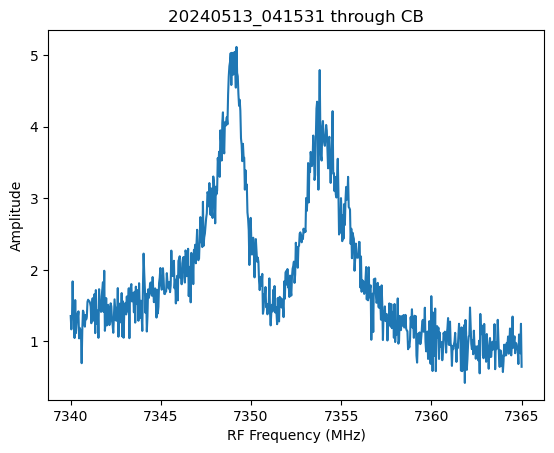

Creating dataset with series 20240513_041722
converting time variables from us to clock ticks
Saving data as: 20240513_041722_freq_scan_TL.h5


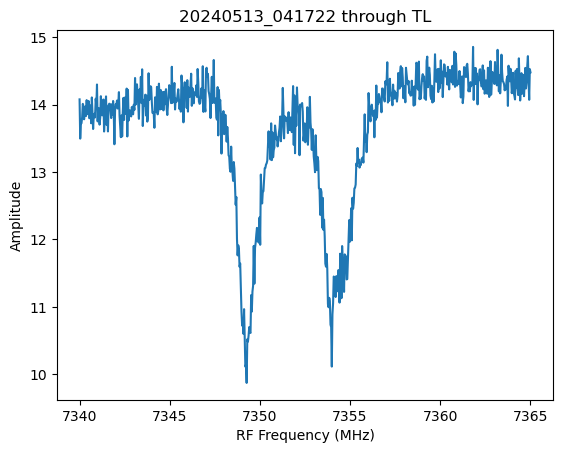

Creating dataset with series 20240513_041940
converting time variables from us to clock ticks
Saving data as: 20240513_041940_freq_scan_CB.h5


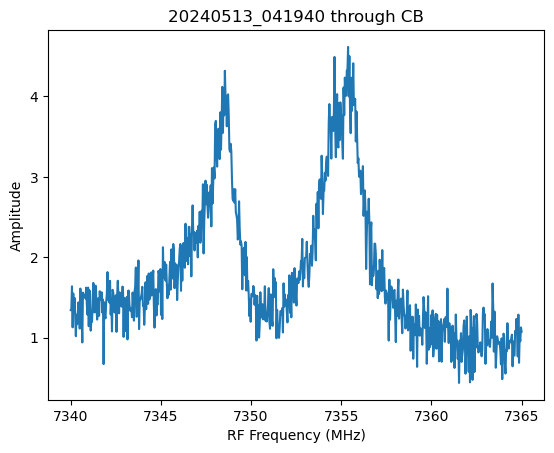

Creating dataset with series 20240513_042131
converting time variables from us to clock ticks
Saving data as: 20240513_042131_freq_scan_TL.h5


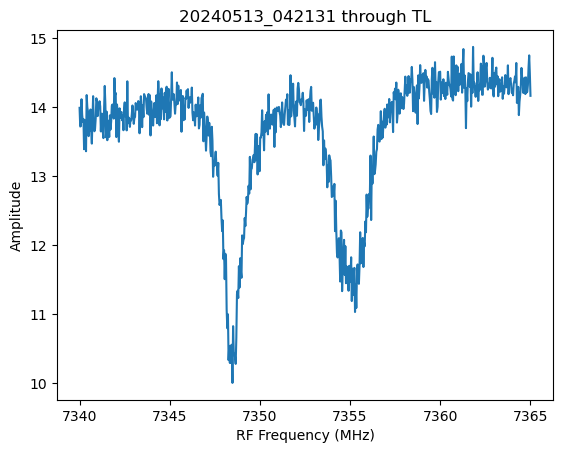

Creating dataset with series 20240513_042348
converting time variables from us to clock ticks
Saving data as: 20240513_042348_freq_scan_CB.h5


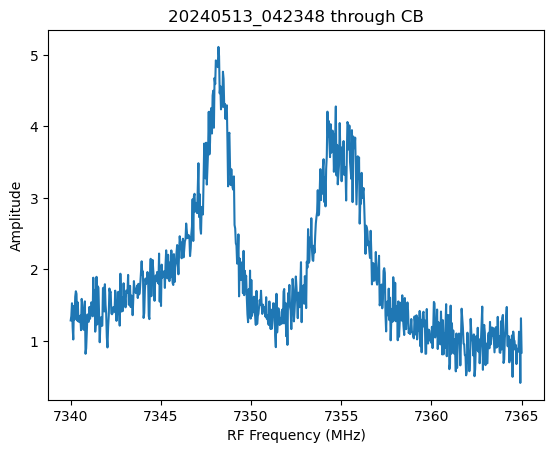

Creating dataset with series 20240513_042539
converting time variables from us to clock ticks
Saving data as: 20240513_042539_freq_scan_TL.h5


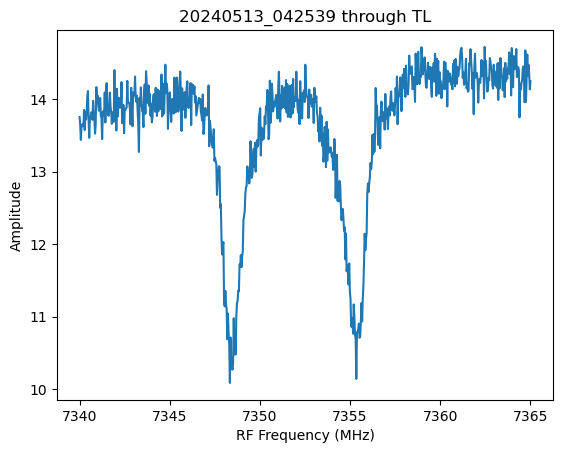

Creating dataset with series 20240513_042757
converting time variables from us to clock ticks
Saving data as: 20240513_042757_freq_scan_CB.h5


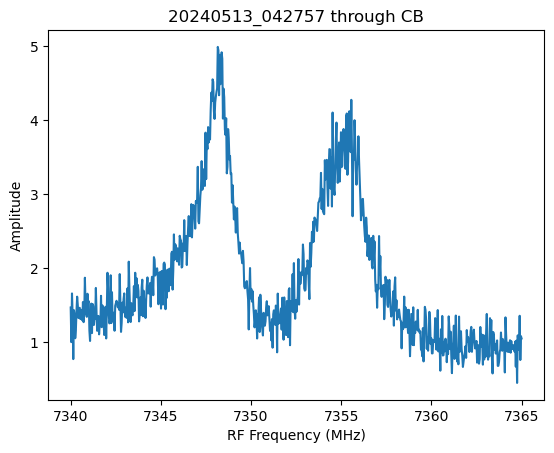

Creating dataset with series 20240513_042948
converting time variables from us to clock ticks
Saving data as: 20240513_042948_freq_scan_TL.h5


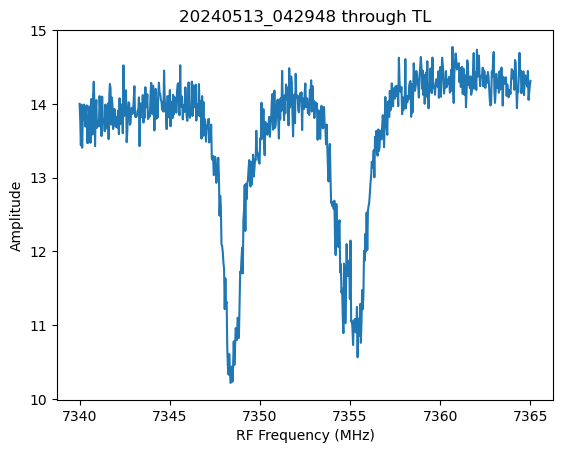

Creating dataset with series 20240513_043206
converting time variables from us to clock ticks
Saving data as: 20240513_043206_freq_scan_CB.h5


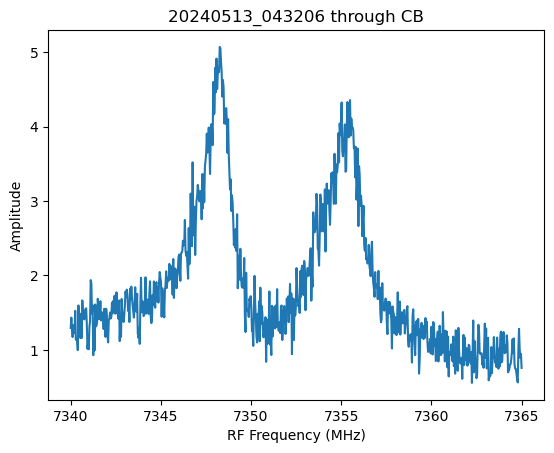

Creating dataset with series 20240513_043357
converting time variables from us to clock ticks
Saving data as: 20240513_043357_freq_scan_TL.h5


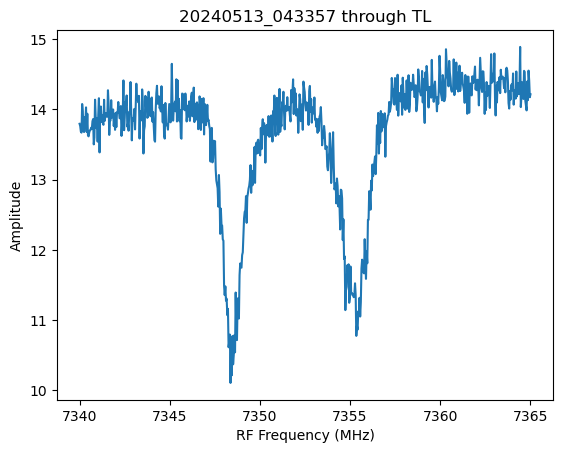

Creating dataset with series 20240513_043615
converting time variables from us to clock ticks
Saving data as: 20240513_043615_freq_scan_CB.h5


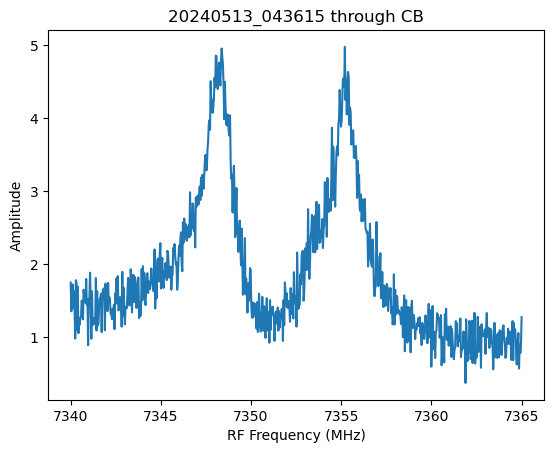

Creating dataset with series 20240513_043806
converting time variables from us to clock ticks
Saving data as: 20240513_043806_freq_scan_TL.h5


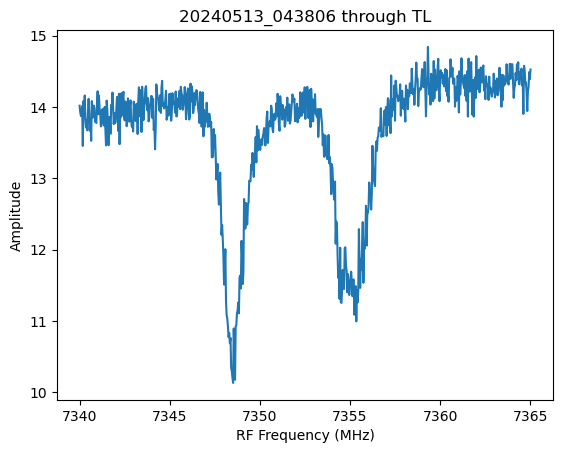

Creating dataset with series 20240513_044023
converting time variables from us to clock ticks
Saving data as: 20240513_044023_freq_scan_CB.h5


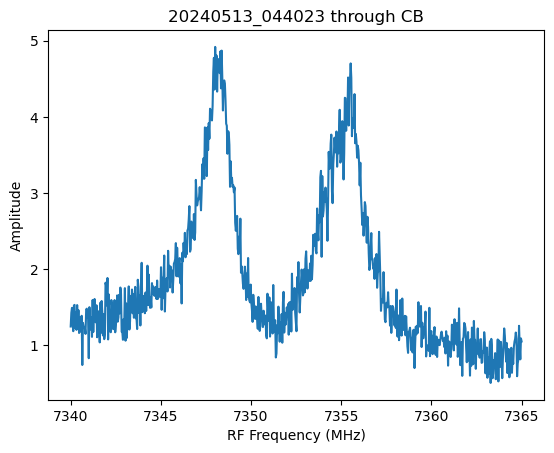

Creating dataset with series 20240513_044214
converting time variables from us to clock ticks
Saving data as: 20240513_044214_freq_scan_TL.h5


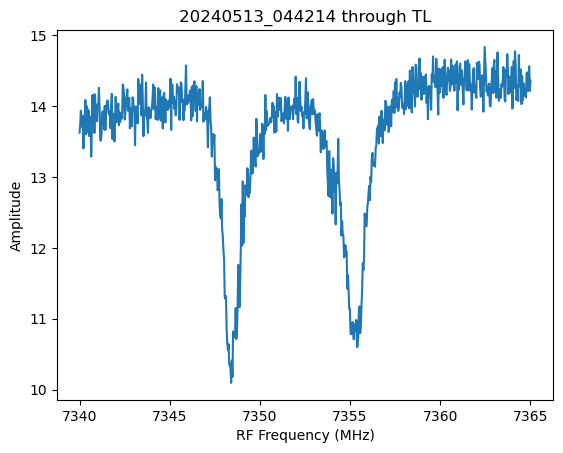

Creating dataset with series 20240513_044432
converting time variables from us to clock ticks
Saving data as: 20240513_044432_freq_scan_CB.h5


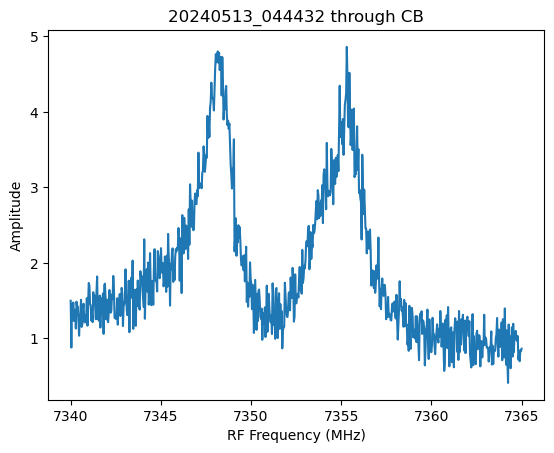

Creating dataset with series 20240513_044623
converting time variables from us to clock ticks
Saving data as: 20240513_044623_freq_scan_TL.h5


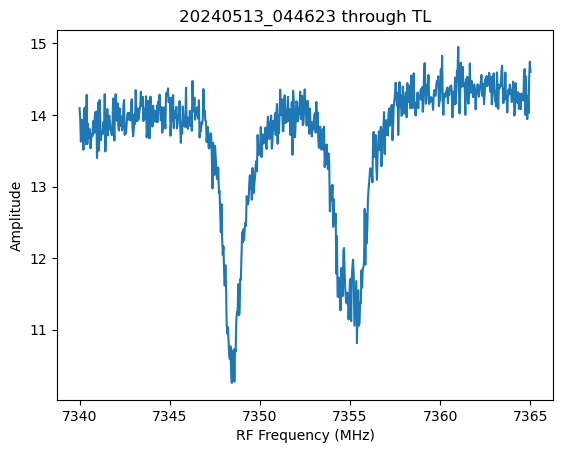

Creating dataset with series 20240513_044841
converting time variables from us to clock ticks
Saving data as: 20240513_044841_freq_scan_CB.h5


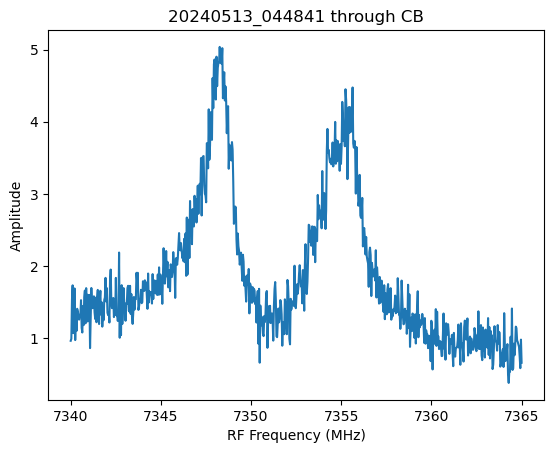

Creating dataset with series 20240513_045032
converting time variables from us to clock ticks
Saving data as: 20240513_045032_freq_scan_TL.h5


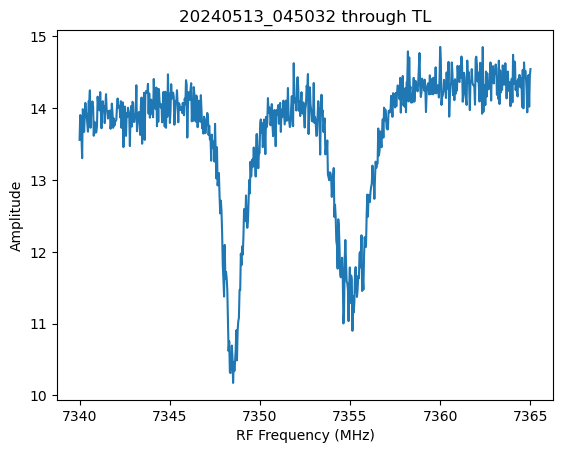

Creating dataset with series 20240513_045250
converting time variables from us to clock ticks
Saving data as: 20240513_045250_freq_scan_CB.h5


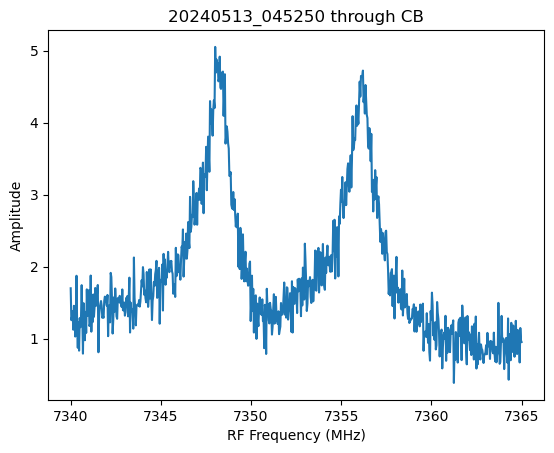

Creating dataset with series 20240513_045441
converting time variables from us to clock ticks
Saving data as: 20240513_045441_freq_scan_TL.h5


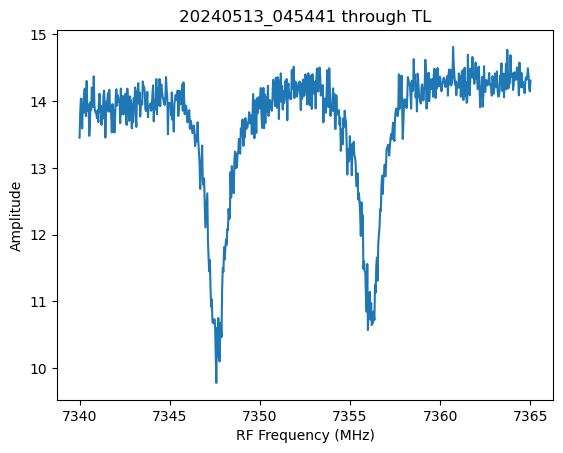

Creating dataset with series 20240513_045658
converting time variables from us to clock ticks
Saving data as: 20240513_045658_freq_scan_CB.h5


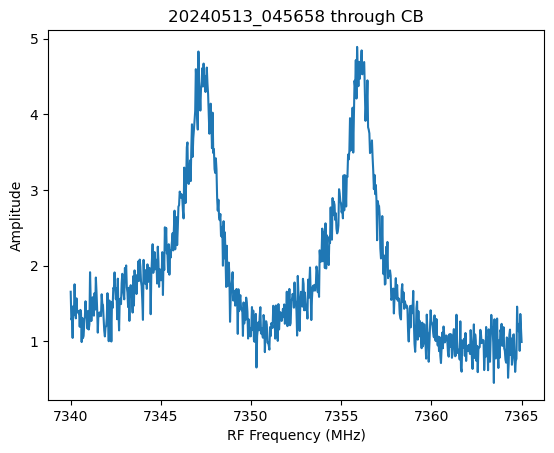

Creating dataset with series 20240513_045849
converting time variables from us to clock ticks
Saving data as: 20240513_045849_freq_scan_TL.h5


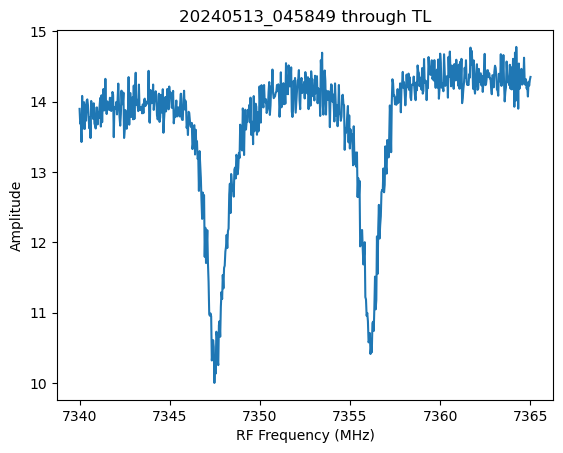

Creating dataset with series 20240513_050107
converting time variables from us to clock ticks
Saving data as: 20240513_050107_freq_scan_CB.h5


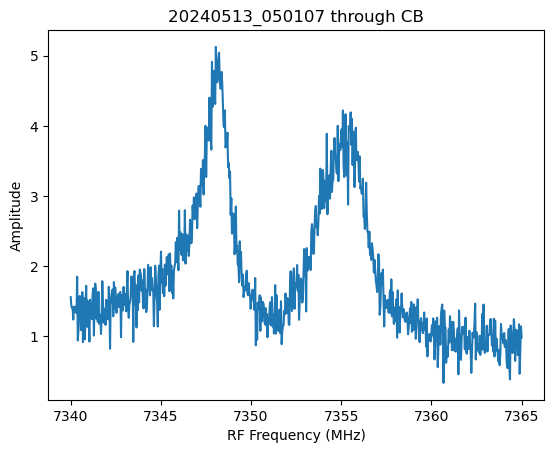

Creating dataset with series 20240513_050258
converting time variables from us to clock ticks
Saving data as: 20240513_050258_freq_scan_TL.h5


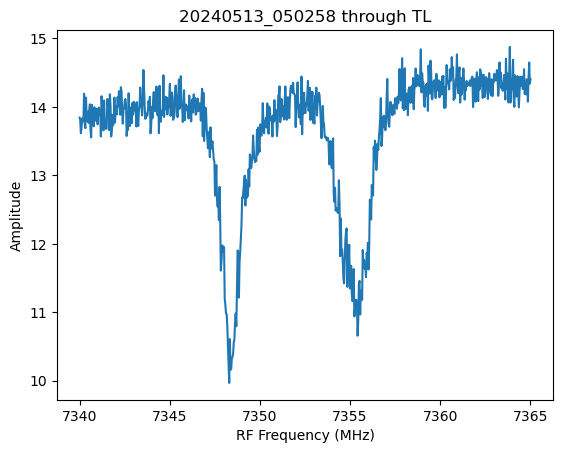

Creating dataset with series 20240513_050516
converting time variables from us to clock ticks
Saving data as: 20240513_050516_freq_scan_CB.h5


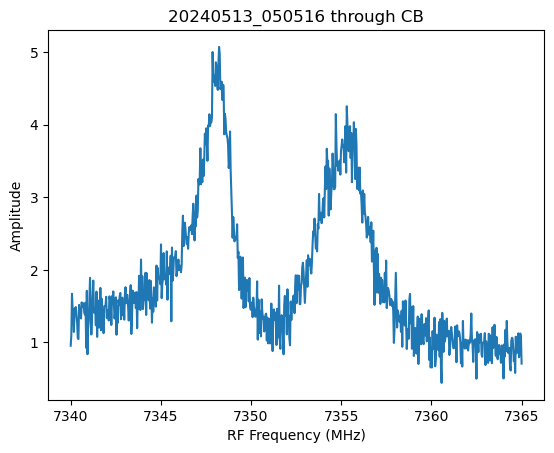

Creating dataset with series 20240513_050707
converting time variables from us to clock ticks
Saving data as: 20240513_050707_freq_scan_TL.h5


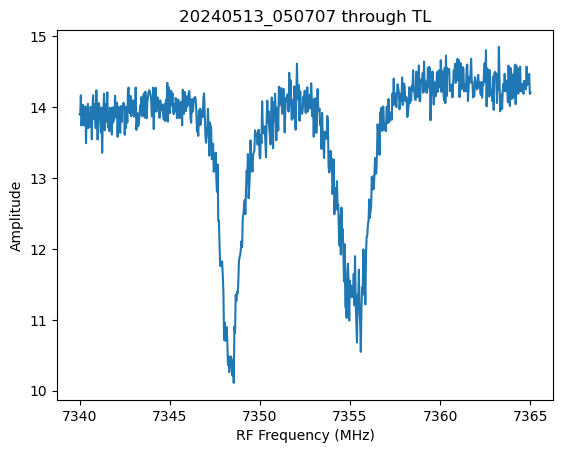

Creating dataset with series 20240513_050925
converting time variables from us to clock ticks
Saving data as: 20240513_050925_freq_scan_CB.h5


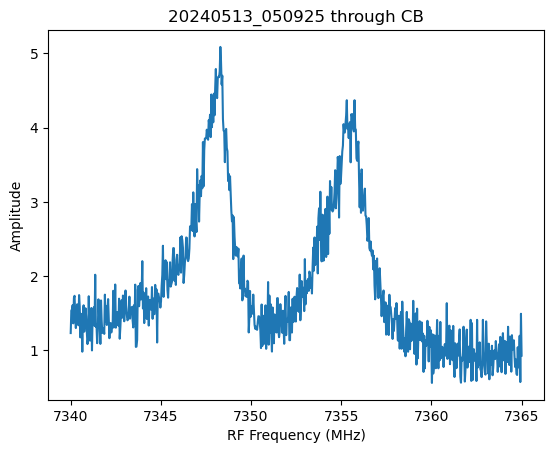

Creating dataset with series 20240513_051116
converting time variables from us to clock ticks
Saving data as: 20240513_051116_freq_scan_TL.h5


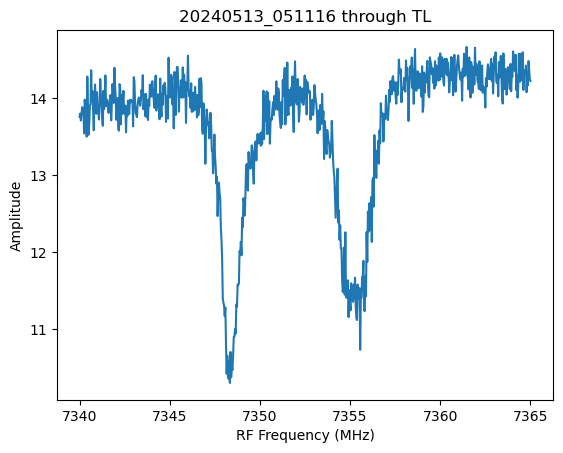

Creating dataset with series 20240513_051334
converting time variables from us to clock ticks
Saving data as: 20240513_051334_freq_scan_CB.h5


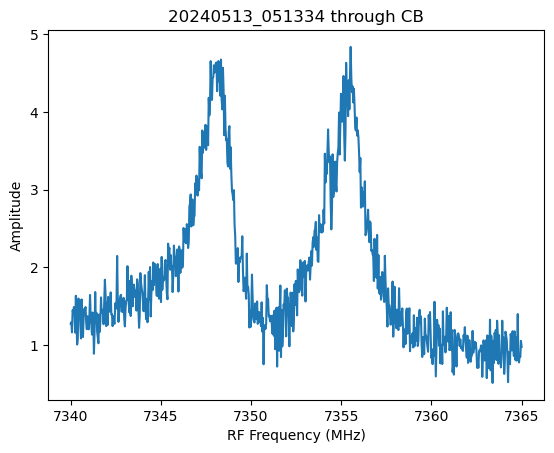

Creating dataset with series 20240513_051525
converting time variables from us to clock ticks
Saving data as: 20240513_051525_freq_scan_TL.h5


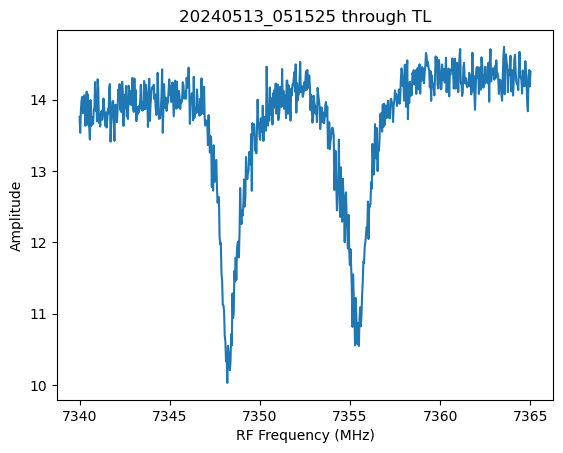

Creating dataset with series 20240513_051742
converting time variables from us to clock ticks
Saving data as: 20240513_051742_freq_scan_CB.h5


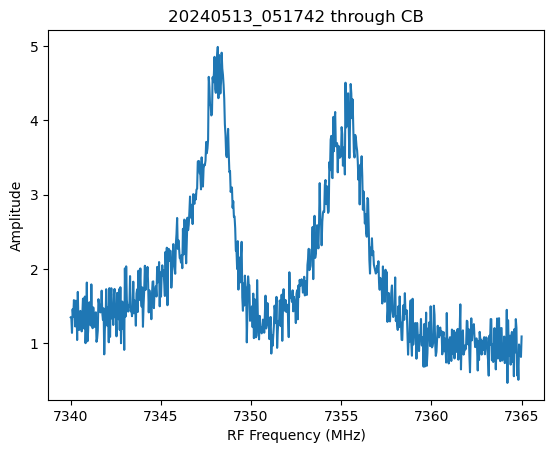

Creating dataset with series 20240513_051933
converting time variables from us to clock ticks
Saving data as: 20240513_051933_freq_scan_TL.h5


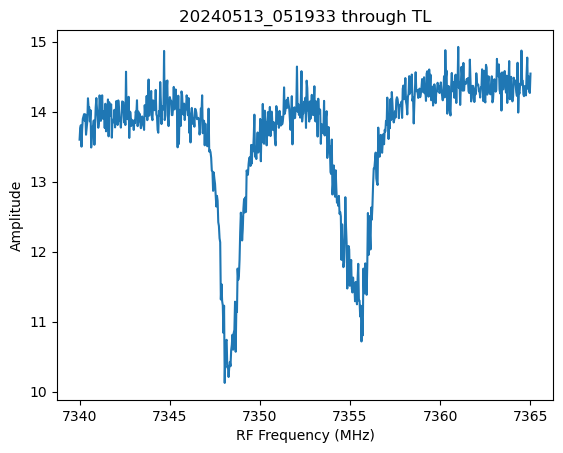

Creating dataset with series 20240513_052151
converting time variables from us to clock ticks
Saving data as: 20240513_052151_freq_scan_CB.h5


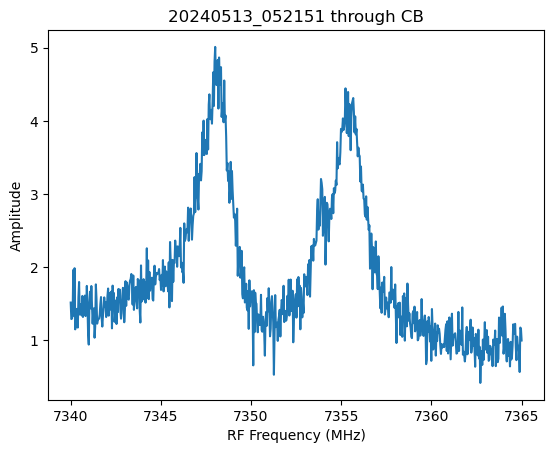

Creating dataset with series 20240513_052342
converting time variables from us to clock ticks
Saving data as: 20240513_052342_freq_scan_TL.h5


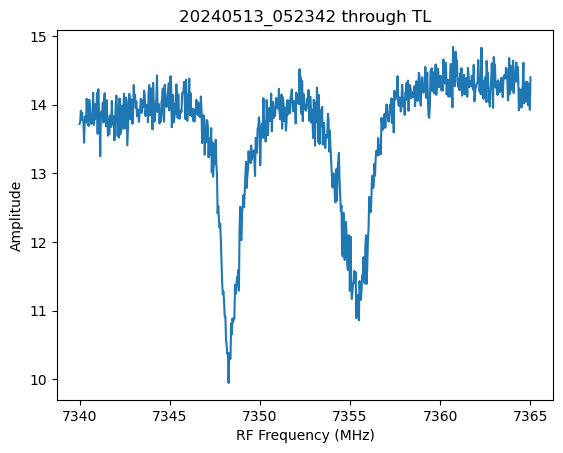

Creating dataset with series 20240513_052600
converting time variables from us to clock ticks
Saving data as: 20240513_052600_freq_scan_CB.h5


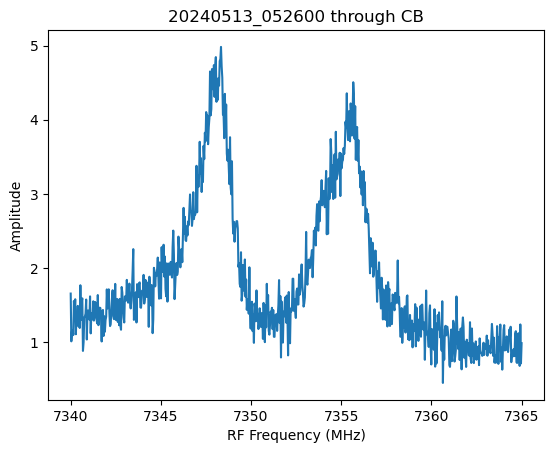

Creating dataset with series 20240513_052751
converting time variables from us to clock ticks
Saving data as: 20240513_052751_freq_scan_TL.h5


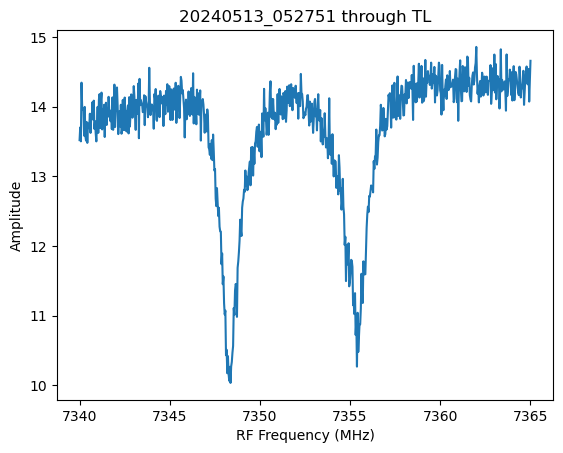

Creating dataset with series 20240513_053009
converting time variables from us to clock ticks
Saving data as: 20240513_053009_freq_scan_CB.h5


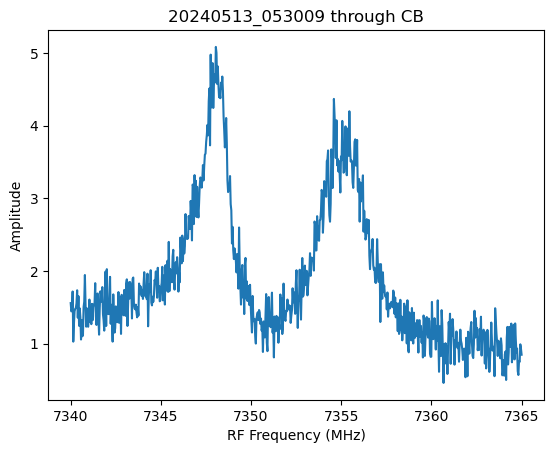

Creating dataset with series 20240513_053200
converting time variables from us to clock ticks
Saving data as: 20240513_053200_freq_scan_TL.h5


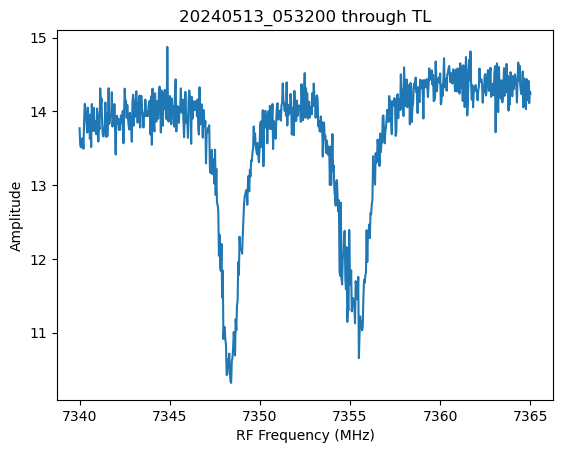

Creating dataset with series 20240513_053417
converting time variables from us to clock ticks
Saving data as: 20240513_053417_freq_scan_CB.h5


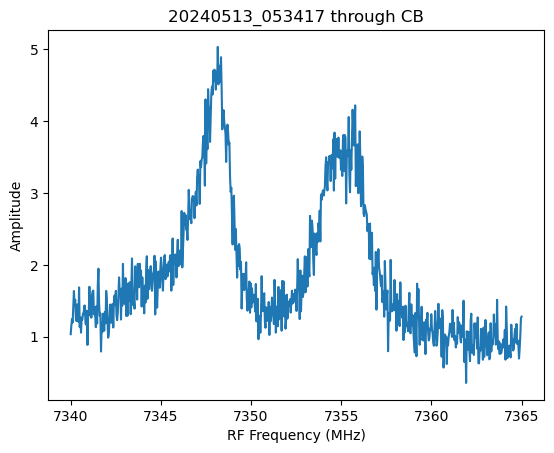

Creating dataset with series 20240513_053608
converting time variables from us to clock ticks
Saving data as: 20240513_053608_freq_scan_TL.h5


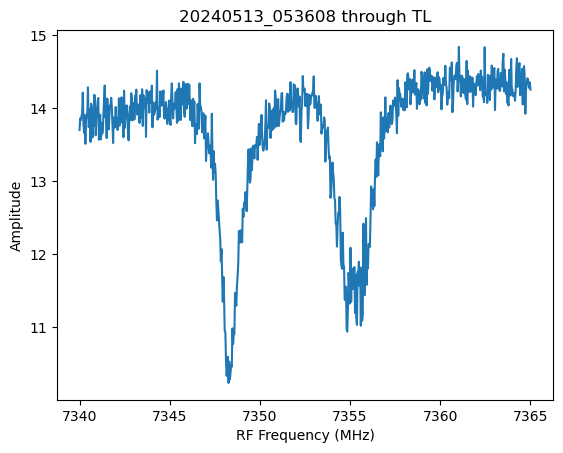

Creating dataset with series 20240513_053826
converting time variables from us to clock ticks
Saving data as: 20240513_053826_freq_scan_CB.h5


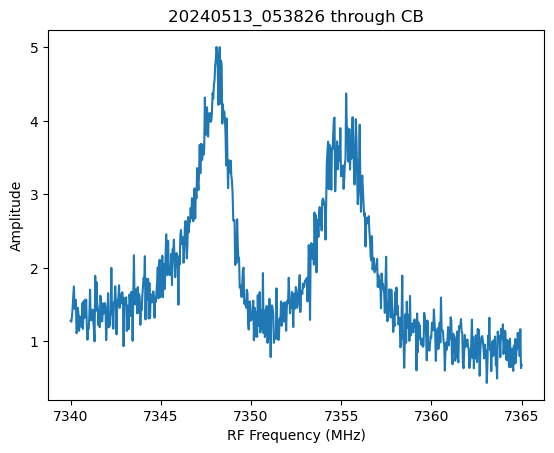

Creating dataset with series 20240513_054017
converting time variables from us to clock ticks
Saving data as: 20240513_054017_freq_scan_TL.h5


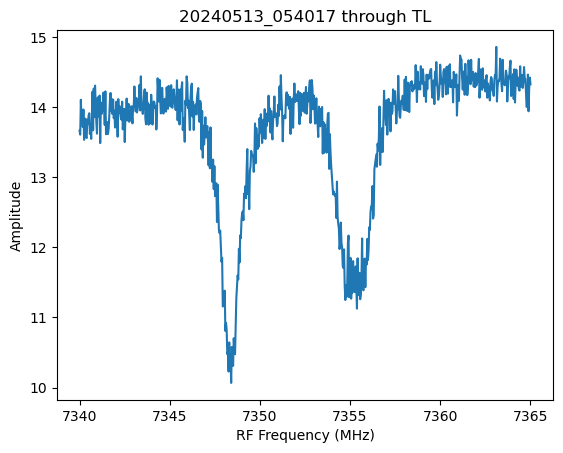

Creating dataset with series 20240513_054235
converting time variables from us to clock ticks
Saving data as: 20240513_054235_freq_scan_CB.h5


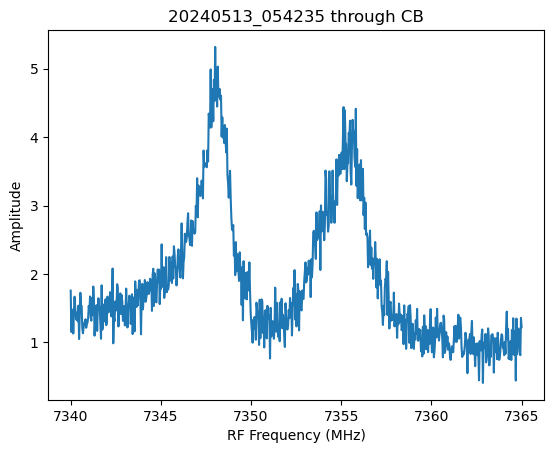

Creating dataset with series 20240513_054426
converting time variables from us to clock ticks
Saving data as: 20240513_054426_freq_scan_TL.h5


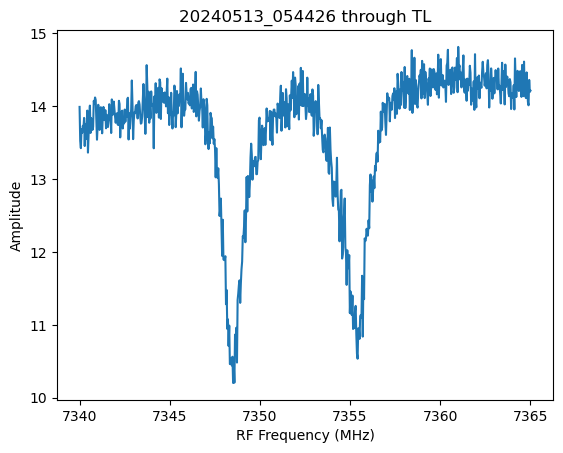

Creating dataset with series 20240513_054644
converting time variables from us to clock ticks
Saving data as: 20240513_054644_freq_scan_CB.h5


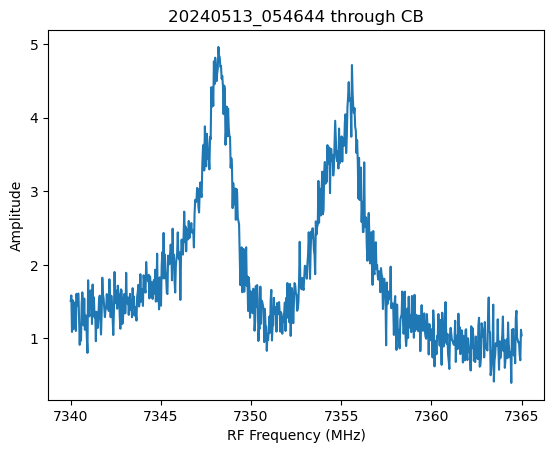

Creating dataset with series 20240513_054835
converting time variables from us to clock ticks
Saving data as: 20240513_054835_freq_scan_TL.h5


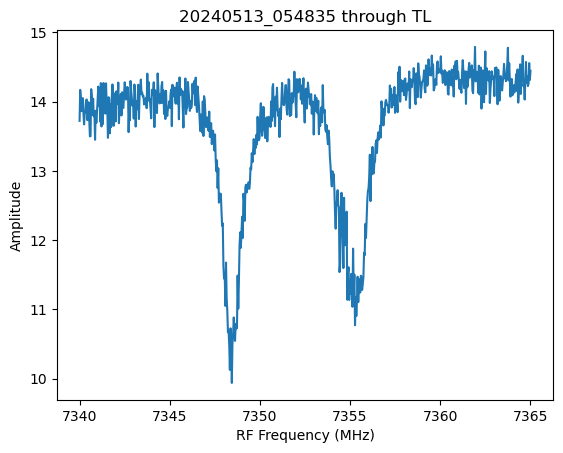

Creating dataset with series 20240513_055052
converting time variables from us to clock ticks
Saving data as: 20240513_055052_freq_scan_CB.h5


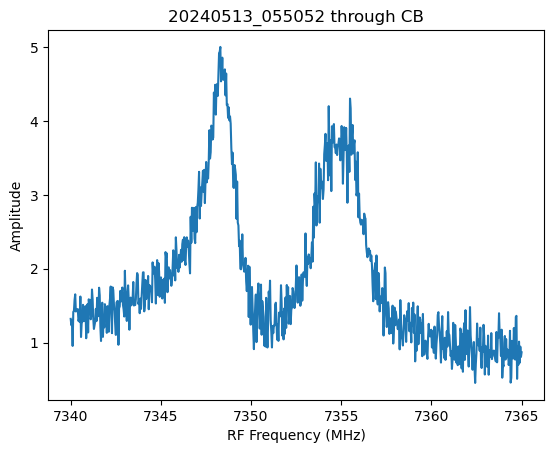

Creating dataset with series 20240513_055243
converting time variables from us to clock ticks
Saving data as: 20240513_055243_freq_scan_TL.h5


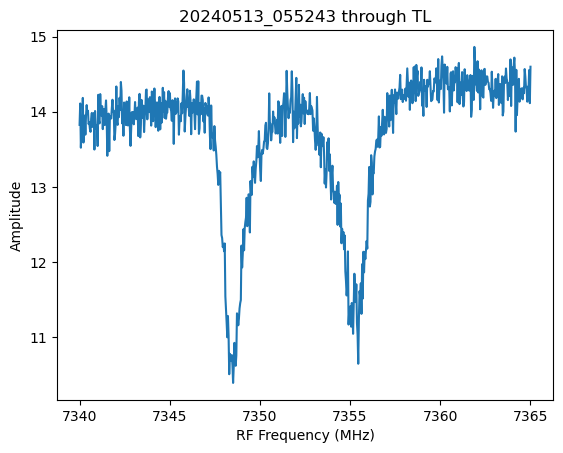

Creating dataset with series 20240513_055501
converting time variables from us to clock ticks
Saving data as: 20240513_055501_freq_scan_CB.h5


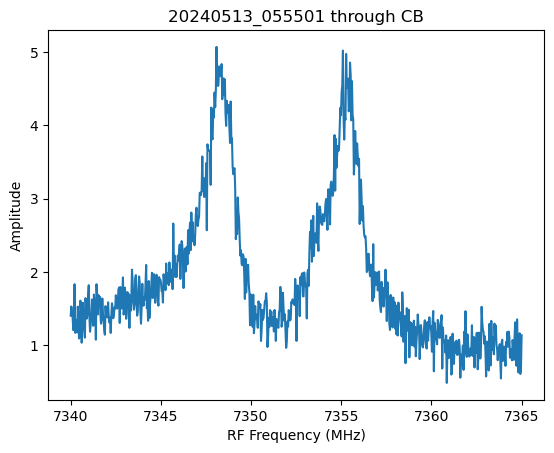

Creating dataset with series 20240513_055652
converting time variables from us to clock ticks
Saving data as: 20240513_055652_freq_scan_TL.h5


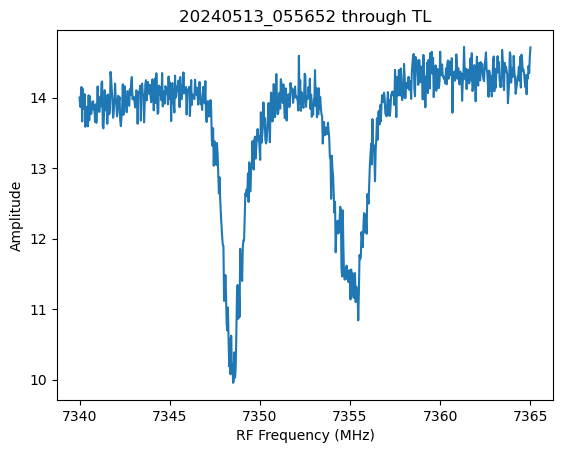

Creating dataset with series 20240513_055910
converting time variables from us to clock ticks
Saving data as: 20240513_055910_freq_scan_CB.h5


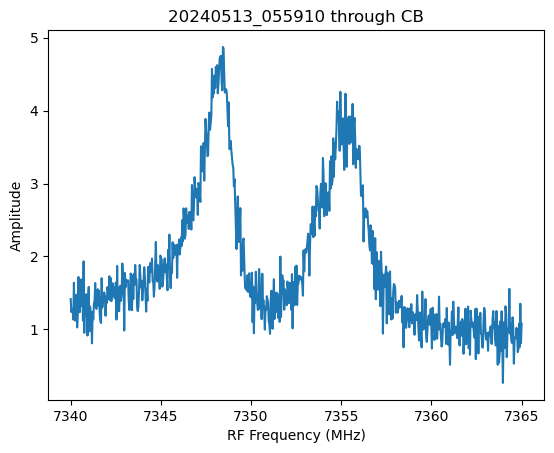

Creating dataset with series 20240513_060101
converting time variables from us to clock ticks
Saving data as: 20240513_060101_freq_scan_TL.h5


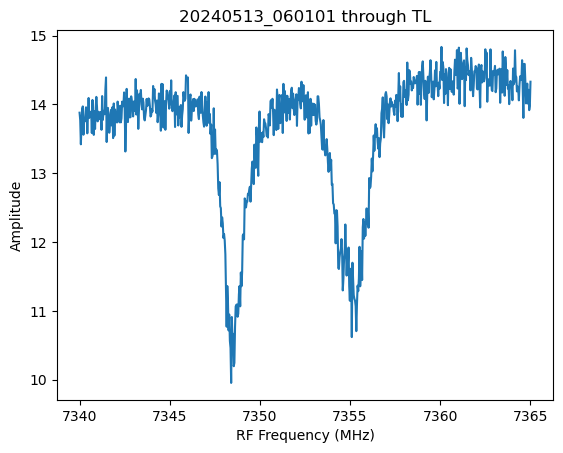

Creating dataset with series 20240513_060319
converting time variables from us to clock ticks
Saving data as: 20240513_060319_freq_scan_CB.h5


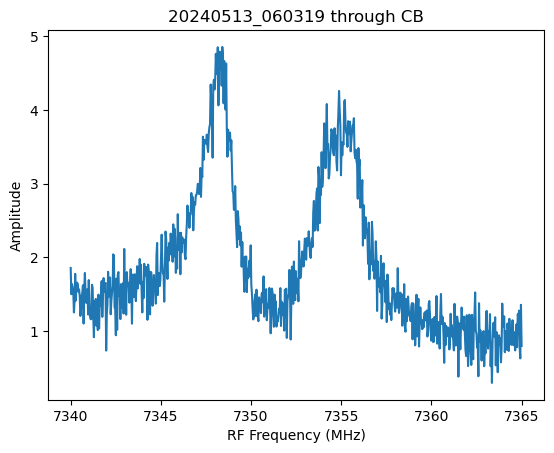

Creating dataset with series 20240513_060510
converting time variables from us to clock ticks
Saving data as: 20240513_060510_freq_scan_TL.h5


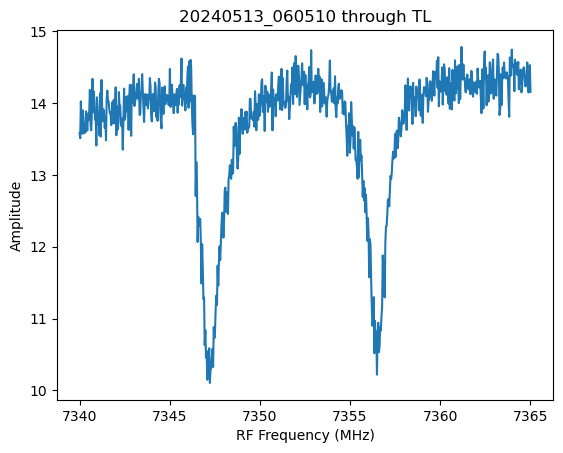

Creating dataset with series 20240513_060728
converting time variables from us to clock ticks
Saving data as: 20240513_060728_freq_scan_CB.h5


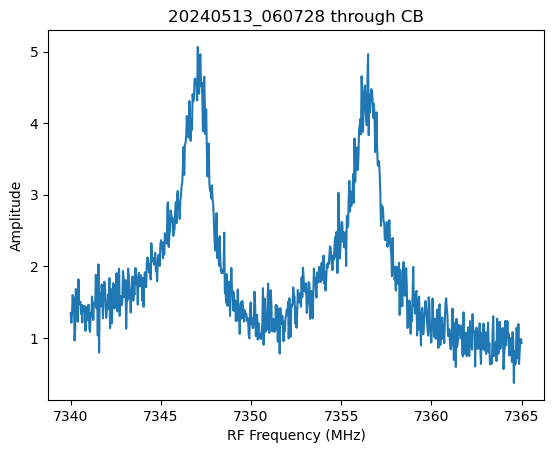

Creating dataset with series 20240513_060919
converting time variables from us to clock ticks
Saving data as: 20240513_060919_freq_scan_TL.h5


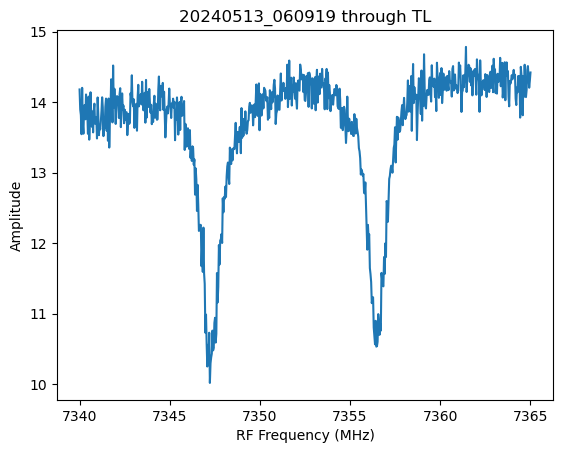

Creating dataset with series 20240513_061136
converting time variables from us to clock ticks
Saving data as: 20240513_061136_freq_scan_CB.h5


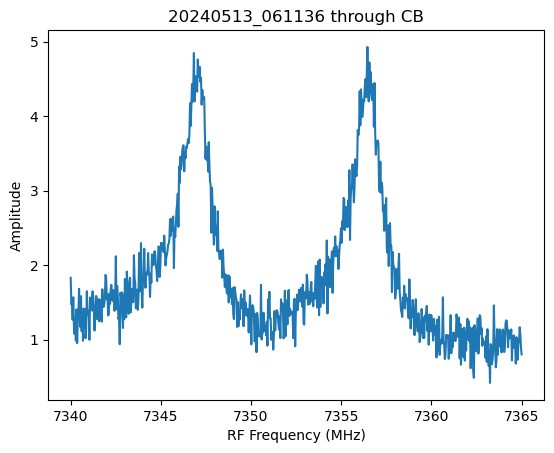

Creating dataset with series 20240513_061327
converting time variables from us to clock ticks
Saving data as: 20240513_061327_freq_scan_TL.h5


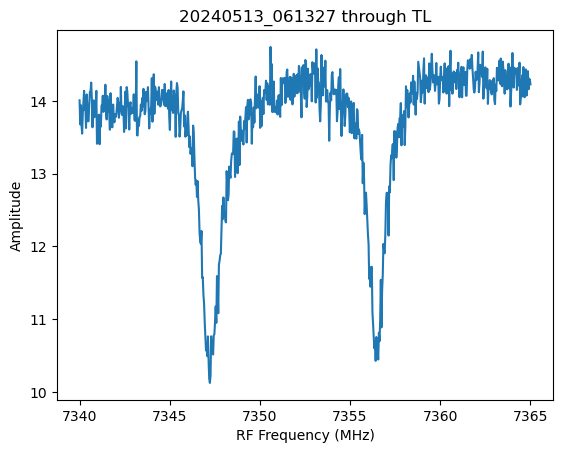

Creating dataset with series 20240513_061545
converting time variables from us to clock ticks
Saving data as: 20240513_061545_freq_scan_CB.h5


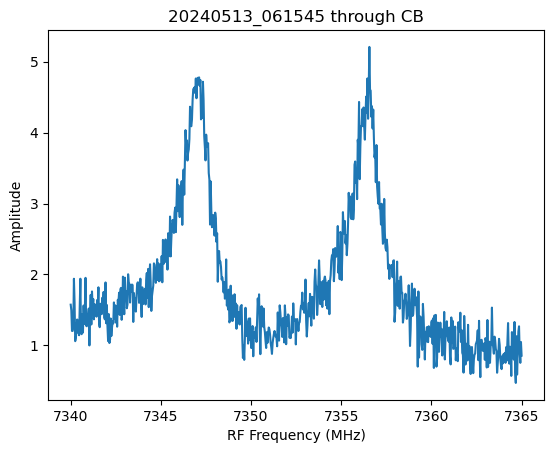

Creating dataset with series 20240513_061736
converting time variables from us to clock ticks
Saving data as: 20240513_061736_freq_scan_TL.h5


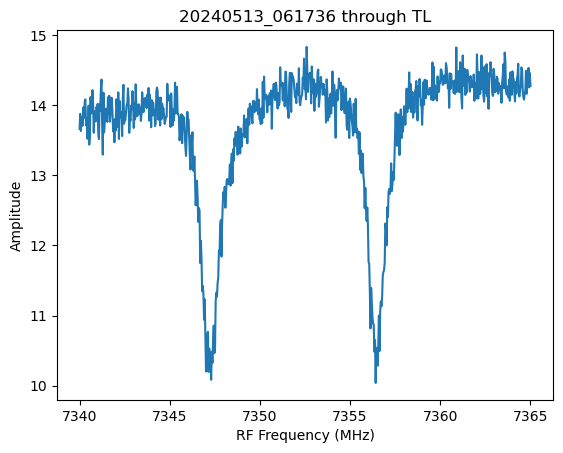

Creating dataset with series 20240513_061954
converting time variables from us to clock ticks
Saving data as: 20240513_061954_freq_scan_CB.h5


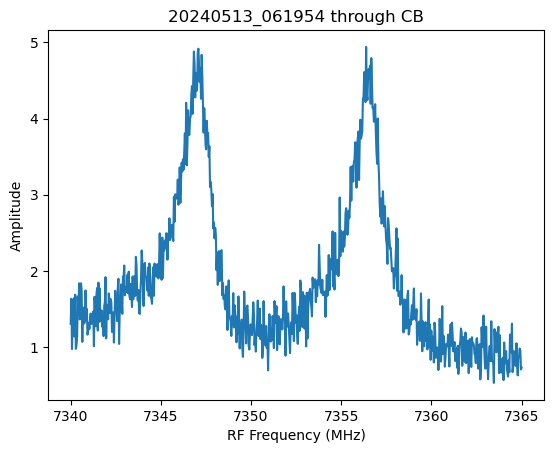

Creating dataset with series 20240513_062145
converting time variables from us to clock ticks
Saving data as: 20240513_062145_freq_scan_TL.h5


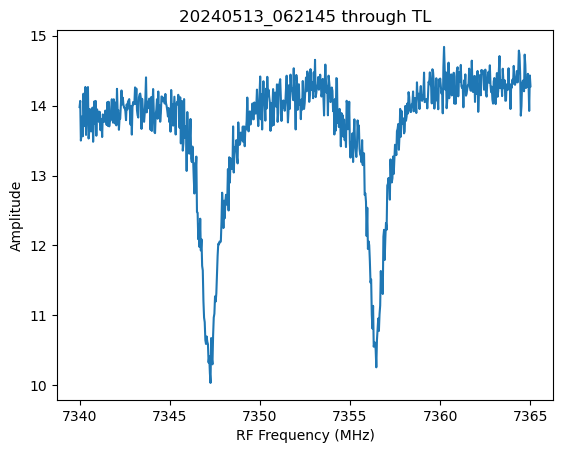

Creating dataset with series 20240513_062403
converting time variables from us to clock ticks
Saving data as: 20240513_062403_freq_scan_CB.h5


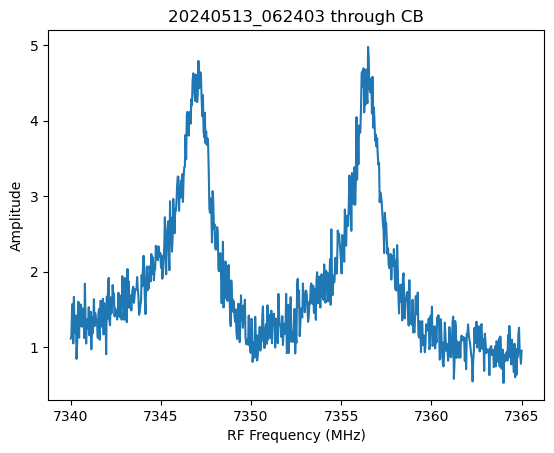

Creating dataset with series 20240513_062554
converting time variables from us to clock ticks
Saving data as: 20240513_062554_freq_scan_TL.h5


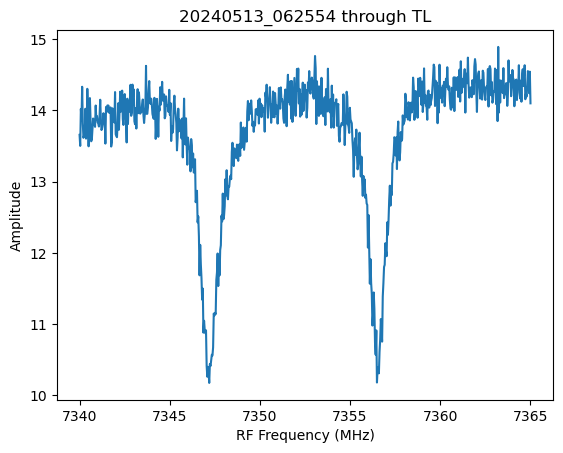

Creating dataset with series 20240513_062811
converting time variables from us to clock ticks
Saving data as: 20240513_062811_freq_scan_CB.h5


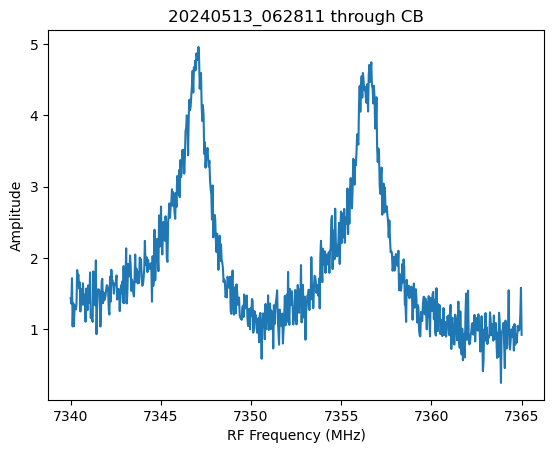

Creating dataset with series 20240513_063002
converting time variables from us to clock ticks
Saving data as: 20240513_063002_freq_scan_TL.h5


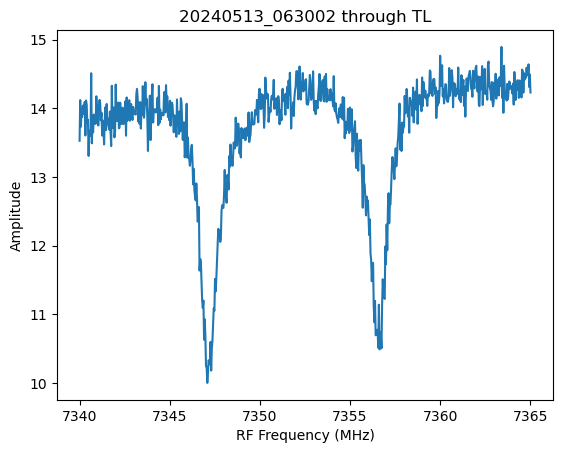

Creating dataset with series 20240513_063220
converting time variables from us to clock ticks
Saving data as: 20240513_063220_freq_scan_CB.h5


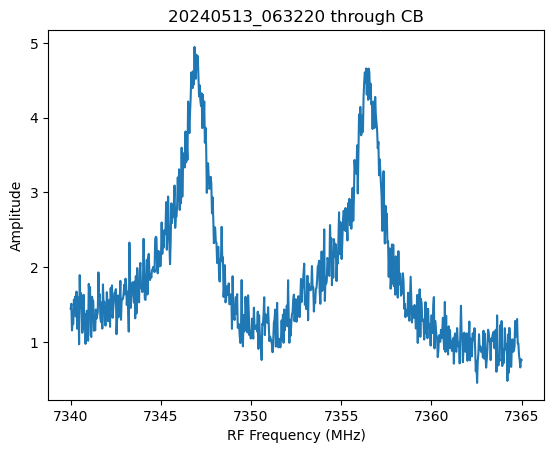

Creating dataset with series 20240513_063411
converting time variables from us to clock ticks
Saving data as: 20240513_063411_freq_scan_TL.h5


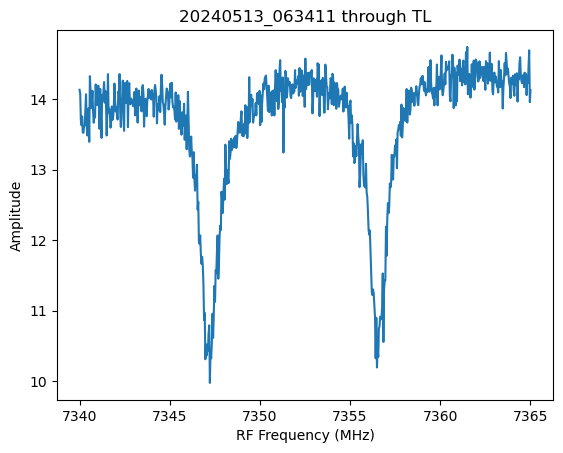

Creating dataset with series 20240513_063629
converting time variables from us to clock ticks
Saving data as: 20240513_063629_freq_scan_CB.h5


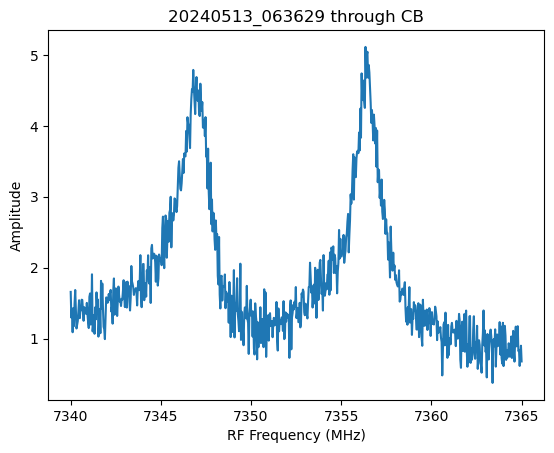

Creating dataset with series 20240513_063820
converting time variables from us to clock ticks
Saving data as: 20240513_063820_freq_scan_TL.h5


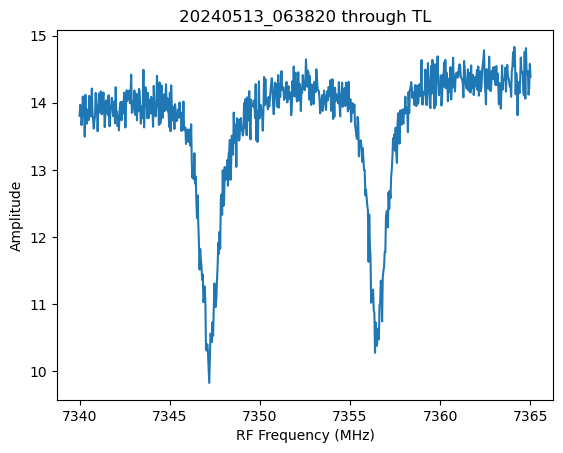

Creating dataset with series 20240513_064038
converting time variables from us to clock ticks
Saving data as: 20240513_064038_freq_scan_CB.h5


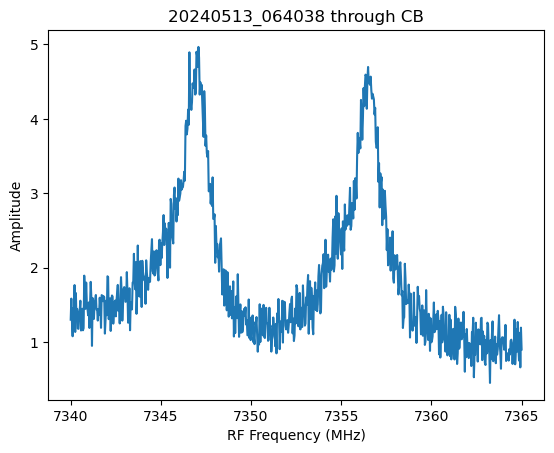

Creating dataset with series 20240513_064229
converting time variables from us to clock ticks
Saving data as: 20240513_064229_freq_scan_TL.h5


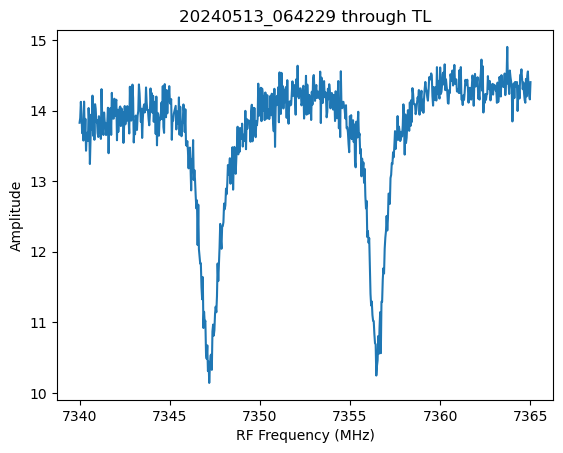

Creating dataset with series 20240513_064446
converting time variables from us to clock ticks
Saving data as: 20240513_064446_freq_scan_CB.h5


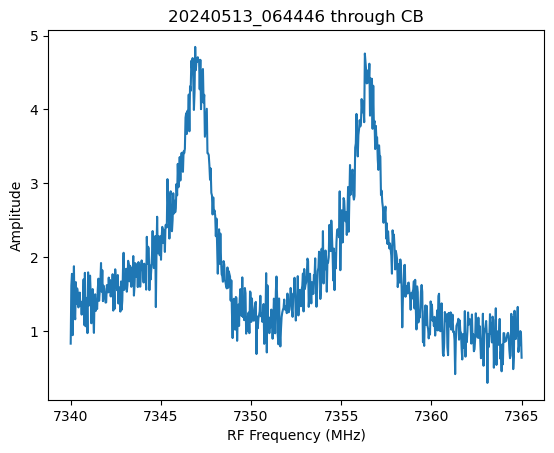

Creating dataset with series 20240513_064637
converting time variables from us to clock ticks
Saving data as: 20240513_064637_freq_scan_TL.h5


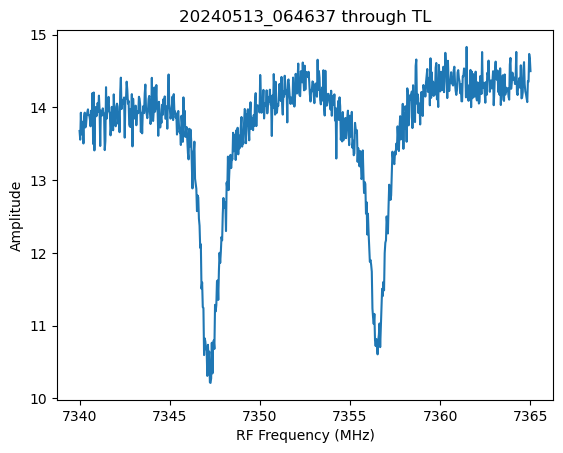

Creating dataset with series 20240513_064855
converting time variables from us to clock ticks
Saving data as: 20240513_064855_freq_scan_CB.h5


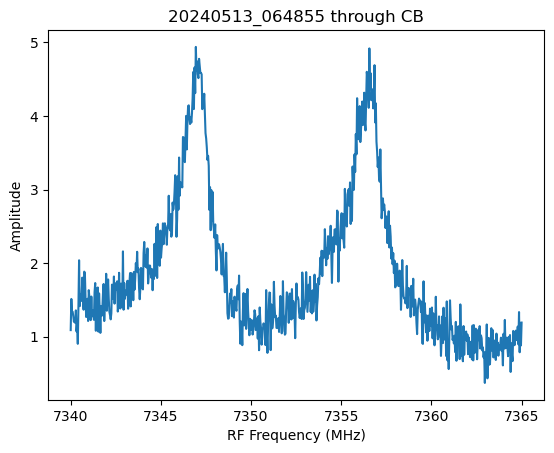

Creating dataset with series 20240513_065046
converting time variables from us to clock ticks
Saving data as: 20240513_065046_freq_scan_TL.h5


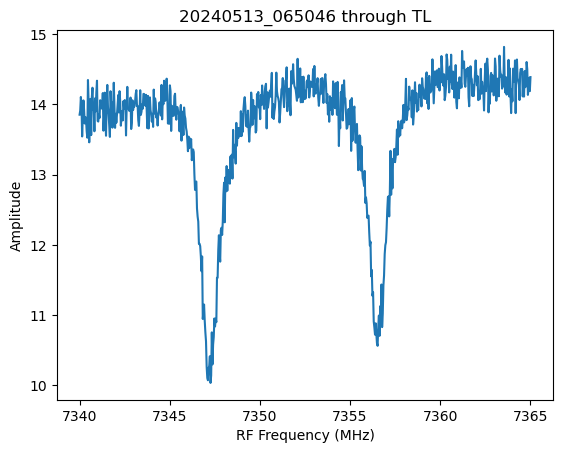

Creating dataset with series 20240513_065304
converting time variables from us to clock ticks
Saving data as: 20240513_065304_freq_scan_CB.h5


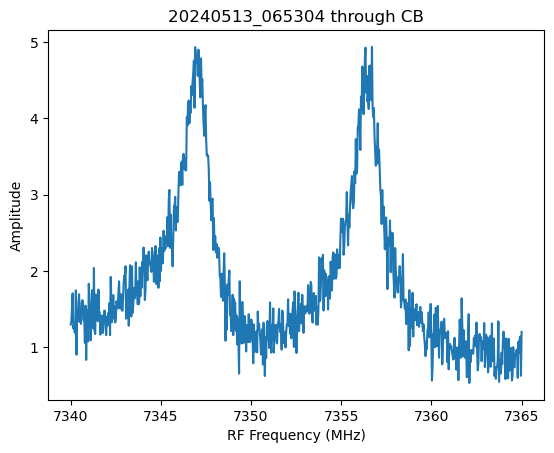

Creating dataset with series 20240513_065455
converting time variables from us to clock ticks
Saving data as: 20240513_065455_freq_scan_TL.h5


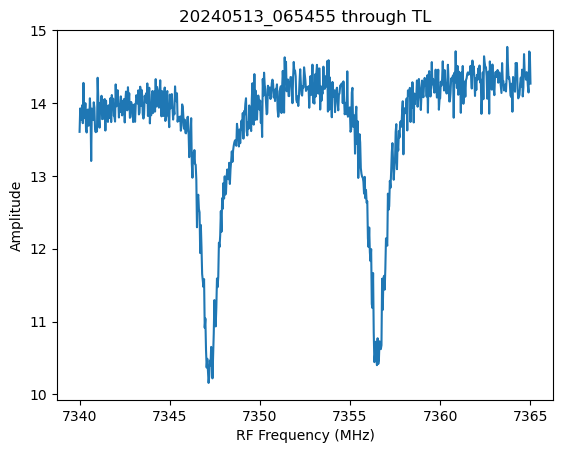

Creating dataset with series 20240513_065712
converting time variables from us to clock ticks
Saving data as: 20240513_065712_freq_scan_CB.h5


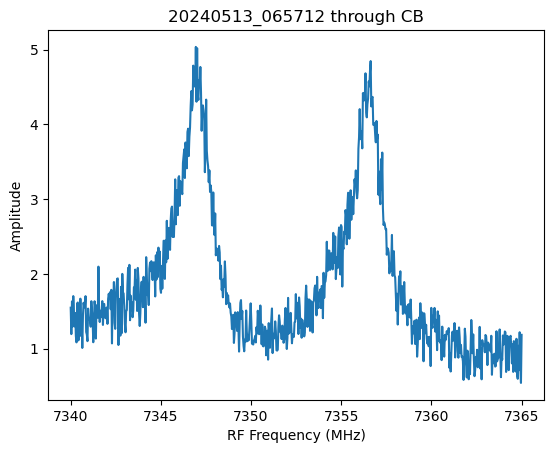

Creating dataset with series 20240513_065903
converting time variables from us to clock ticks
Saving data as: 20240513_065903_freq_scan_TL.h5


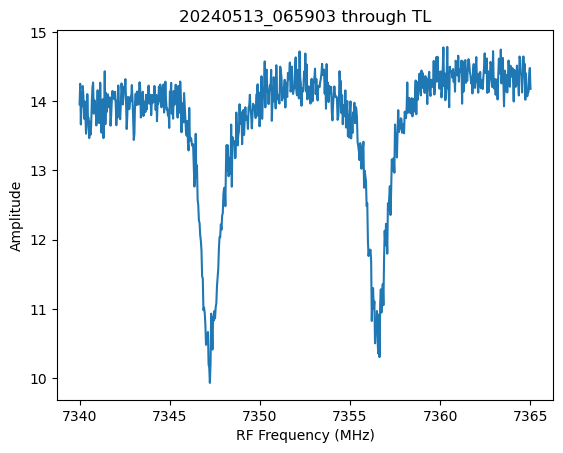

Creating dataset with series 20240513_070121
converting time variables from us to clock ticks
Saving data as: 20240513_070121_freq_scan_CB.h5


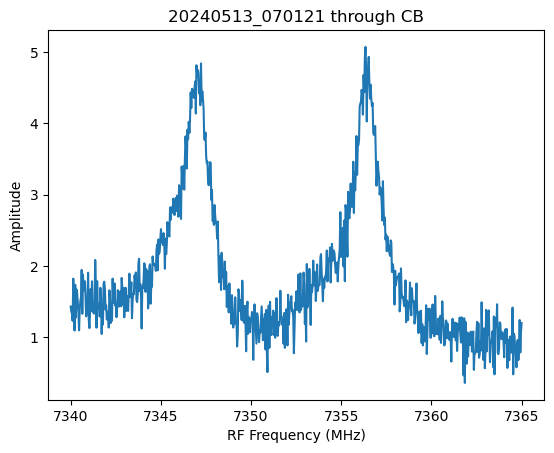

Creating dataset with series 20240513_070312
converting time variables from us to clock ticks
Saving data as: 20240513_070312_freq_scan_TL.h5


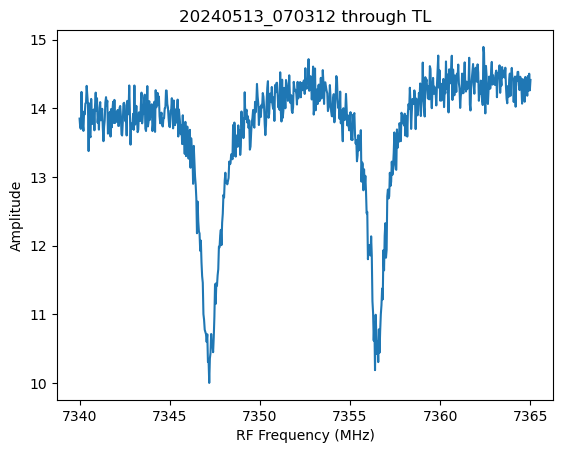

Creating dataset with series 20240513_070530
converting time variables from us to clock ticks
Saving data as: 20240513_070530_freq_scan_CB.h5


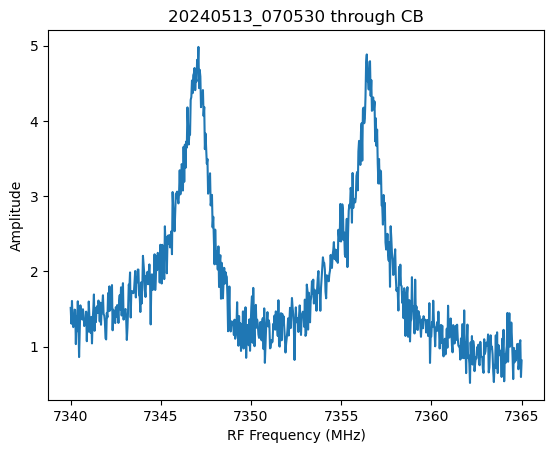

Creating dataset with series 20240513_070721
converting time variables from us to clock ticks
Saving data as: 20240513_070721_freq_scan_TL.h5


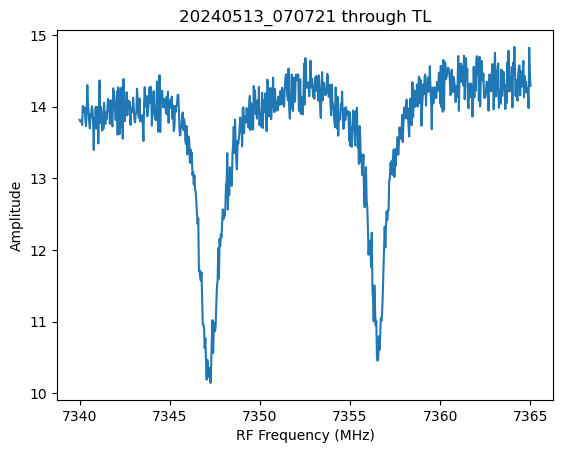

Creating dataset with series 20240513_070938
converting time variables from us to clock ticks
Saving data as: 20240513_070938_freq_scan_CB.h5


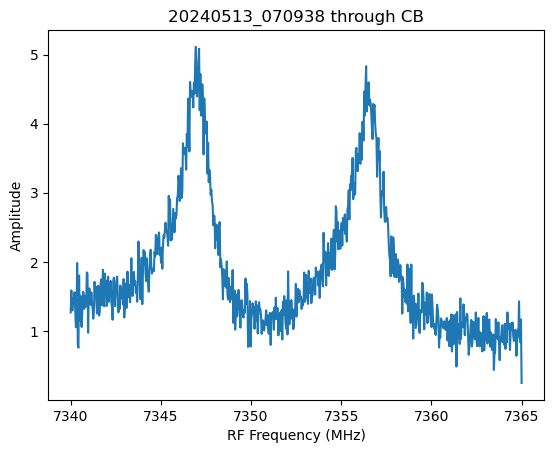

Creating dataset with series 20240513_071129
converting time variables from us to clock ticks
Saving data as: 20240513_071129_freq_scan_TL.h5


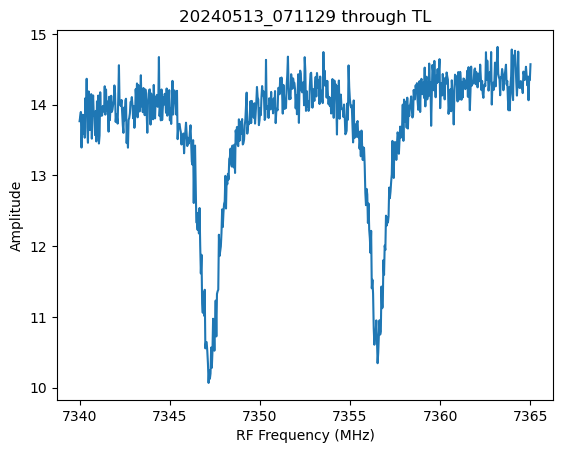

Creating dataset with series 20240513_071347
converting time variables from us to clock ticks
Saving data as: 20240513_071347_freq_scan_CB.h5


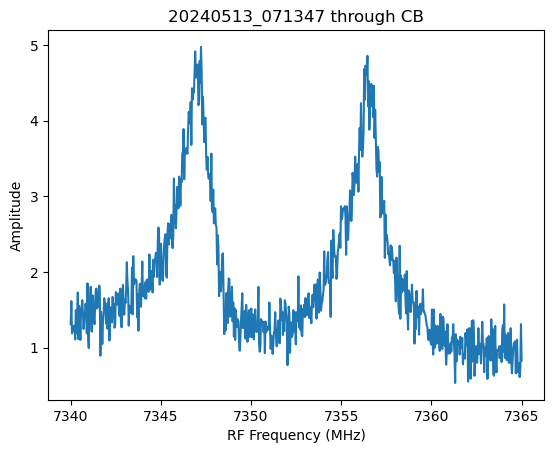

Creating dataset with series 20240513_071538
converting time variables from us to clock ticks
Saving data as: 20240513_071538_freq_scan_TL.h5


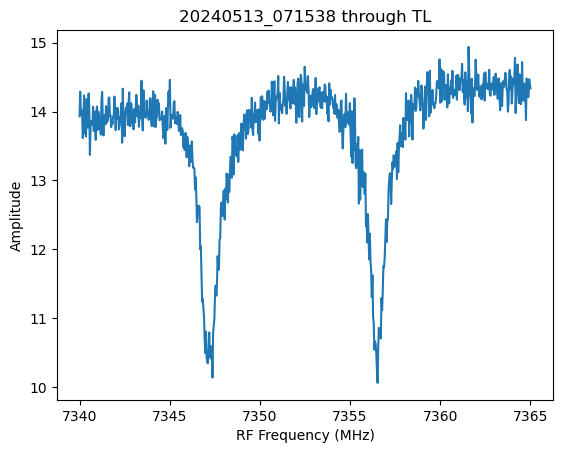

Creating dataset with series 20240513_071756
converting time variables from us to clock ticks
Saving data as: 20240513_071756_freq_scan_CB.h5


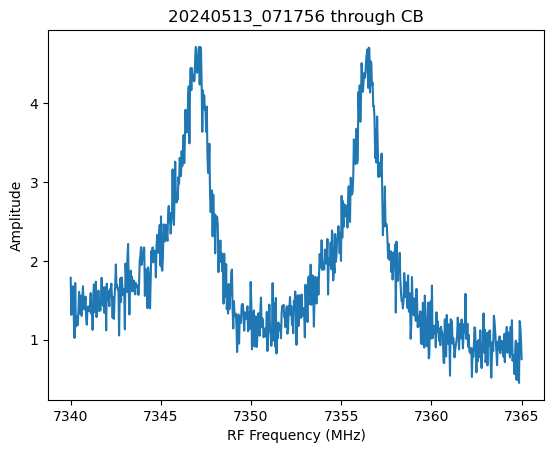

Creating dataset with series 20240513_071947
converting time variables from us to clock ticks
Saving data as: 20240513_071947_freq_scan_TL.h5


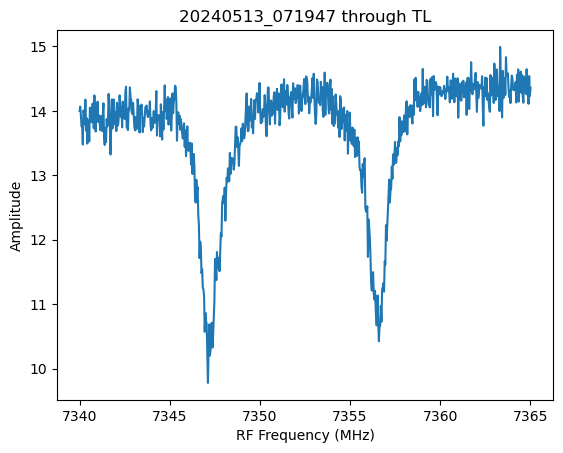

Creating dataset with series 20240513_072204
converting time variables from us to clock ticks
Saving data as: 20240513_072204_freq_scan_CB.h5


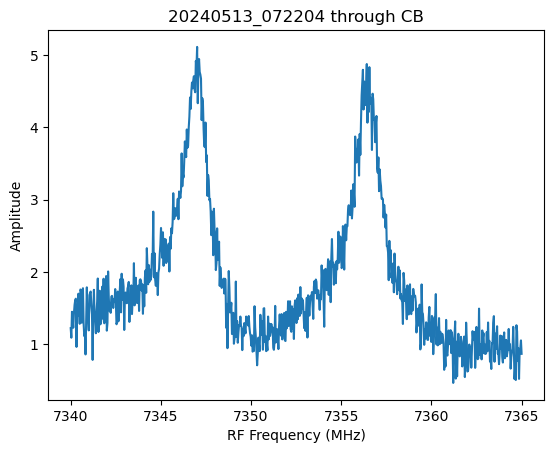

Creating dataset with series 20240513_072355
converting time variables from us to clock ticks
Saving data as: 20240513_072355_freq_scan_TL.h5


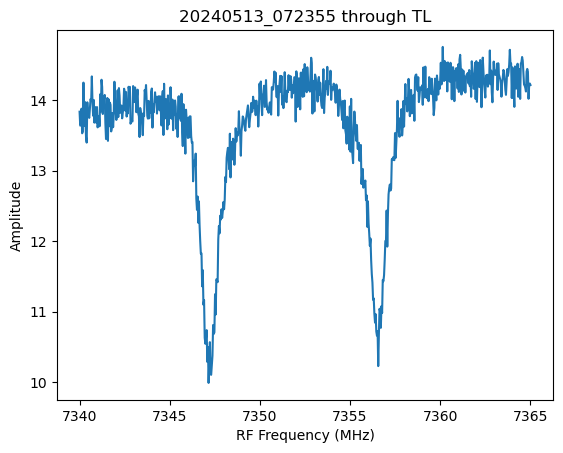

Creating dataset with series 20240513_072613
converting time variables from us to clock ticks
Saving data as: 20240513_072613_freq_scan_CB.h5


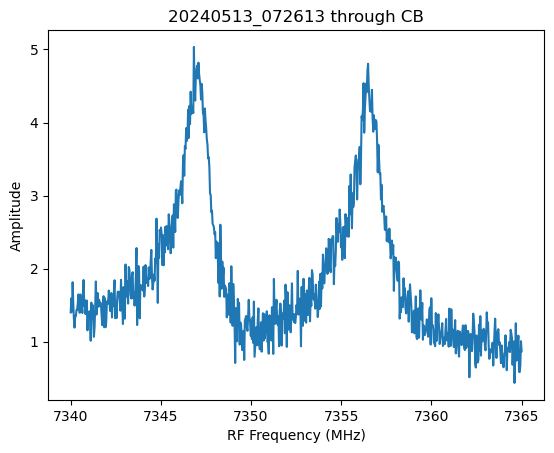

Creating dataset with series 20240513_072804
converting time variables from us to clock ticks
Saving data as: 20240513_072804_freq_scan_TL.h5


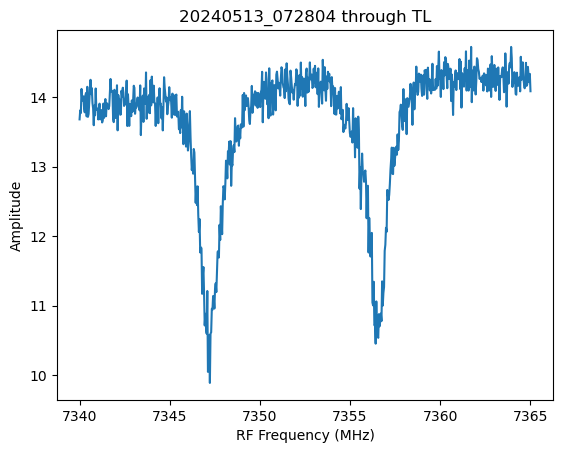

Creating dataset with series 20240513_073022
converting time variables from us to clock ticks
Saving data as: 20240513_073022_freq_scan_CB.h5


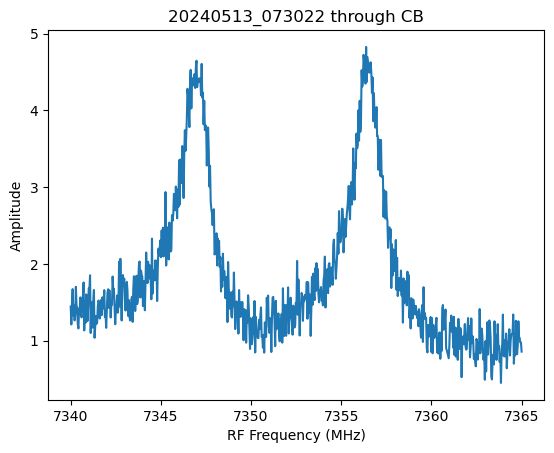

Creating dataset with series 20240513_073213
converting time variables from us to clock ticks
Saving data as: 20240513_073213_freq_scan_TL.h5


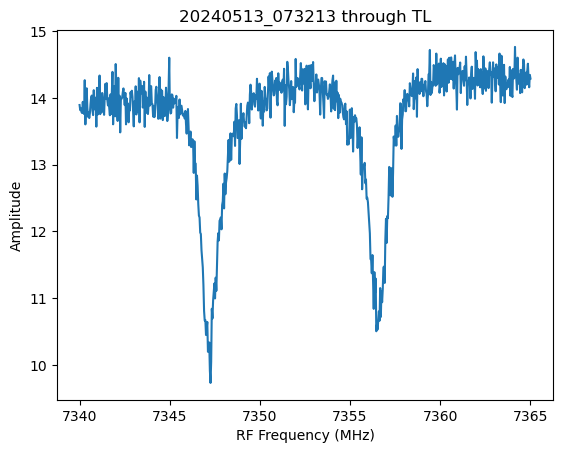

Creating dataset with series 20240513_073430
converting time variables from us to clock ticks
Saving data as: 20240513_073430_freq_scan_CB.h5


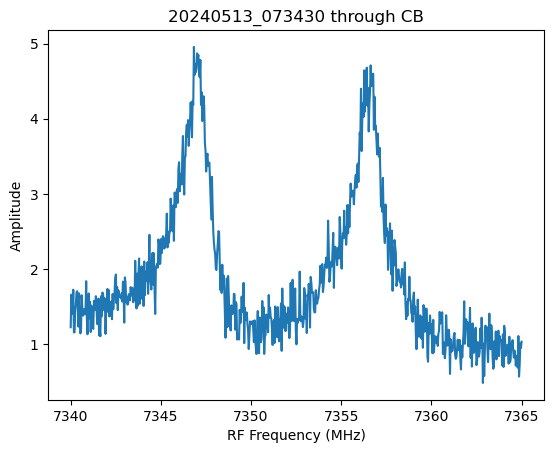

Creating dataset with series 20240513_073621
converting time variables from us to clock ticks
Saving data as: 20240513_073621_freq_scan_TL.h5


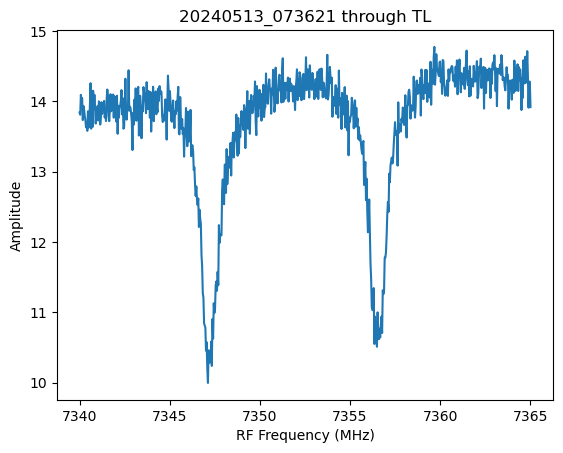

Creating dataset with series 20240513_073839
converting time variables from us to clock ticks
Saving data as: 20240513_073839_freq_scan_CB.h5


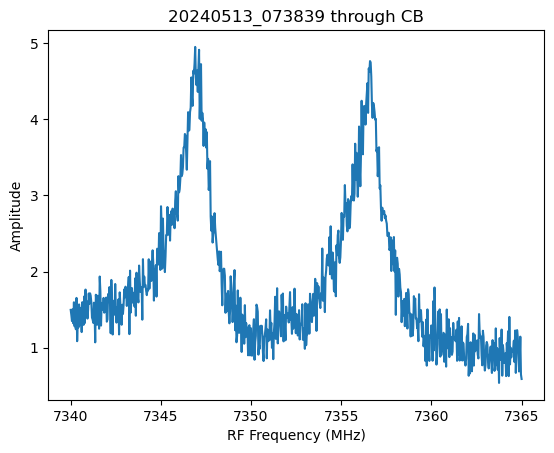

Creating dataset with series 20240513_074030
converting time variables from us to clock ticks
Saving data as: 20240513_074030_freq_scan_TL.h5


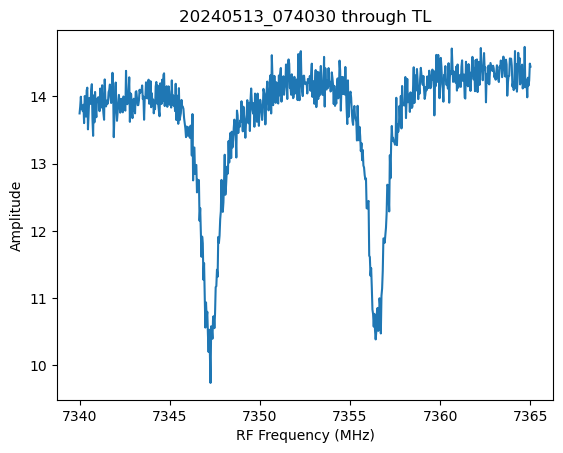

Creating dataset with series 20240513_074248
converting time variables from us to clock ticks
Saving data as: 20240513_074248_freq_scan_CB.h5


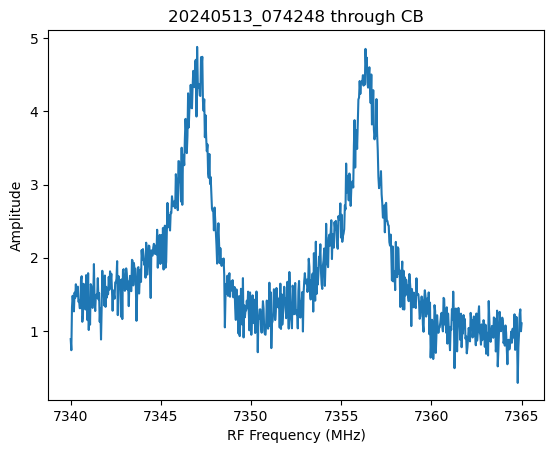

Creating dataset with series 20240513_074439
converting time variables from us to clock ticks
Saving data as: 20240513_074439_freq_scan_TL.h5


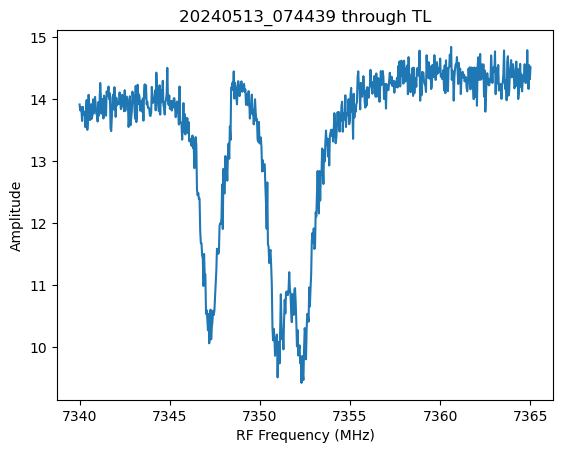

Creating dataset with series 20240513_074657
converting time variables from us to clock ticks
Saving data as: 20240513_074657_freq_scan_CB.h5


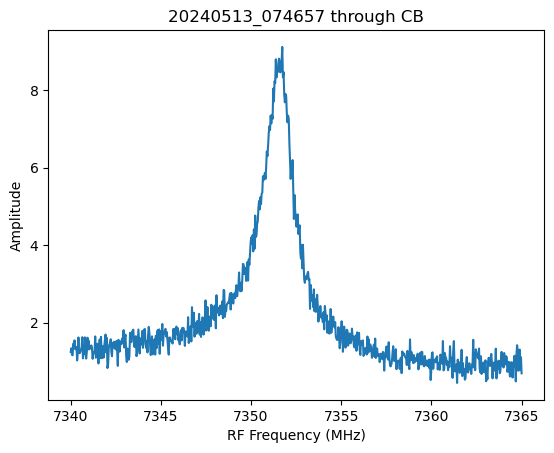

Creating dataset with series 20240513_074848
converting time variables from us to clock ticks
Saving data as: 20240513_074848_freq_scan_TL.h5


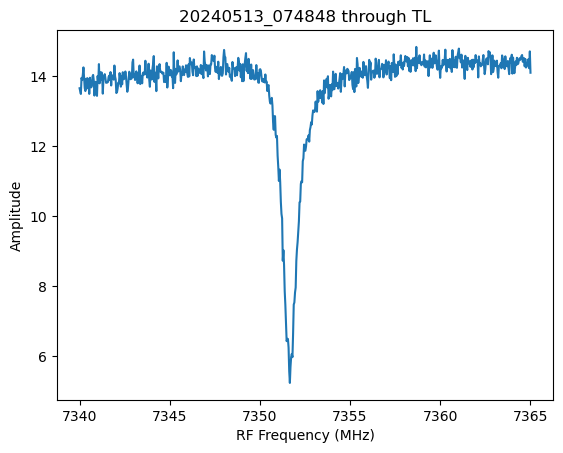

Creating dataset with series 20240513_075105
converting time variables from us to clock ticks
Saving data as: 20240513_075105_freq_scan_CB.h5


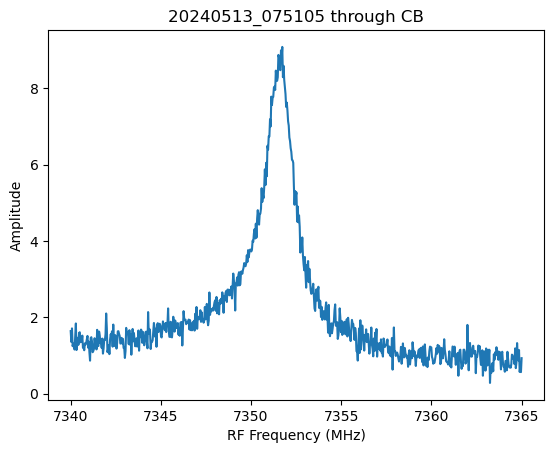

Creating dataset with series 20240513_075256
converting time variables from us to clock ticks
Saving data as: 20240513_075256_freq_scan_TL.h5


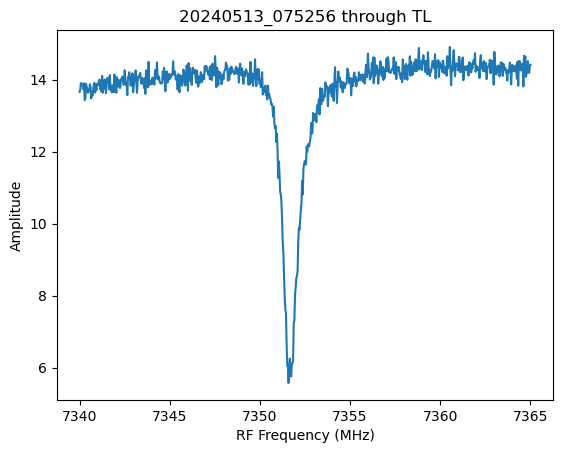

Creating dataset with series 20240513_075514
converting time variables from us to clock ticks
Saving data as: 20240513_075514_freq_scan_CB.h5


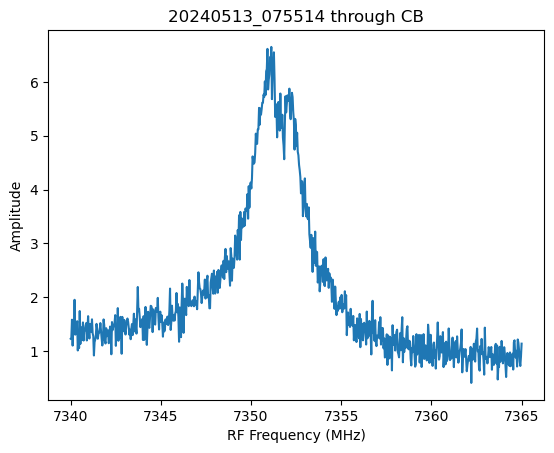

Creating dataset with series 20240513_075705
converting time variables from us to clock ticks
Saving data as: 20240513_075705_freq_scan_TL.h5


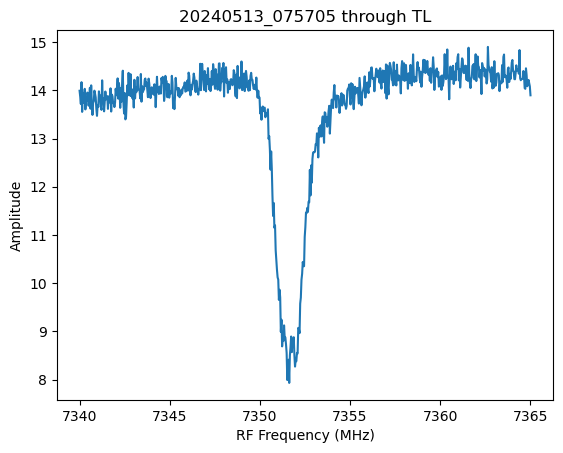

Creating dataset with series 20240513_075923
converting time variables from us to clock ticks
Saving data as: 20240513_075923_freq_scan_CB.h5


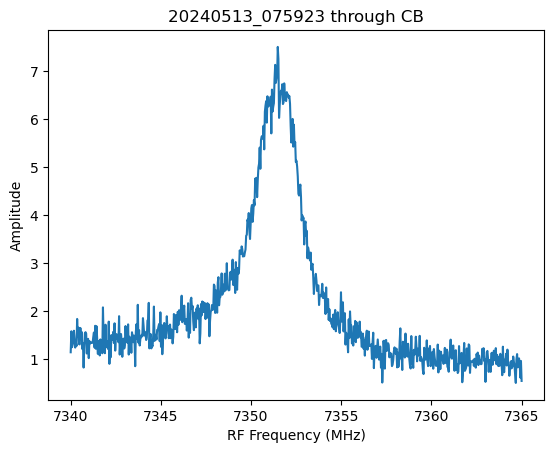

Creating dataset with series 20240513_080114
converting time variables from us to clock ticks
Saving data as: 20240513_080114_freq_scan_TL.h5


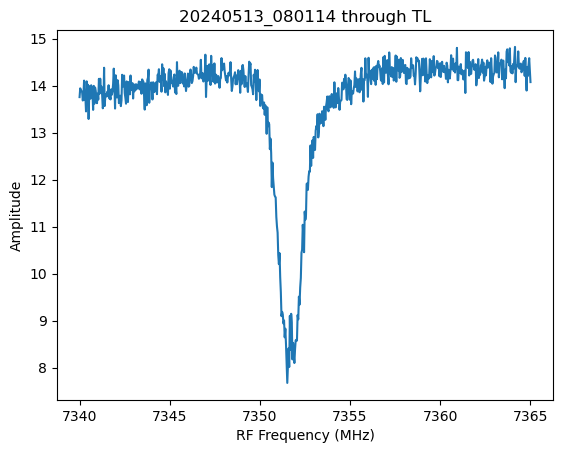

Creating dataset with series 20240513_080331
converting time variables from us to clock ticks
Saving data as: 20240513_080331_freq_scan_CB.h5


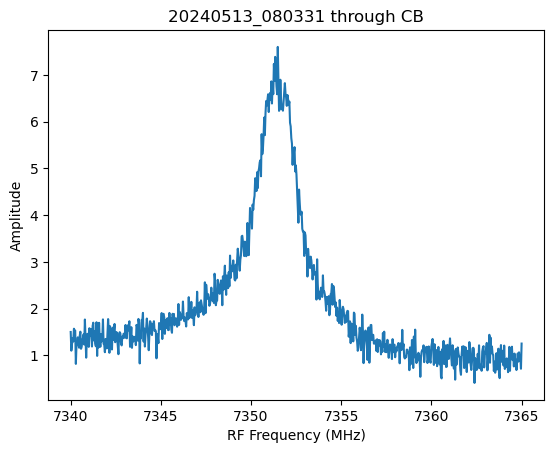

Creating dataset with series 20240513_080522
converting time variables from us to clock ticks
Saving data as: 20240513_080522_freq_scan_TL.h5


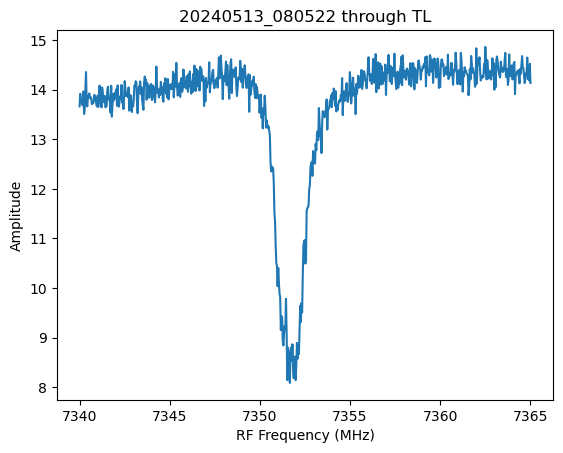

Creating dataset with series 20240513_080740
converting time variables from us to clock ticks
Saving data as: 20240513_080740_freq_scan_CB.h5


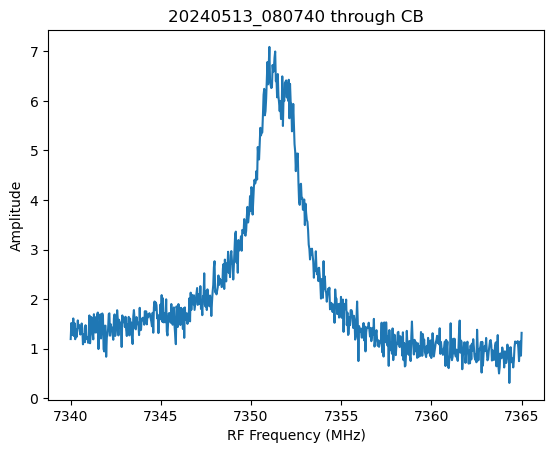

Creating dataset with series 20240513_080931
converting time variables from us to clock ticks
Saving data as: 20240513_080931_freq_scan_TL.h5


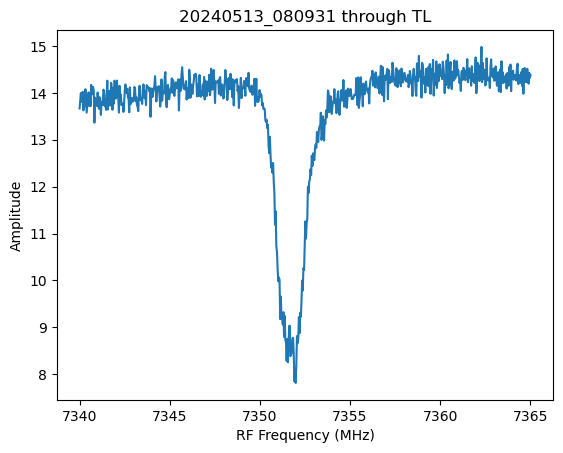

Creating dataset with series 20240513_081149
converting time variables from us to clock ticks
Saving data as: 20240513_081149_freq_scan_CB.h5


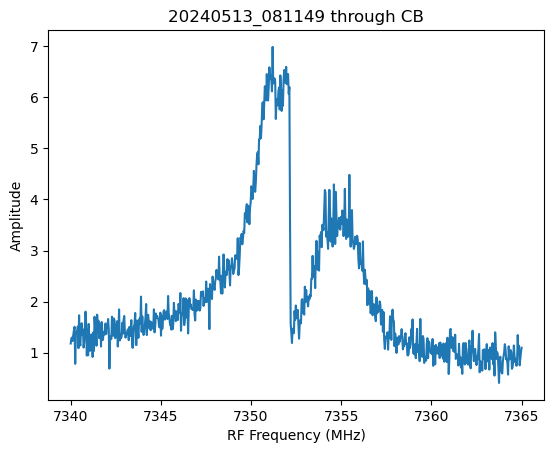

Creating dataset with series 20240513_081340
converting time variables from us to clock ticks
Saving data as: 20240513_081340_freq_scan_TL.h5


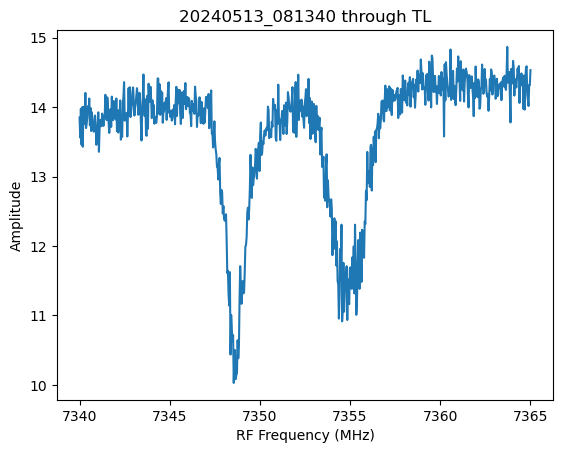

Creating dataset with series 20240513_081558
converting time variables from us to clock ticks
Saving data as: 20240513_081558_freq_scan_CB.h5


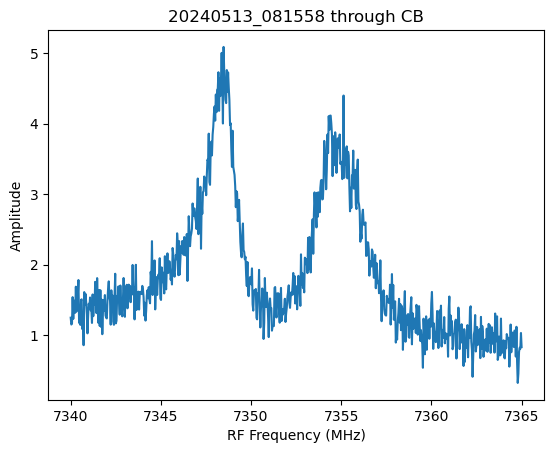

Creating dataset with series 20240513_081748
converting time variables from us to clock ticks
Saving data as: 20240513_081748_freq_scan_TL.h5


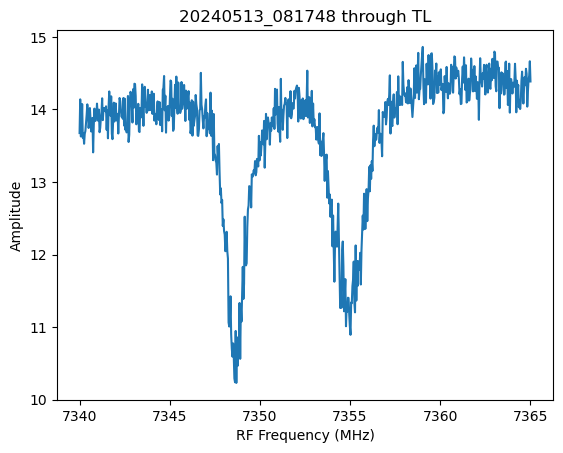

Creating dataset with series 20240513_082006
converting time variables from us to clock ticks
Saving data as: 20240513_082006_freq_scan_CB.h5


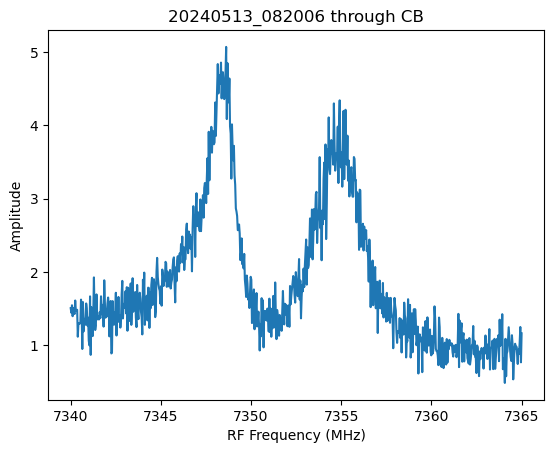

Creating dataset with series 20240513_082157
converting time variables from us to clock ticks
Saving data as: 20240513_082157_freq_scan_TL.h5


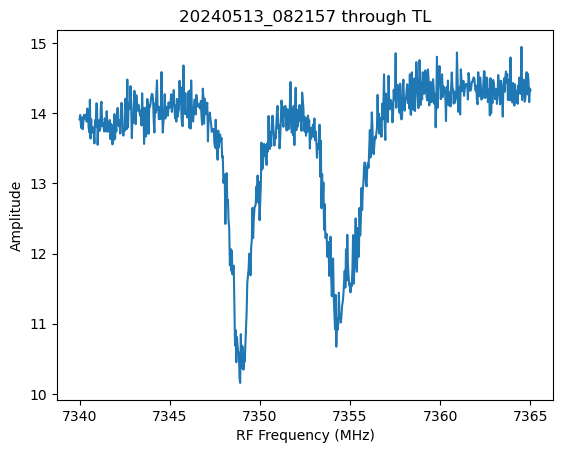

Creating dataset with series 20240513_082415
converting time variables from us to clock ticks
Saving data as: 20240513_082415_freq_scan_CB.h5


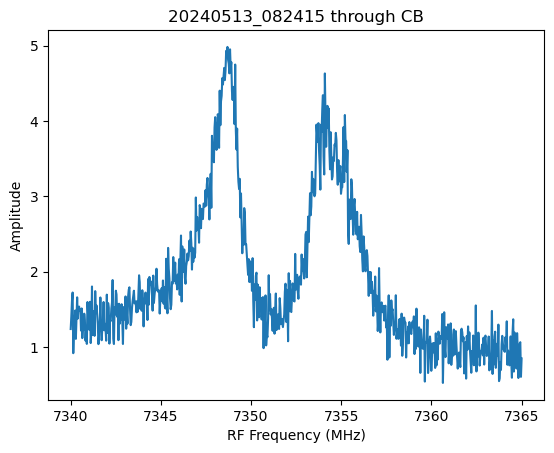

Creating dataset with series 20240513_082606
converting time variables from us to clock ticks
Saving data as: 20240513_082606_freq_scan_TL.h5


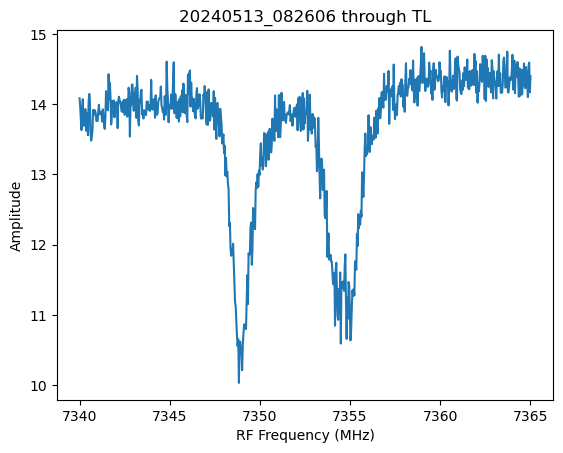

Creating dataset with series 20240513_082824
converting time variables from us to clock ticks
Saving data as: 20240513_082824_freq_scan_CB.h5


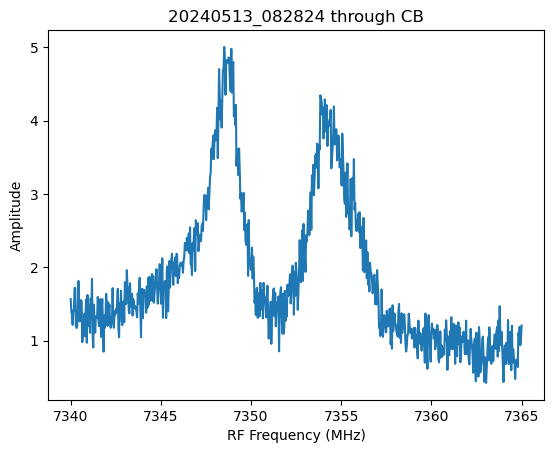

Creating dataset with series 20240513_083015
converting time variables from us to clock ticks
Saving data as: 20240513_083015_freq_scan_TL.h5


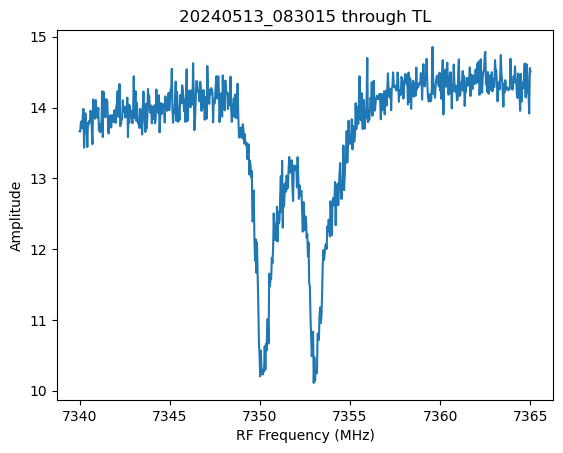

Creating dataset with series 20240513_083233
converting time variables from us to clock ticks
Saving data as: 20240513_083233_freq_scan_CB.h5


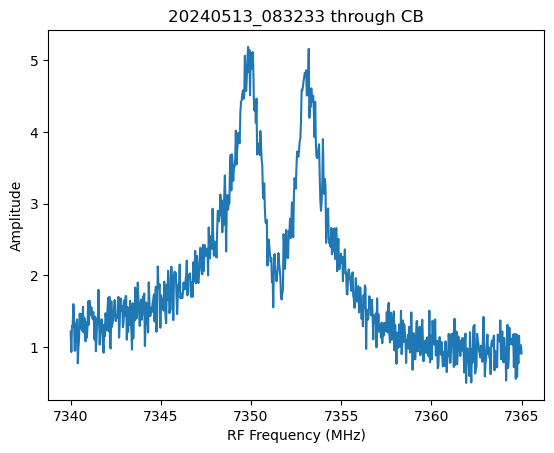

Creating dataset with series 20240513_083424
converting time variables from us to clock ticks
Saving data as: 20240513_083424_freq_scan_TL.h5


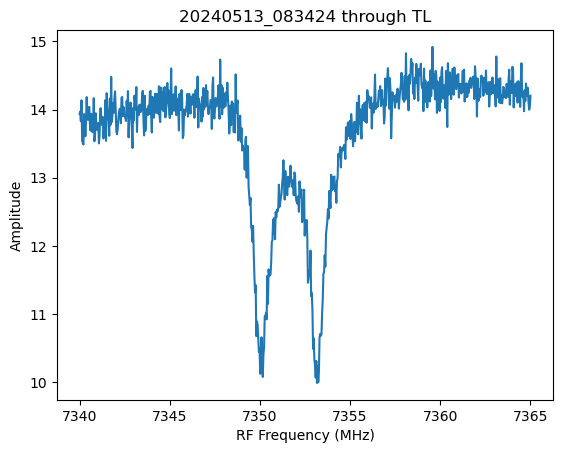

Creating dataset with series 20240513_083641
converting time variables from us to clock ticks
Saving data as: 20240513_083641_freq_scan_CB.h5


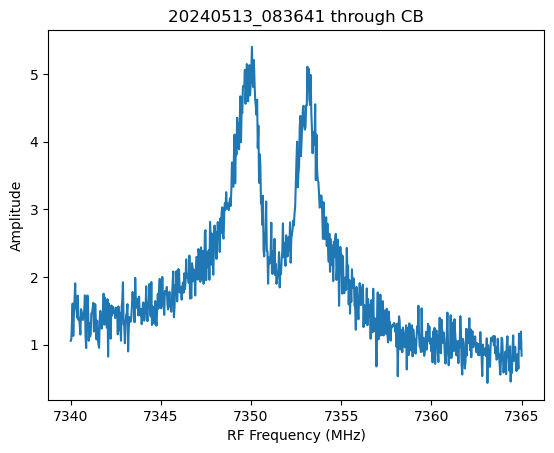

Creating dataset with series 20240513_083832
converting time variables from us to clock ticks
Saving data as: 20240513_083832_freq_scan_TL.h5


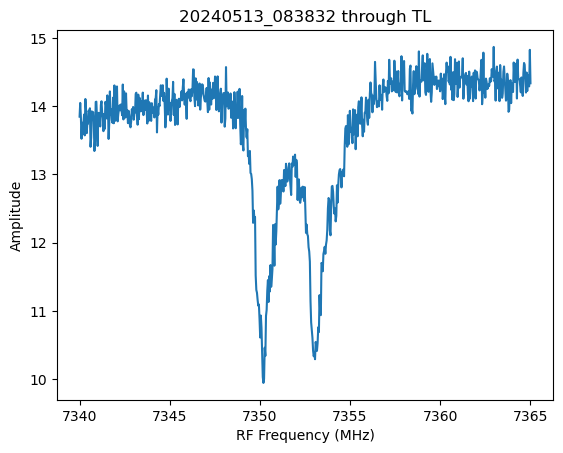

Creating dataset with series 20240513_084050
converting time variables from us to clock ticks
Saving data as: 20240513_084050_freq_scan_CB.h5


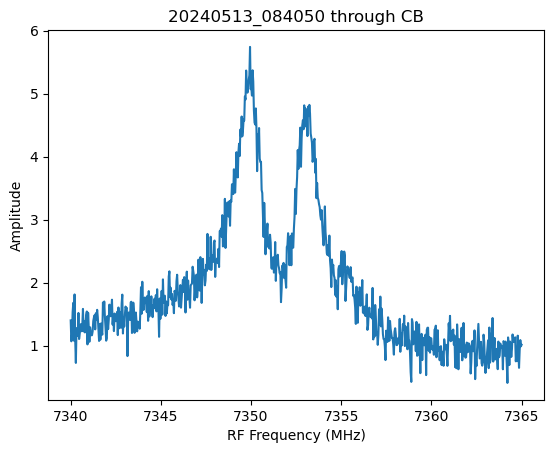

Creating dataset with series 20240513_084241
converting time variables from us to clock ticks
Saving data as: 20240513_084241_freq_scan_TL.h5


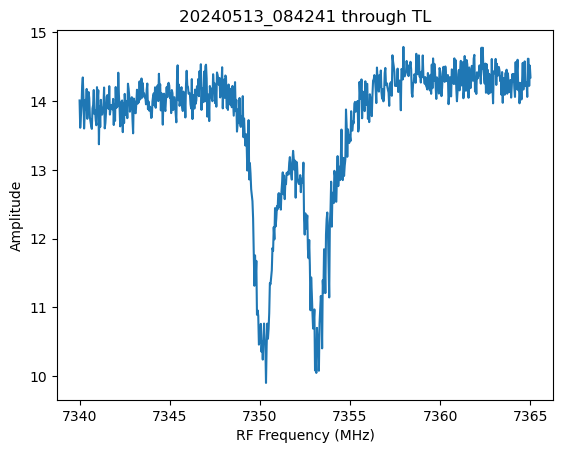

Creating dataset with series 20240513_084459
converting time variables from us to clock ticks
Saving data as: 20240513_084459_freq_scan_CB.h5


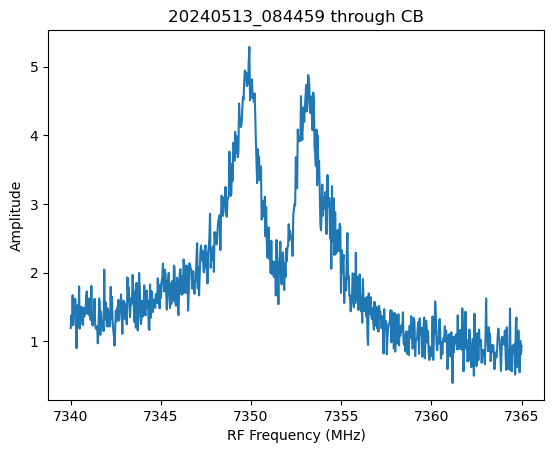

Creating dataset with series 20240513_084650
converting time variables from us to clock ticks
Saving data as: 20240513_084650_freq_scan_TL.h5


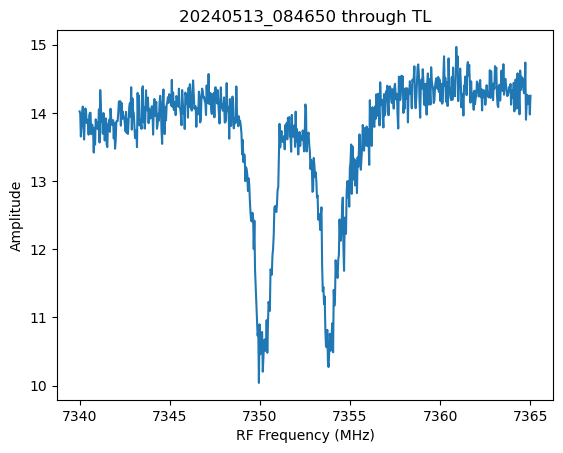

Creating dataset with series 20240513_084908
converting time variables from us to clock ticks
Saving data as: 20240513_084908_freq_scan_CB.h5


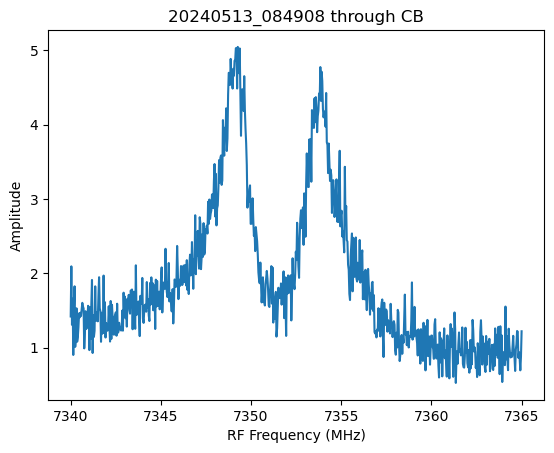

Creating dataset with series 20240513_085059
converting time variables from us to clock ticks
Saving data as: 20240513_085059_freq_scan_TL.h5


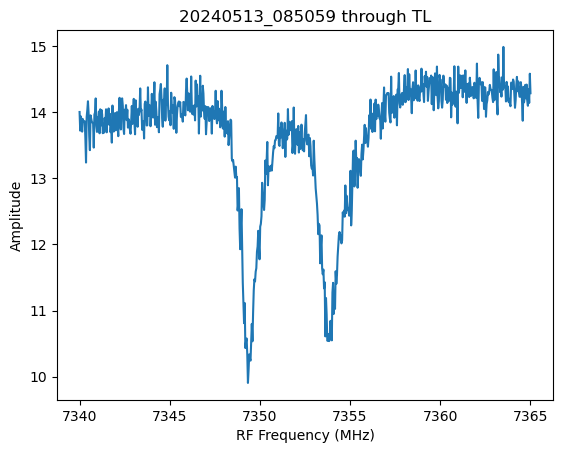

Creating dataset with series 20240513_085316
converting time variables from us to clock ticks
Saving data as: 20240513_085316_freq_scan_CB.h5


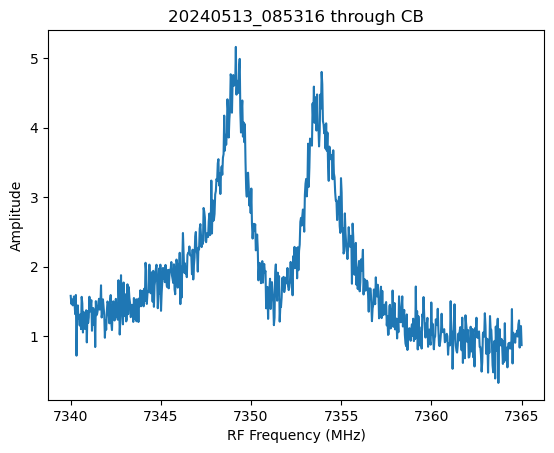

Creating dataset with series 20240513_085507
converting time variables from us to clock ticks
Saving data as: 20240513_085507_freq_scan_TL.h5


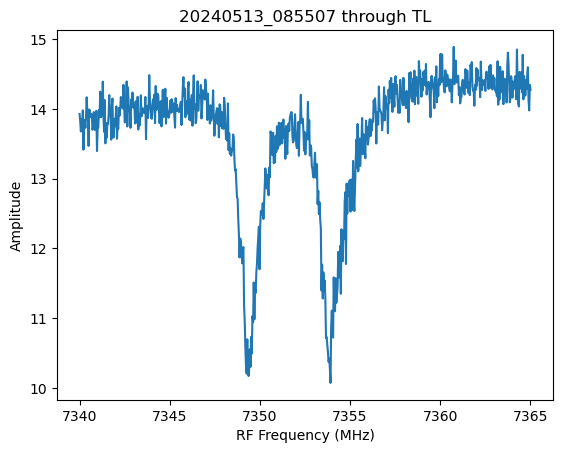

Creating dataset with series 20240513_085725
converting time variables from us to clock ticks
Saving data as: 20240513_085725_freq_scan_CB.h5


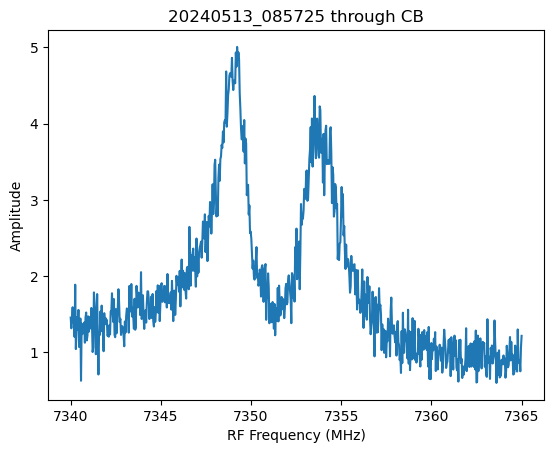

Creating dataset with series 20240513_085916
converting time variables from us to clock ticks
Saving data as: 20240513_085916_freq_scan_TL.h5


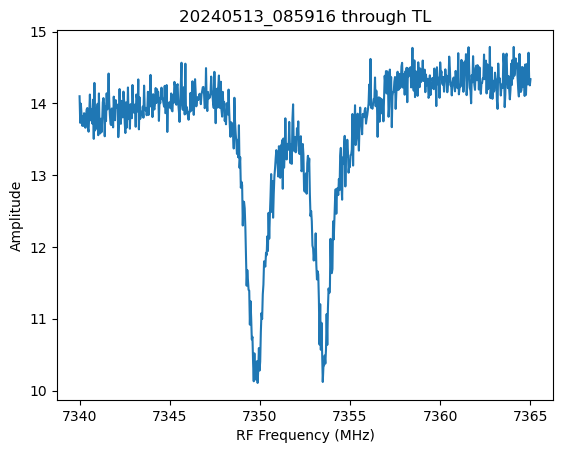

Creating dataset with series 20240513_090134
converting time variables from us to clock ticks
Saving data as: 20240513_090134_freq_scan_CB.h5


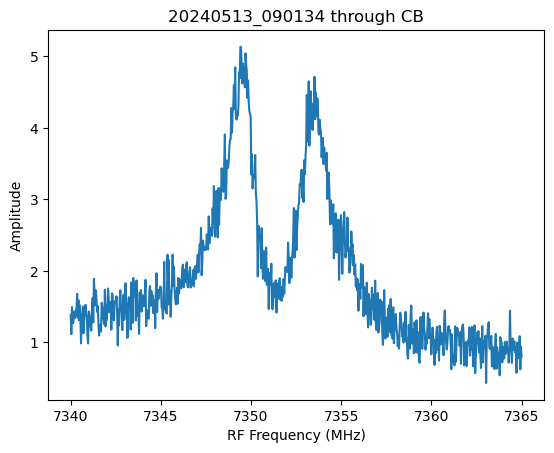

Creating dataset with series 20240513_090325
converting time variables from us to clock ticks
Saving data as: 20240513_090325_freq_scan_TL.h5


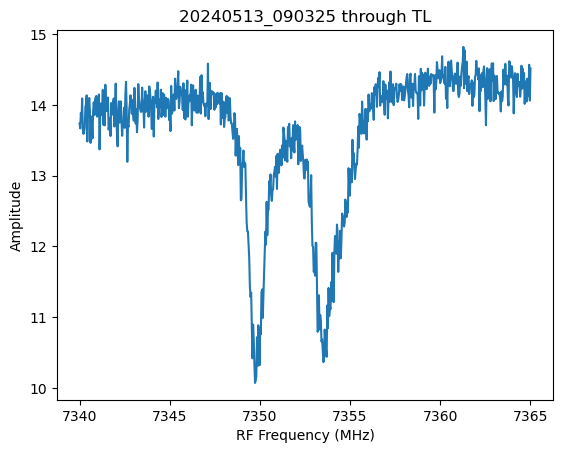

Creating dataset with series 20240513_090542
converting time variables from us to clock ticks
Saving data as: 20240513_090542_freq_scan_CB.h5


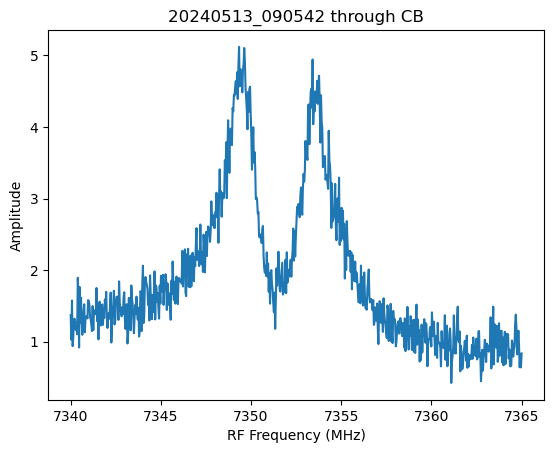

Creating dataset with series 20240513_090733
converting time variables from us to clock ticks
Saving data as: 20240513_090733_freq_scan_TL.h5


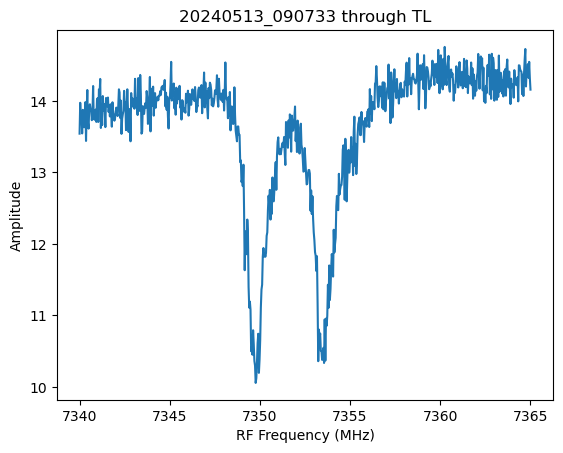

Creating dataset with series 20240513_090951
converting time variables from us to clock ticks
Saving data as: 20240513_090951_freq_scan_CB.h5


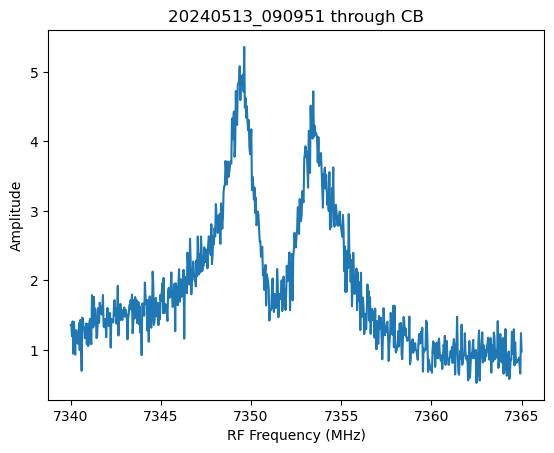

Creating dataset with series 20240513_091142
converting time variables from us to clock ticks
Saving data as: 20240513_091142_freq_scan_TL.h5


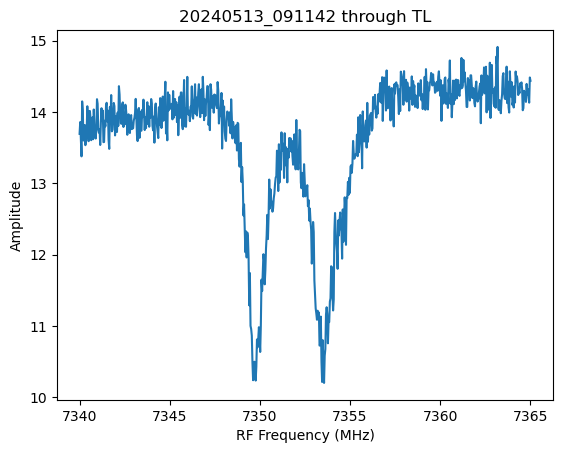

Creating dataset with series 20240513_091400
converting time variables from us to clock ticks
Saving data as: 20240513_091400_freq_scan_CB.h5


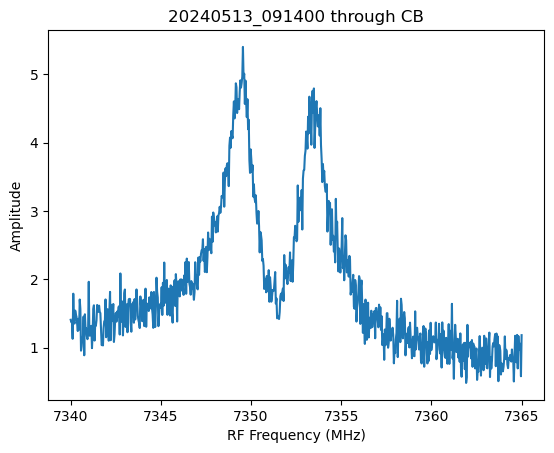

Creating dataset with series 20240513_091551
converting time variables from us to clock ticks
Saving data as: 20240513_091551_freq_scan_TL.h5


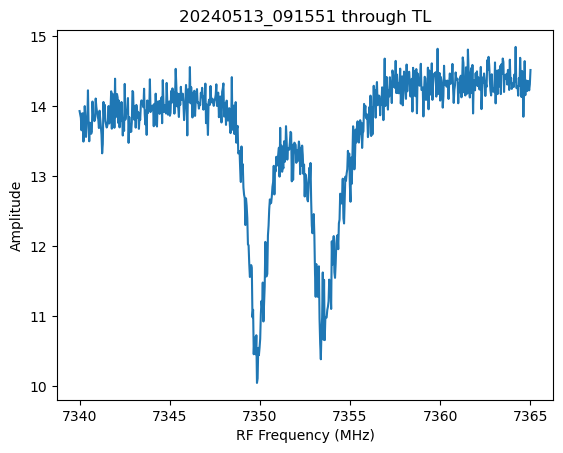

Creating dataset with series 20240513_091809
converting time variables from us to clock ticks
Saving data as: 20240513_091809_freq_scan_CB.h5


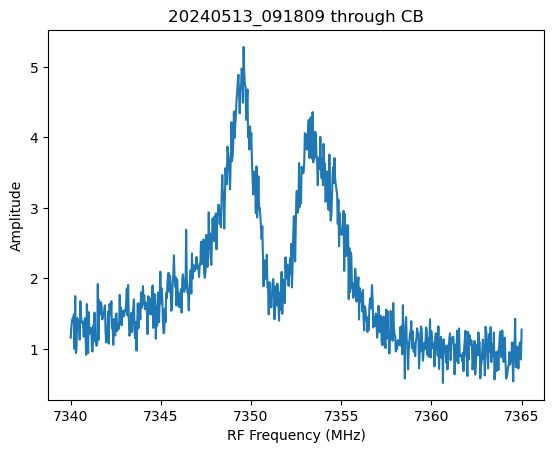

Creating dataset with series 20240513_091959
converting time variables from us to clock ticks
Saving data as: 20240513_091959_freq_scan_TL.h5


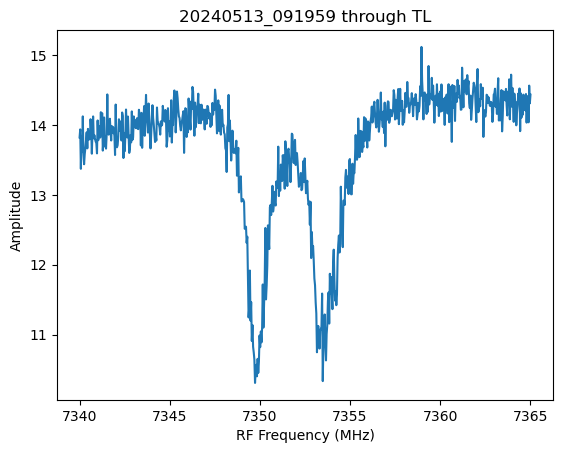

Creating dataset with series 20240513_092217
converting time variables from us to clock ticks
Saving data as: 20240513_092217_freq_scan_CB.h5


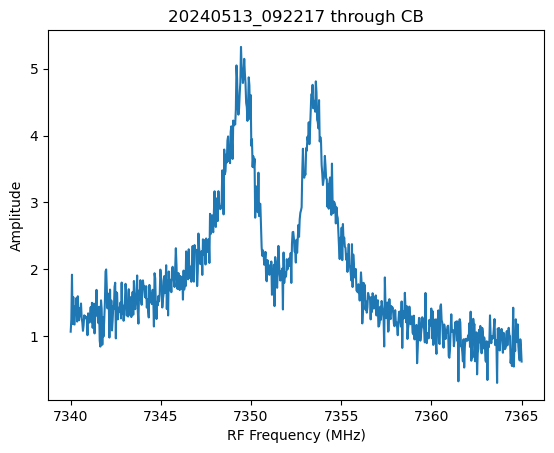

Creating dataset with series 20240513_092408
converting time variables from us to clock ticks
Saving data as: 20240513_092408_freq_scan_TL.h5


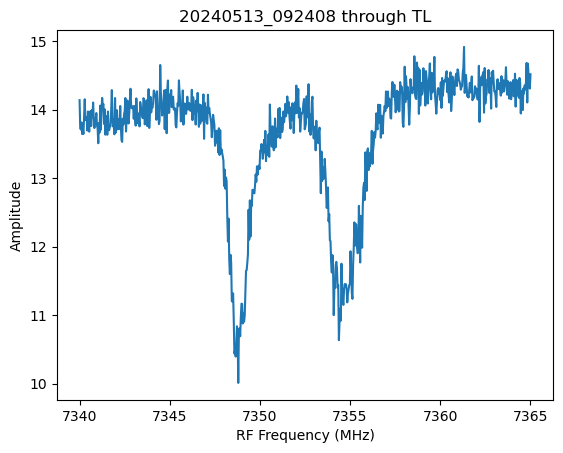

Creating dataset with series 20240513_092626
converting time variables from us to clock ticks
Saving data as: 20240513_092626_freq_scan_CB.h5


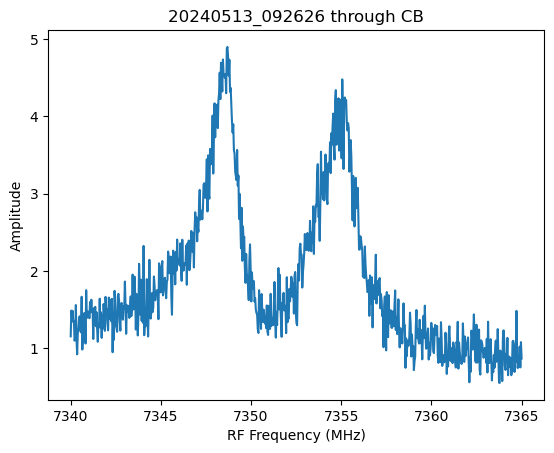

Creating dataset with series 20240513_092817
converting time variables from us to clock ticks
Saving data as: 20240513_092817_freq_scan_TL.h5


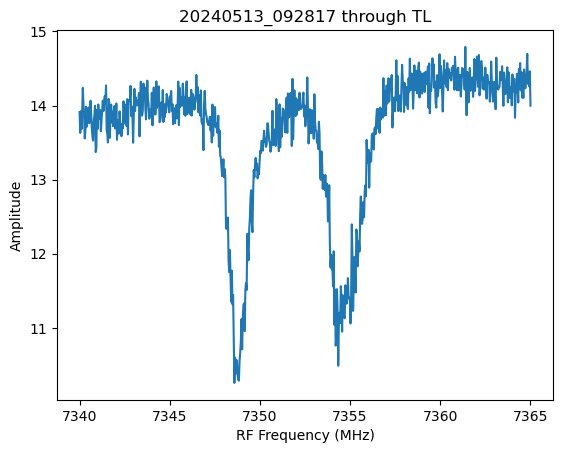

Creating dataset with series 20240513_093034
converting time variables from us to clock ticks
Saving data as: 20240513_093034_freq_scan_CB.h5


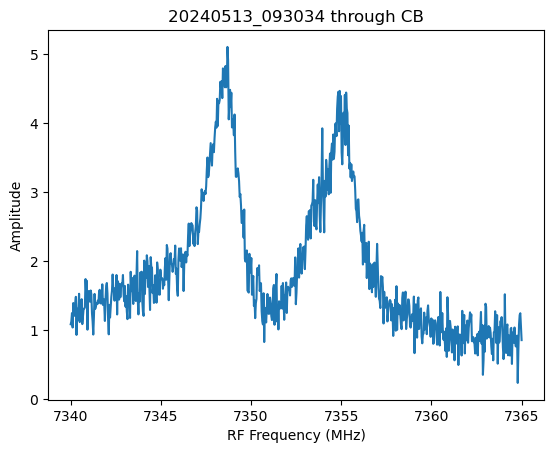

Creating dataset with series 20240513_093226
converting time variables from us to clock ticks
Saving data as: 20240513_093226_freq_scan_TL.h5


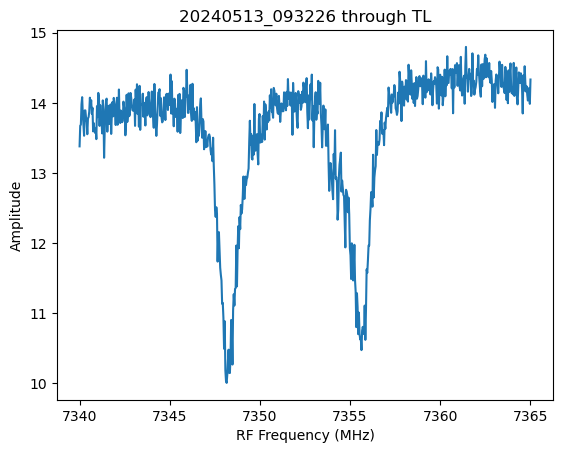

Creating dataset with series 20240513_093443
converting time variables from us to clock ticks
Saving data as: 20240513_093443_freq_scan_CB.h5


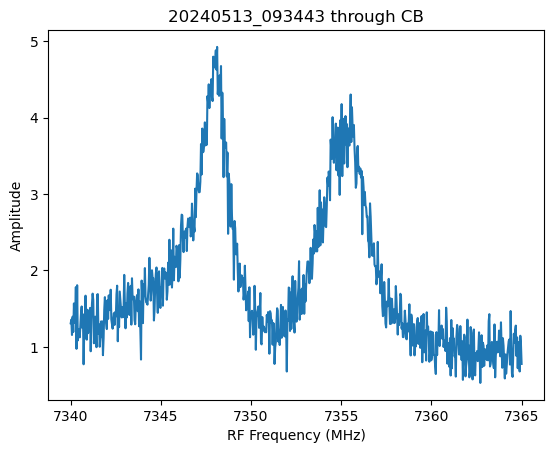

Creating dataset with series 20240513_093634
converting time variables from us to clock ticks
Saving data as: 20240513_093634_freq_scan_TL.h5


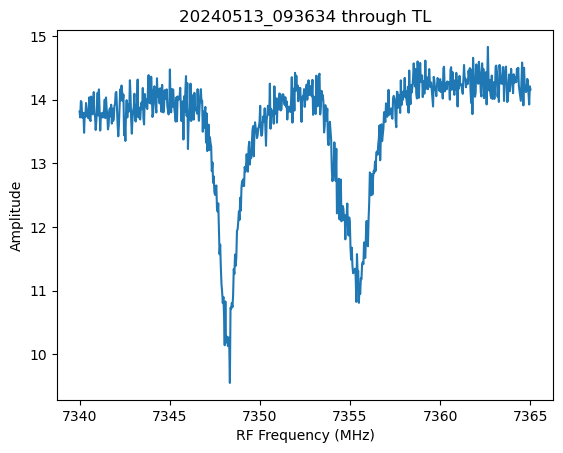

Creating dataset with series 20240513_093852
converting time variables from us to clock ticks
Saving data as: 20240513_093852_freq_scan_CB.h5


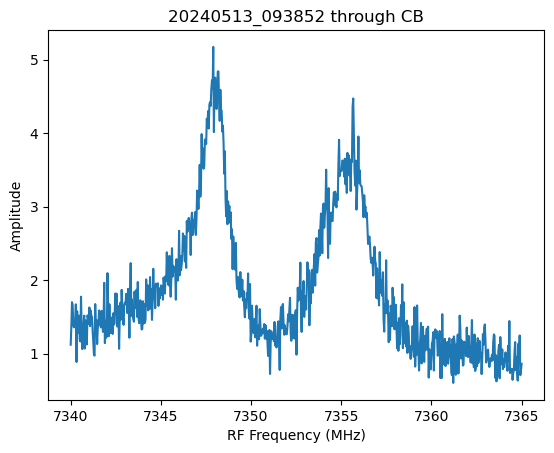

Creating dataset with series 20240513_094043
converting time variables from us to clock ticks
Saving data as: 20240513_094043_freq_scan_TL.h5


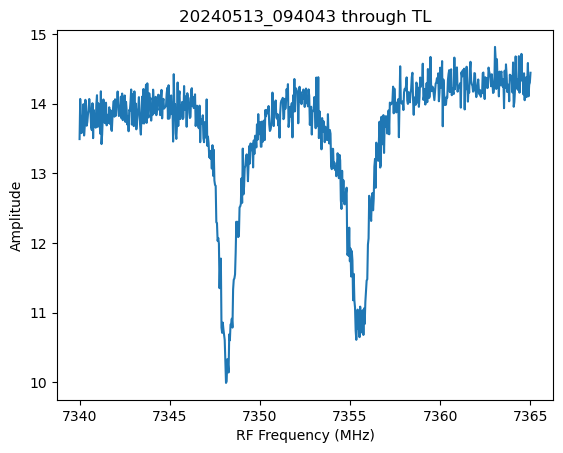

Creating dataset with series 20240513_094301
converting time variables from us to clock ticks
Saving data as: 20240513_094301_freq_scan_CB.h5


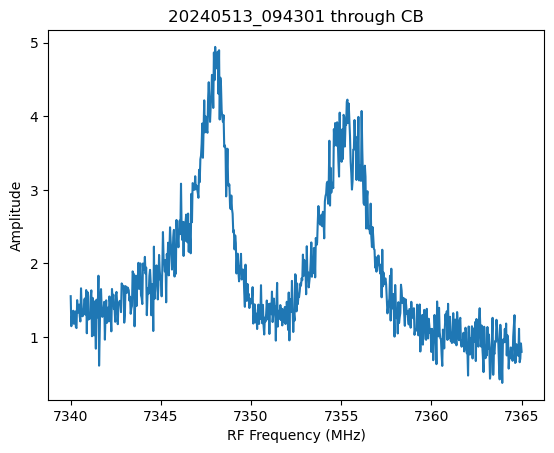

Creating dataset with series 20240513_094452
converting time variables from us to clock ticks
Saving data as: 20240513_094452_freq_scan_TL.h5


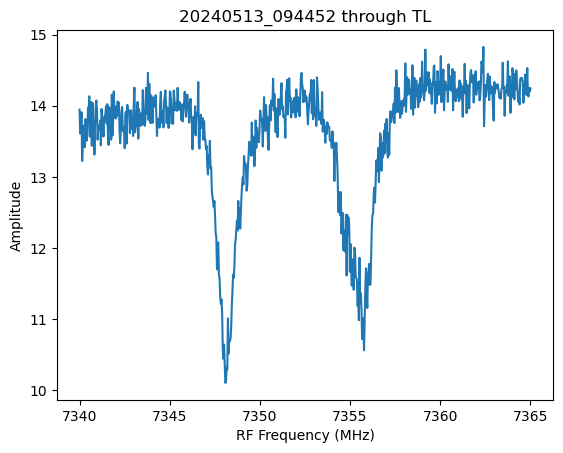

Creating dataset with series 20240513_094709
converting time variables from us to clock ticks
Saving data as: 20240513_094709_freq_scan_CB.h5


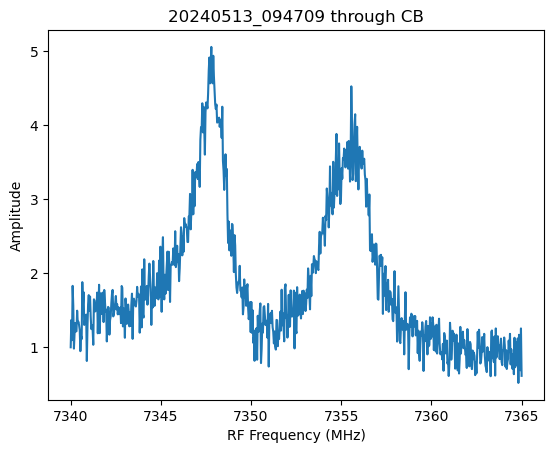

Creating dataset with series 20240513_094900
converting time variables from us to clock ticks
Saving data as: 20240513_094900_freq_scan_TL.h5


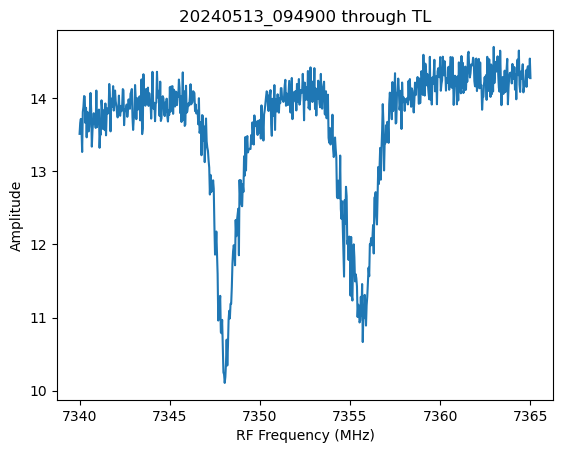

Creating dataset with series 20240513_095118
converting time variables from us to clock ticks
Saving data as: 20240513_095118_freq_scan_CB.h5


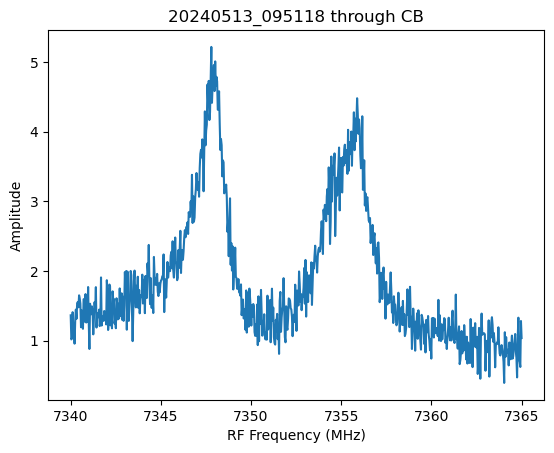

Creating dataset with series 20240513_095309
converting time variables from us to clock ticks
Saving data as: 20240513_095309_freq_scan_TL.h5


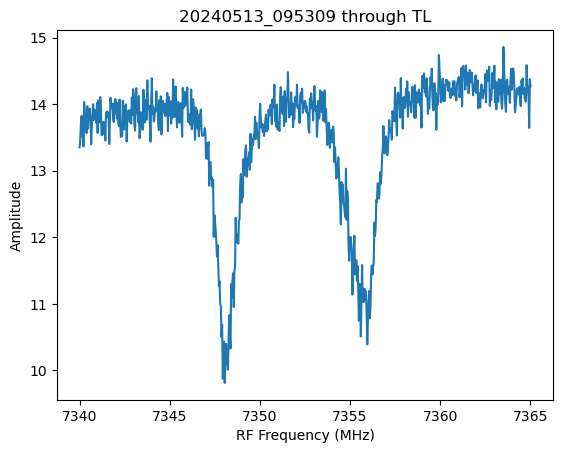

Creating dataset with series 20240513_095527
converting time variables from us to clock ticks
Saving data as: 20240513_095527_freq_scan_CB.h5


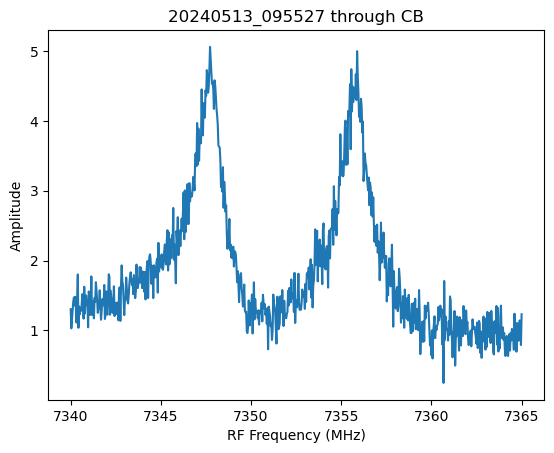

Creating dataset with series 20240513_095718
converting time variables from us to clock ticks
Saving data as: 20240513_095718_freq_scan_TL.h5


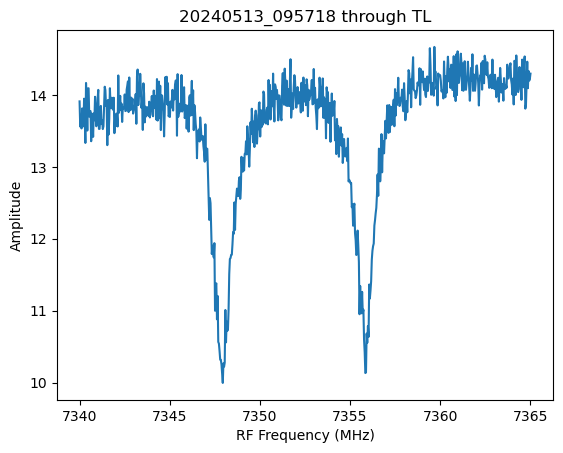

Creating dataset with series 20240513_095936
converting time variables from us to clock ticks
Saving data as: 20240513_095936_freq_scan_CB.h5


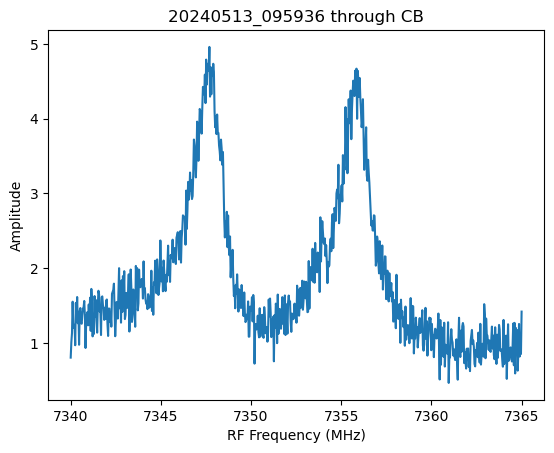

Creating dataset with series 20240513_100127
converting time variables from us to clock ticks
Saving data as: 20240513_100127_freq_scan_TL.h5


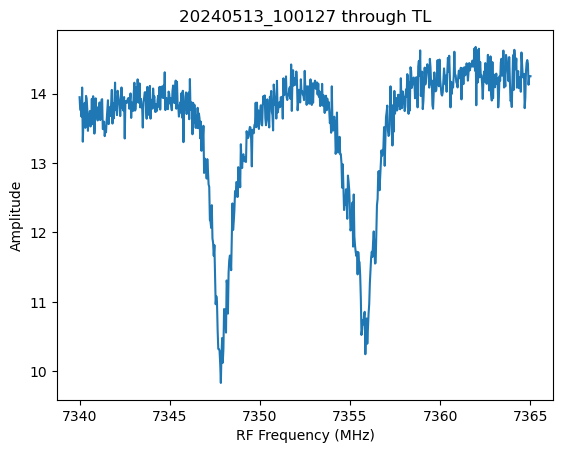

Creating dataset with series 20240513_100345
converting time variables from us to clock ticks
Saving data as: 20240513_100345_freq_scan_CB.h5


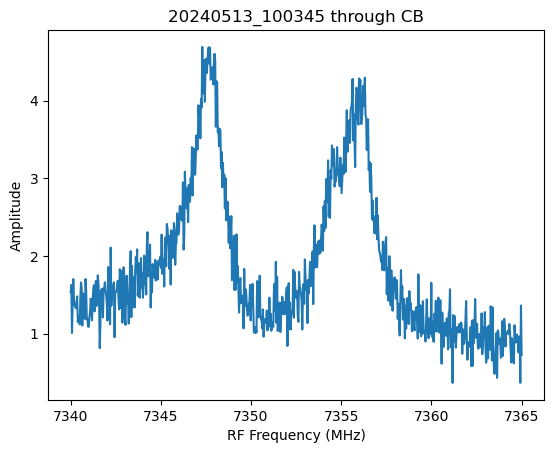

Creating dataset with series 20240513_100535
converting time variables from us to clock ticks
Saving data as: 20240513_100535_freq_scan_TL.h5


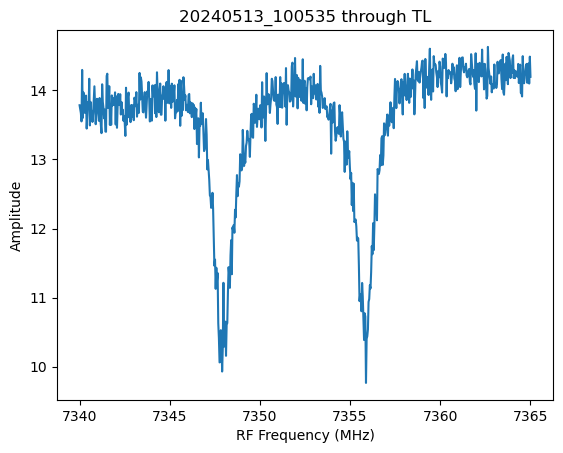

Creating dataset with series 20240513_100753
converting time variables from us to clock ticks
Saving data as: 20240513_100753_freq_scan_CB.h5


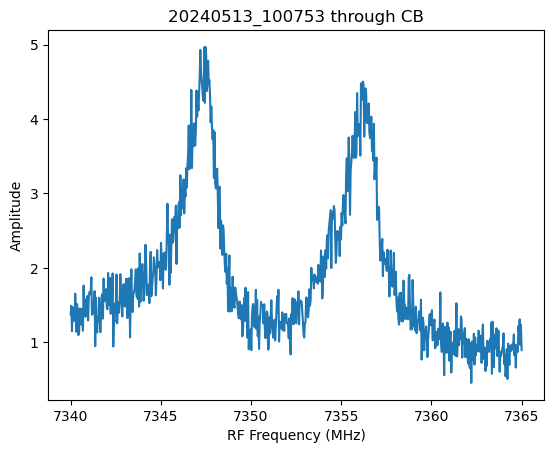

Creating dataset with series 20240513_100944
converting time variables from us to clock ticks
Saving data as: 20240513_100944_freq_scan_TL.h5


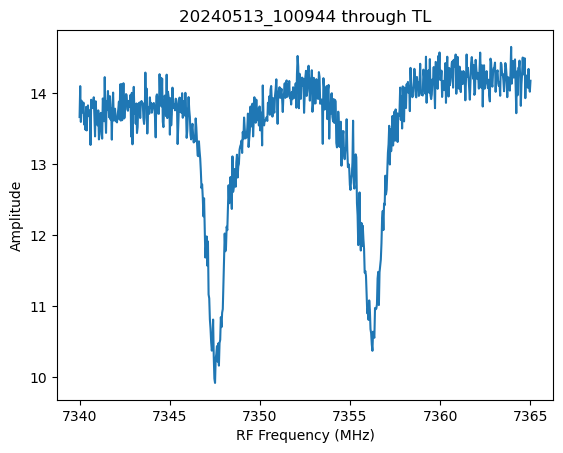

Creating dataset with series 20240513_101202
converting time variables from us to clock ticks
Saving data as: 20240513_101202_freq_scan_CB.h5


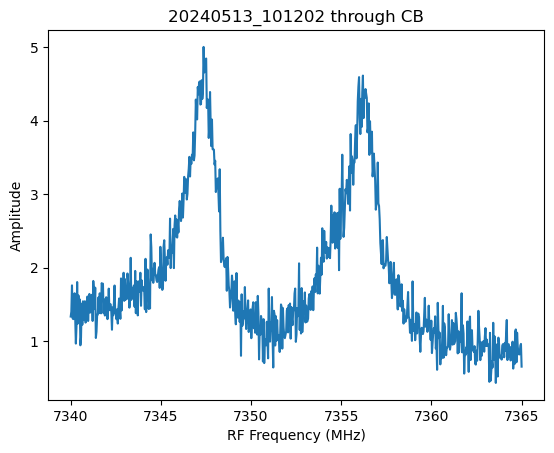

Creating dataset with series 20240513_101353
converting time variables from us to clock ticks
Saving data as: 20240513_101353_freq_scan_TL.h5


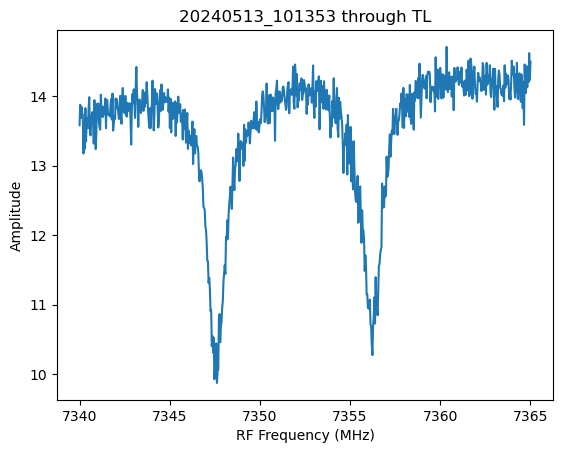

Creating dataset with series 20240513_101611
converting time variables from us to clock ticks
Saving data as: 20240513_101611_freq_scan_CB.h5


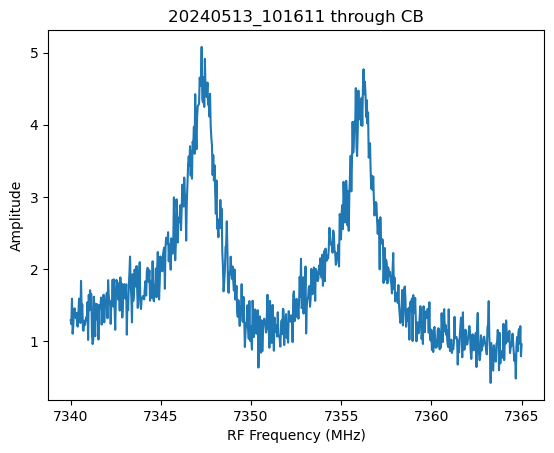

Creating dataset with series 20240513_101802
converting time variables from us to clock ticks
Saving data as: 20240513_101802_freq_scan_TL.h5


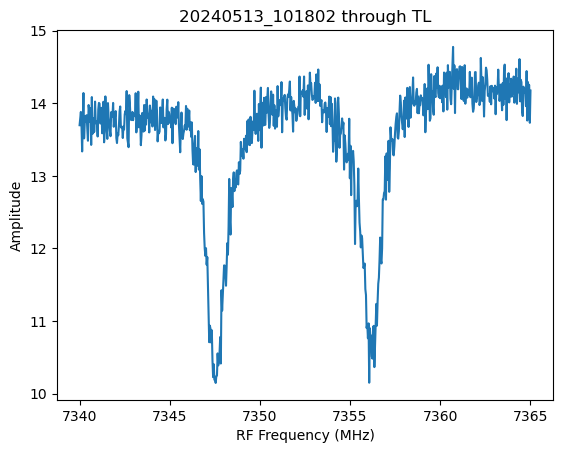

Creating dataset with series 20240513_102019
converting time variables from us to clock ticks
Saving data as: 20240513_102019_freq_scan_CB.h5


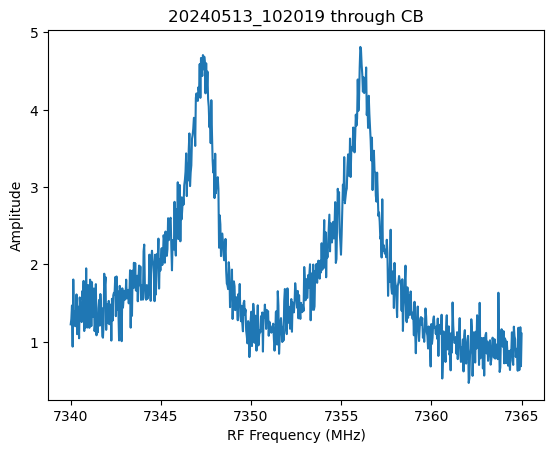

Creating dataset with series 20240513_102210
converting time variables from us to clock ticks
Saving data as: 20240513_102210_freq_scan_TL.h5


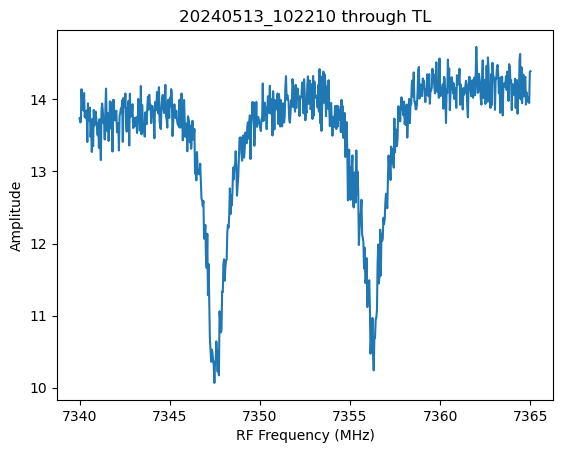

Creating dataset with series 20240513_102428
converting time variables from us to clock ticks
Saving data as: 20240513_102428_freq_scan_CB.h5


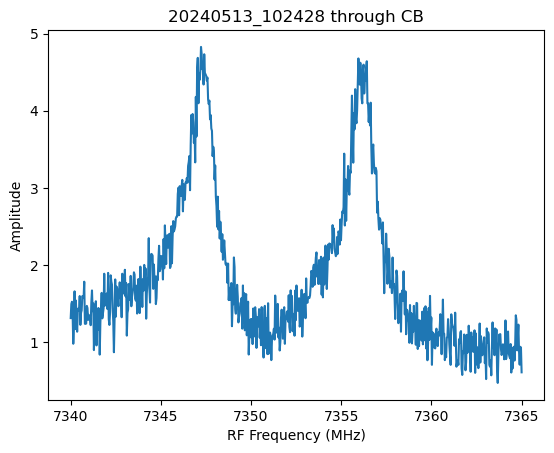

Creating dataset with series 20240513_102619
converting time variables from us to clock ticks
Saving data as: 20240513_102619_freq_scan_TL.h5


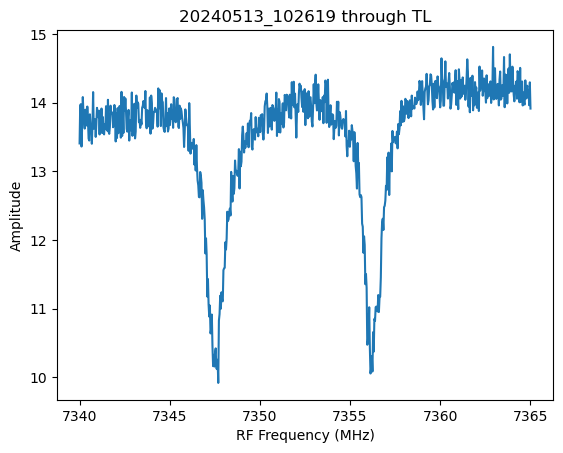

Creating dataset with series 20240513_102837
converting time variables from us to clock ticks
Saving data as: 20240513_102837_freq_scan_CB.h5


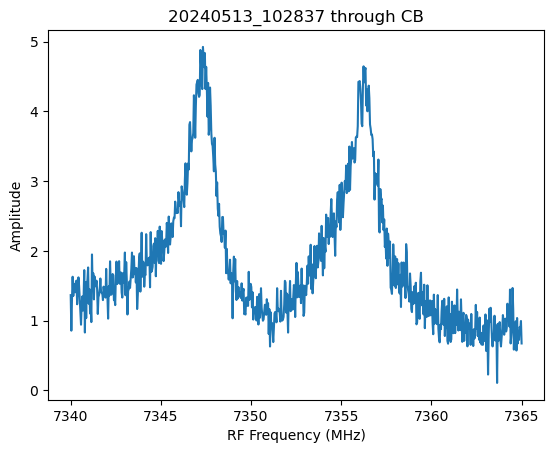

Creating dataset with series 20240513_103028
converting time variables from us to clock ticks
Saving data as: 20240513_103028_freq_scan_TL.h5


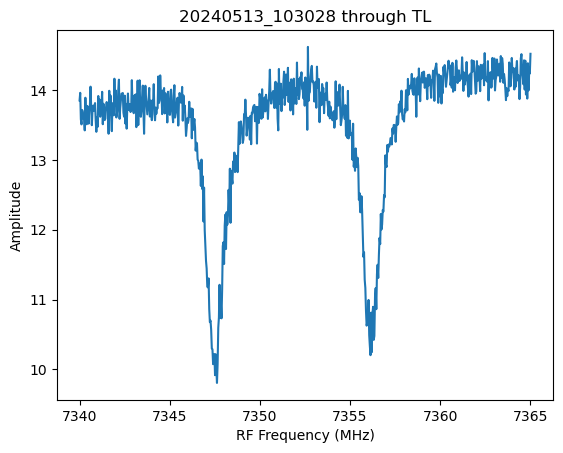

Creating dataset with series 20240513_103246
converting time variables from us to clock ticks
Saving data as: 20240513_103246_freq_scan_CB.h5


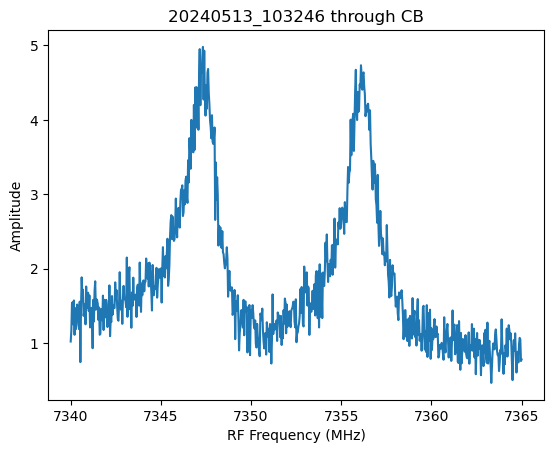

Creating dataset with series 20240513_103437
converting time variables from us to clock ticks
Saving data as: 20240513_103437_freq_scan_TL.h5


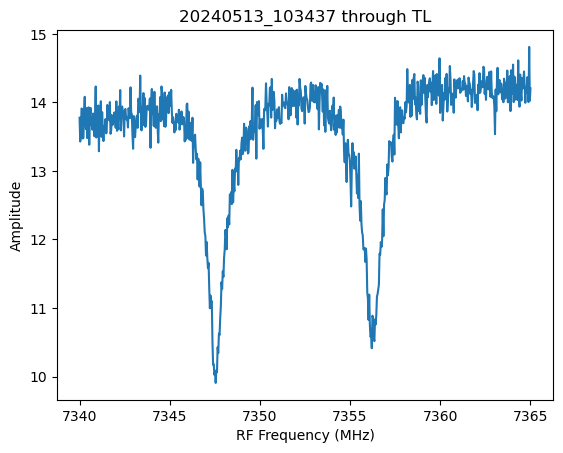

Creating dataset with series 20240513_103654
converting time variables from us to clock ticks
Saving data as: 20240513_103654_freq_scan_CB.h5


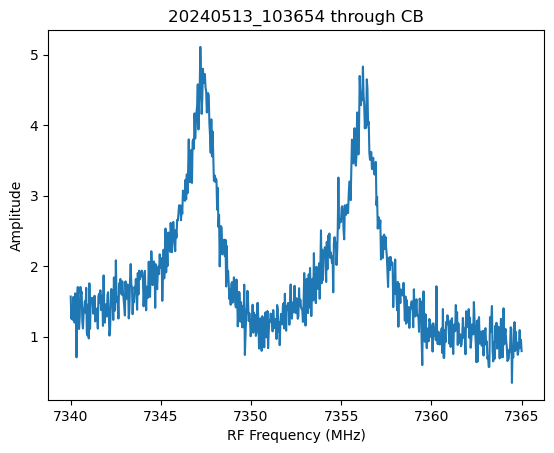

Creating dataset with series 20240513_103845
converting time variables from us to clock ticks
Saving data as: 20240513_103845_freq_scan_TL.h5


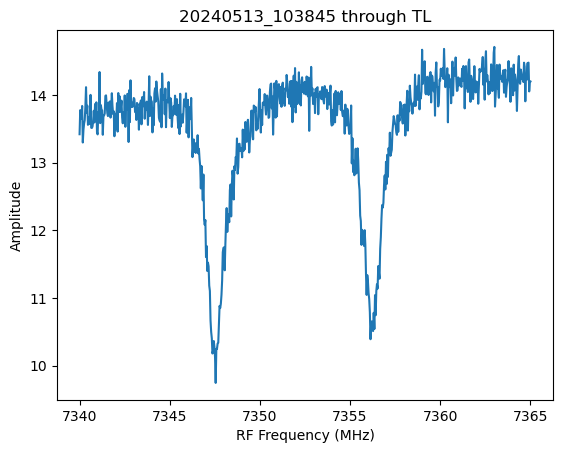

Creating dataset with series 20240513_104103
converting time variables from us to clock ticks
Saving data as: 20240513_104103_freq_scan_CB.h5


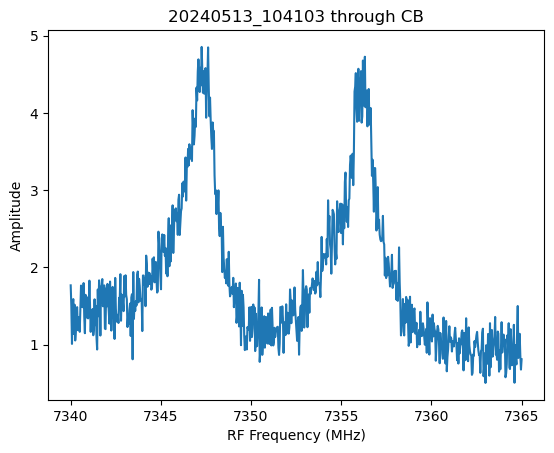

Creating dataset with series 20240513_104254
converting time variables from us to clock ticks
Saving data as: 20240513_104254_freq_scan_TL.h5


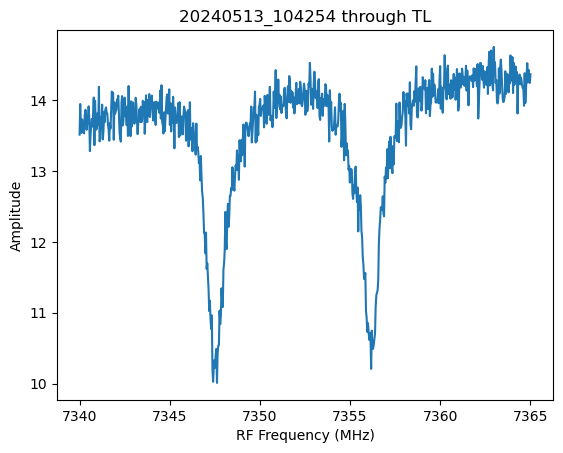

Creating dataset with series 20240513_104512
converting time variables from us to clock ticks
Saving data as: 20240513_104512_freq_scan_CB.h5


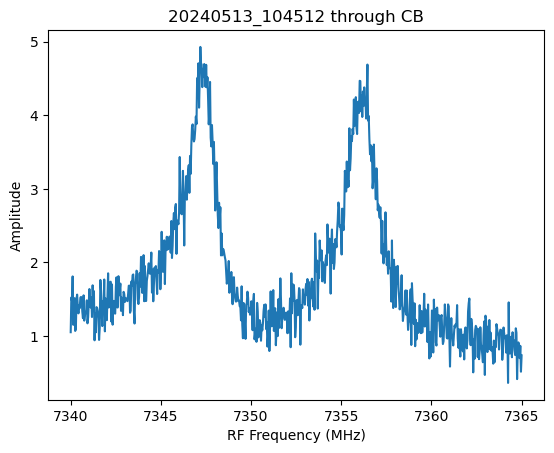

Creating dataset with series 20240513_104703
converting time variables from us to clock ticks
Saving data as: 20240513_104703_freq_scan_TL.h5


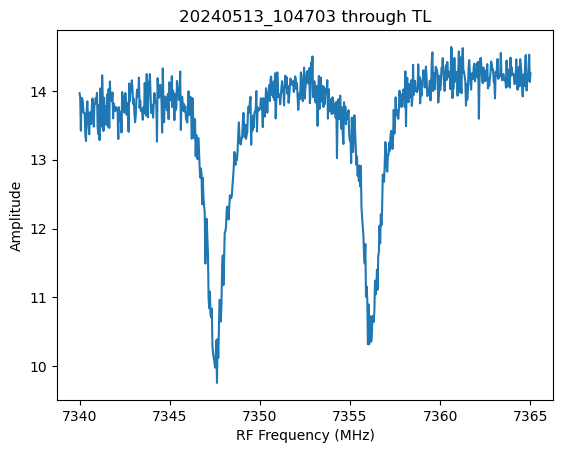

Creating dataset with series 20240513_104921
converting time variables from us to clock ticks
Saving data as: 20240513_104921_freq_scan_CB.h5


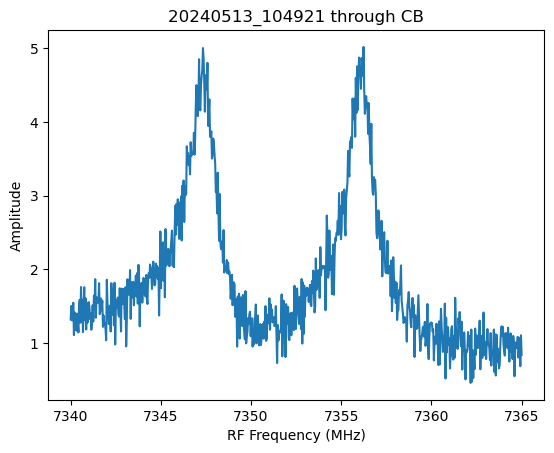

Creating dataset with series 20240513_105112
converting time variables from us to clock ticks
Saving data as: 20240513_105112_freq_scan_TL.h5


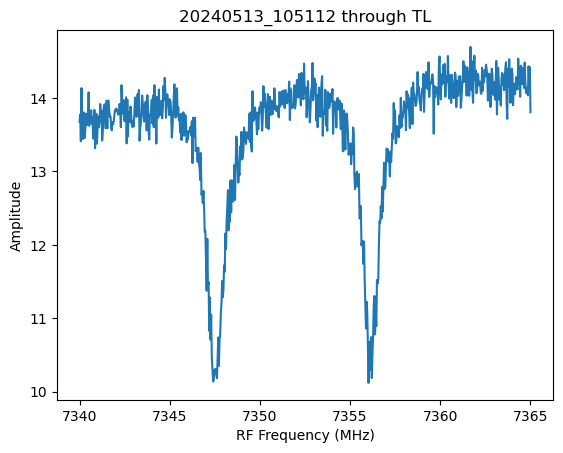

Creating dataset with series 20240513_105330
converting time variables from us to clock ticks
Saving data as: 20240513_105330_freq_scan_CB.h5


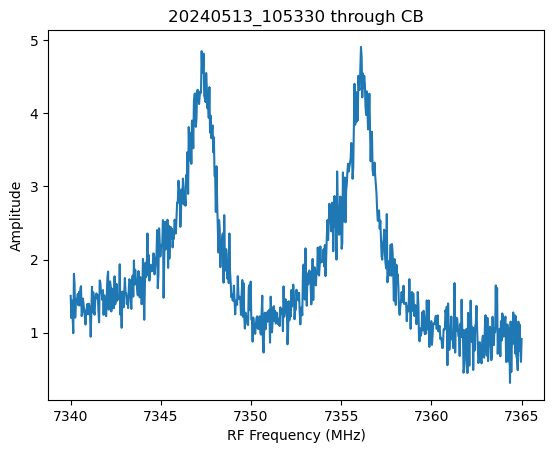

Creating dataset with series 20240513_105520
converting time variables from us to clock ticks
Saving data as: 20240513_105520_freq_scan_TL.h5


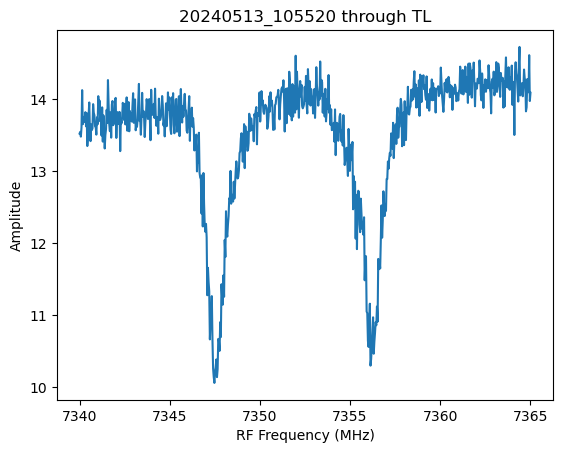

Creating dataset with series 20240513_105738
converting time variables from us to clock ticks
Saving data as: 20240513_105738_freq_scan_CB.h5


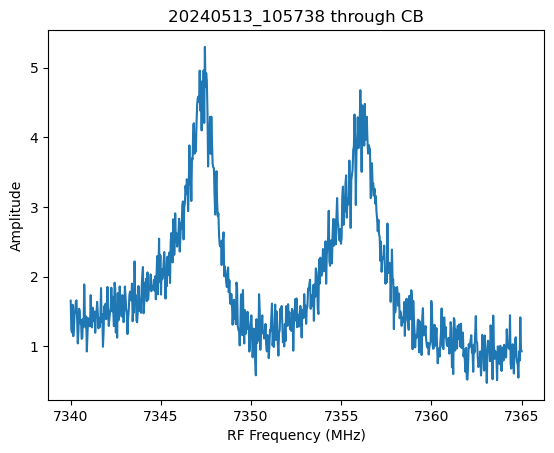

Creating dataset with series 20240513_105929
converting time variables from us to clock ticks
Saving data as: 20240513_105929_freq_scan_TL.h5


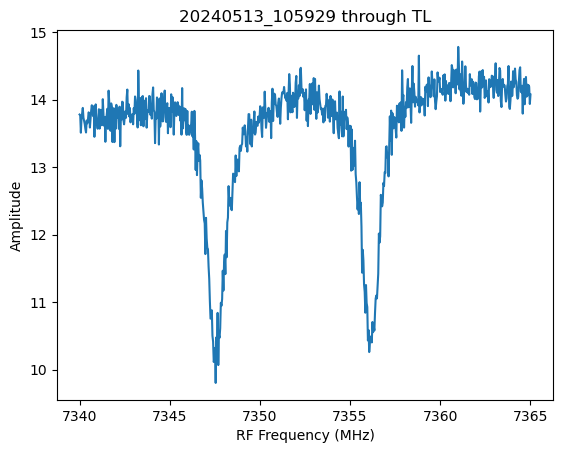

Creating dataset with series 20240513_110147
converting time variables from us to clock ticks
Saving data as: 20240513_110147_freq_scan_CB.h5


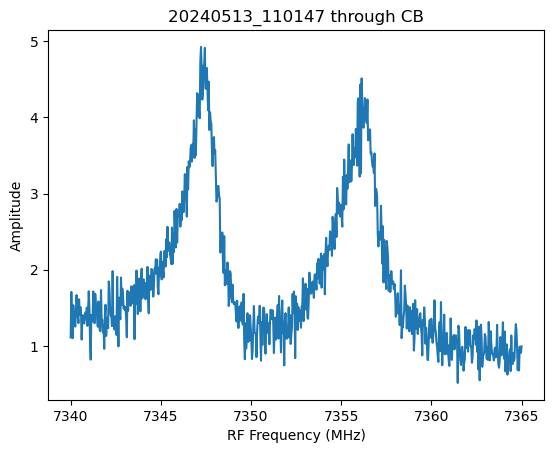

Creating dataset with series 20240513_110338
converting time variables from us to clock ticks
Saving data as: 20240513_110338_freq_scan_TL.h5


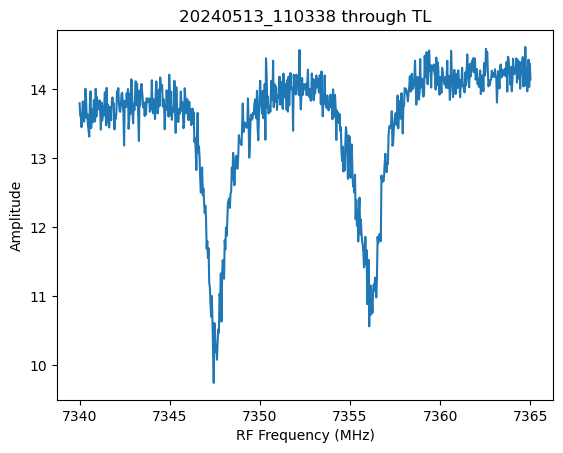

Creating dataset with series 20240513_110556
converting time variables from us to clock ticks
Saving data as: 20240513_110556_freq_scan_CB.h5


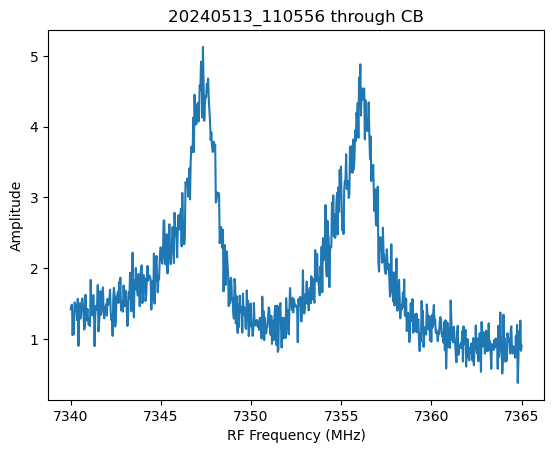

Creating dataset with series 20240513_110747
converting time variables from us to clock ticks
Saving data as: 20240513_110747_freq_scan_TL.h5


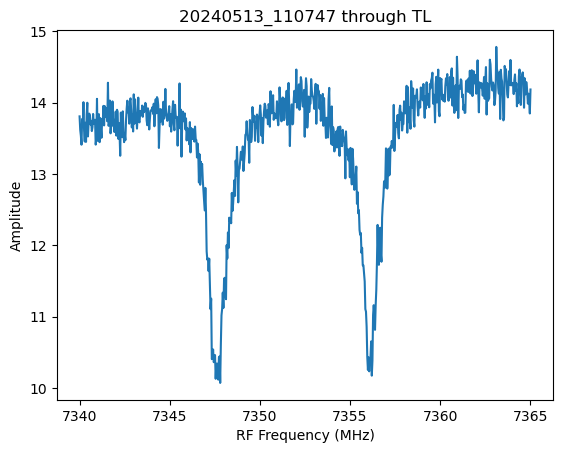

Creating dataset with series 20240513_111005
converting time variables from us to clock ticks
Saving data as: 20240513_111005_freq_scan_CB.h5


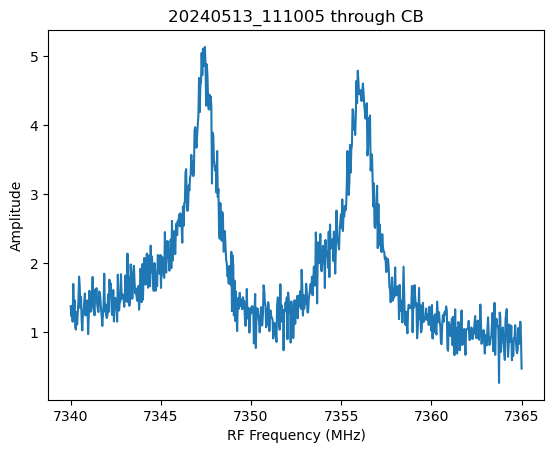

Creating dataset with series 20240513_111156
converting time variables from us to clock ticks
Saving data as: 20240513_111156_freq_scan_TL.h5


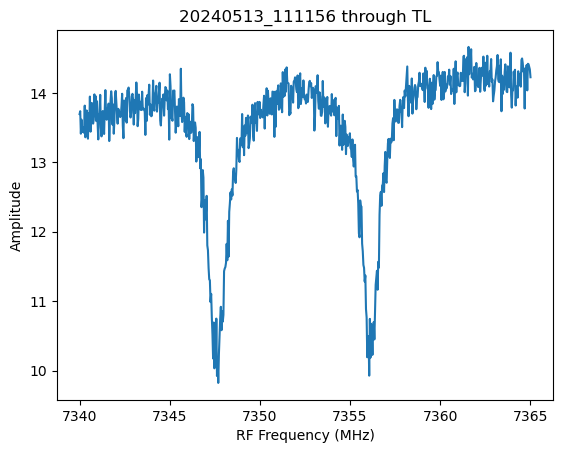

Creating dataset with series 20240513_111414
converting time variables from us to clock ticks
Saving data as: 20240513_111414_freq_scan_CB.h5


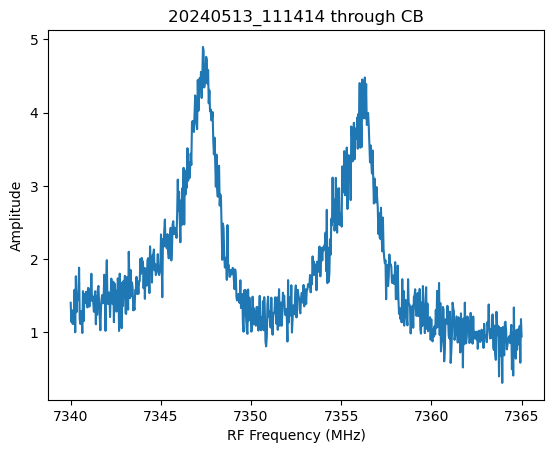

Creating dataset with series 20240513_111605
converting time variables from us to clock ticks
Saving data as: 20240513_111605_freq_scan_TL.h5


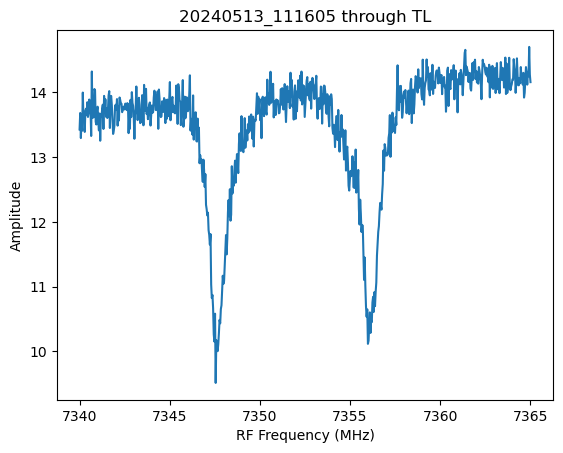

Creating dataset with series 20240513_111823
converting time variables from us to clock ticks
Saving data as: 20240513_111823_freq_scan_CB.h5


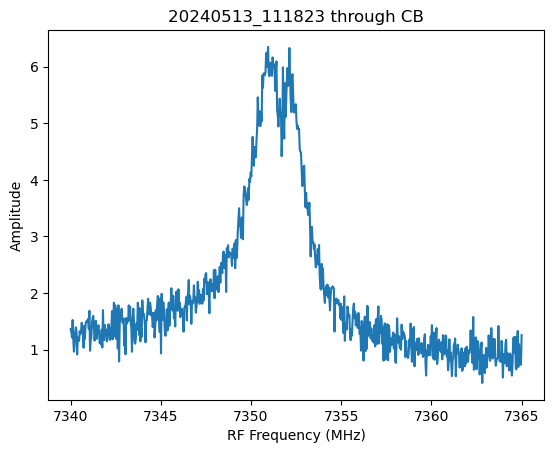

Creating dataset with series 20240513_112014
converting time variables from us to clock ticks
Saving data as: 20240513_112014_freq_scan_TL.h5


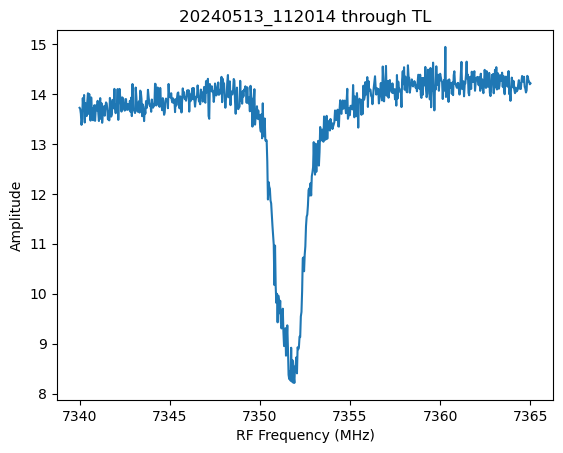

Creating dataset with series 20240513_112232
converting time variables from us to clock ticks
Saving data as: 20240513_112232_freq_scan_CB.h5


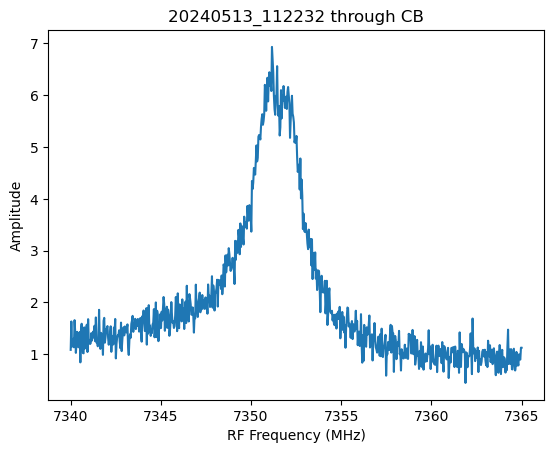

Creating dataset with series 20240513_112423
converting time variables from us to clock ticks
Saving data as: 20240513_112423_freq_scan_TL.h5


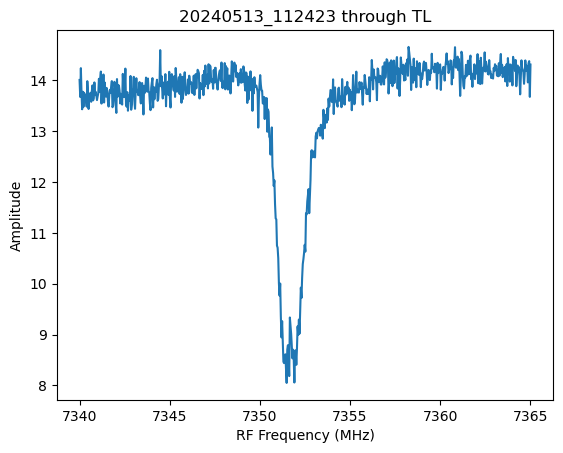

Creating dataset with series 20240513_112641
converting time variables from us to clock ticks
Saving data as: 20240513_112641_freq_scan_CB.h5


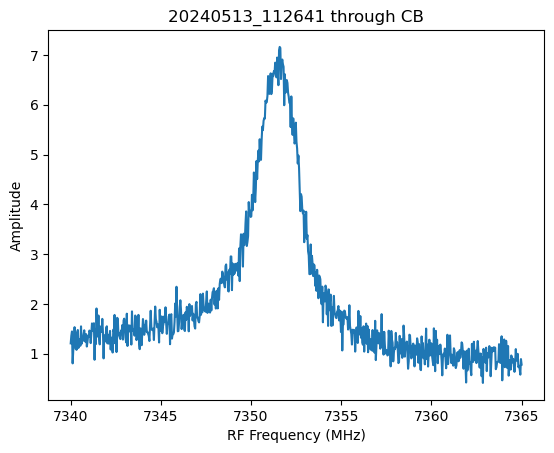

Creating dataset with series 20240513_112832
converting time variables from us to clock ticks


KeyboardInterrupt: 

In [20]:
TL_config = {   "relax_delay_us" : 0.4,
                "adc_trig_offset_us"  : 0.506,
                "readout_length_us"   : 2,
    
                "res_style" : "const",
                "res_length_us" : 2, #0.279,
                "res_phase"     : 0,
                "res_gain" : 6000,

                ## [Sweep param] "res_freq" : 3000,

                "reps"          : 50000,  ## Averages in firmware
                "soft_avgs"     : 1      ## Averages in software
        }

CB_config = {   "relax_delay_us" : 0.4,
                "adc_trig_offset_us"  : 0.506,
                "readout_length_us"   : 2,
    
                "res_style" : "const",
                "res_length_us" : 2, #0.279,
                "res_phase"     : 0,
                "res_gain" : 1000,

                ## [Sweep param] "res_freq" : 3000,

                "reps"          : 40000,  ## Averages in firmware
                "soft_avgs"     : 1      ## Averages in software
        }

RF_freqs = np.linspace(7340, 7365, num=700)

while True:
    freq_scan(res_ch=transmission_ch, config=TL_config, RF_freqs=RF_freqs, measname="TL", datapath=datapath)
    freq_scan(res_ch=chargebias_ch,   config=CB_config, RF_freqs=RF_freqs, measname="CB", datapath=datapath)

# Demonstrate Readin

Reading from filepath c:\_Data\2024-05-01_C11
Creating dataset with series 20240501_191743


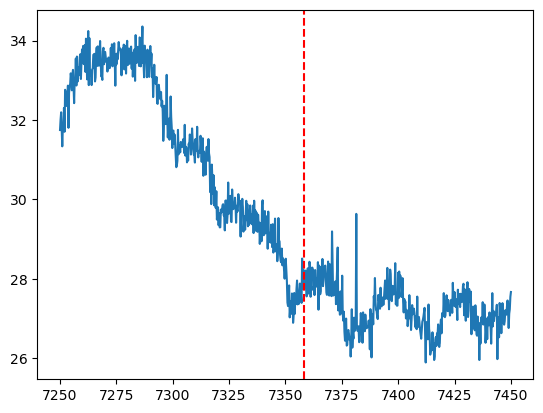

In [44]:
filename = "20240501_191743_freq_scan.h5"
readin = read_H5(datapath, filename, QICKdata)
plt.plot(readin.meas_data["RF_freqs"], np.sqrt(readin.meas_data["Ivals"]**2 + readin.meas_data["Qvals"]**2))
plt.axvline(7358, color='r', linestyle='--', label='7350MHz')
#plt.plot(meas.meas_data["RF_freqs"], np.sqrt(meas.meas_data["Ivals"]**2 + meas.meas_data["Qvals"]**2))